# Freesound Audio Taggin 2019 - Solution Part 2 (VGG16)


This is based upon 
- https://www.kaggle.com/daisukelab/cnn-2d-basic-solution-powered-by-fast-ai.
- Based on the 2nd version. https://www.kaggle.com/daisukelab/clf-to-multi-cnn-2d-basic-2-preprocessed-dataset
- Borrowing model from https://www.kaggle.com/mhiro2/simple-2d-cnn-classifier-with-pytorch
- Using preprocessed dataset. https://www.kaggle.com/daisukelab/fat2019_prep_mels1

Please read README.md for more information like SpecMix...

In [1]:
import os
from pathlib import Path
import pickle
import random
import time
import warnings
from io import StringIO
from csv import writer

import numpy as np
import pandas as pd
from scipy.stats import rankdata
from sklearn.model_selection import KFold
import librosa
import librosa.display
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import IPython
import IPython.display
import PIL
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F

from fastai import *
from fastai.vision import *
from fastai.vision.data import *
from fastai.callbacks import *

In [2]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

SEED = 2019
seed_everything(SEED)

In [3]:
TOY_MODE = False
TTA_SHIFT = 32  # TTA: predict every TTA_SHIFT
bs=128
n_splits = 10

In [4]:
DATA = Path('../input')
PREPROCESSED = Path('/media/eric/Data/freesound-audio-tagging-2019/preprocessed')
WORK = Path('work')
Path(WORK).mkdir(exist_ok=True, parents=True)
Path(PREPROCESSED).mkdir(exist_ok=True, parents=True)

CSV_TRN_CURATED = DATA/'train_curated.csv'
CSV_TRN_NOISY = DATA/'train_noisy.csv'
CSV_SUBMISSION = DATA/'sample_submission.csv'

MELS_TRN_CURATED = PREPROCESSED/'mels_train_curated.pkl'
MELS_TRN_NOISY = PREPROCESSED/'mels_train_noisy.pkl'
MELS_TEST = PREPROCESSED/'mels_test.pkl'

DATA_CURATED = DATA/'train_curated'
DATA_NOISY = DATA/'train_noisy'
DATA_TEST = DATA/'test'

trn_curated_df = pd.read_csv(CSV_TRN_CURATED)
trn_noisy_df = pd.read_csv(CSV_TRN_NOISY)
test_df = pd.read_csv(CSV_SUBMISSION)

In [5]:
# # Drop samples with incorrect label
# # Discussion from organizers: https://www.kaggle.com/c/freesound-audio-tagging-2019/discussion/93480
# useless = ['f76181c4.wav', '77b925c2.wav', '6a1f682a.wav', 'c7db12aa.wav', '7752cc8a.wav', '1d44b0bd.wav']
# trn_curated_df = trn_curated_df[~trn_curated_df.fname.isin(useless)]

### Audio conversion to 2D

Almost copyed from my repository: https://github.com/daisukelab/ml-sound-classifier

    Handle sampling rate 44.1kHz as is, no information loss.
    Size of each file will be 128 x L, L is audio seconds x 128; [128, 256] if sound is 2s long.
    Convert to Mel-spectrogram, not MFCC. We are handling general sound rather than human voice. https://en.wikipedia.org/wiki/Spectrogram



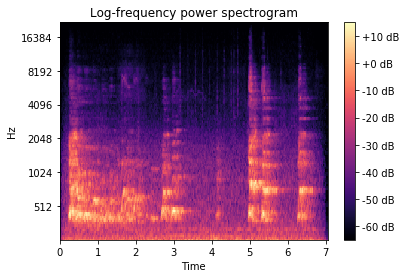

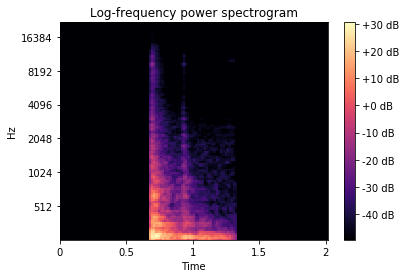

In [6]:
def read_audio(conf, pathname, trim_long_data):
    y, sr = librosa.load(pathname, sr=conf.sampling_rate)
    # trim silence
    if 0 < len(y): # workaround: 0 length causes error
        y, _ = librosa.effects.trim(y) # trim, top_db=default(60)
    # make it unified length to conf.samples
    if len(y) > conf.samples: # long enough
        if trim_long_data:
            y = y[0:0+conf.samples]
    else: # pad blank
        padding = conf.samples - len(y)    # add padding at both ends
        offset = padding // 2
        y = np.pad(y, (offset, conf.samples - len(y) - offset), 'constant')
    return y

def audio_to_melspectrogram(conf, audio):
    spectrogram = librosa.feature.melspectrogram(audio, 
                                                 sr=conf.sampling_rate,
                                                 n_mels=conf.n_mels,
                                                 hop_length=conf.hop_length,
                                                 n_fft=conf.n_fft,
                                                 fmin=conf.fmin,
                                                 fmax=conf.fmax)
    spectrogram = librosa.power_to_db(spectrogram)
    spectrogram = spectrogram.astype(np.float32)
    return spectrogram

def show_melspectrogram(conf, mels, title='Log-frequency power spectrogram'):
    librosa.display.specshow(mels, x_axis='time', y_axis='mel', 
                             sr=conf.sampling_rate, hop_length=conf.hop_length,
                            fmin=conf.fmin, fmax=conf.fmax)
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

def read_as_melspectrogram(conf, pathname, trim_long_data, debug_display=False):
    x = read_audio(conf, pathname, trim_long_data)
    mels = audio_to_melspectrogram(conf, x)
    if debug_display:
        IPython.display.display(IPython.display.Audio(x, rate=conf.sampling_rate))
        show_melspectrogram(conf, mels)
    return mels


class conf:
    # Preprocessing settings
    sampling_rate = 44100
    duration = 2
    hop_length = 347*duration # to make time steps 128
    fmin = 20
    fmax = sampling_rate // 2
    n_mels = 128
    n_fft = n_mels * 20
    samples = sampling_rate * duration


# example
x = read_as_melspectrogram(conf, DATA_CURATED/'0006ae4e.wav', trim_long_data=False, debug_display=True)
x = read_as_melspectrogram(conf, DATA_CURATED/'05e4ad19.wav', trim_long_data=False, debug_display=True)

### Making 2D mel-spectrogram data as 2D 3ch images

So that normal CNN image classifier can handle.

In [7]:
def mono_to_color(X, mean=None, std=None, norm_max=None, norm_min=None, eps=1e-6):
    # Stack X as [X,X,X]
    X = np.stack([X, X, X], axis=-1)

    # Standardize
    mean = mean or X.mean()
    std = std or X.std()
    Xstd = (X - mean) / (std + eps)
    _min, _max = Xstd.min(), Xstd.max()
    norm_max = norm_max or _max
    norm_min = norm_min or _min
    if (_max - _min) > eps:
        # Scale to [0, 255]
        V = Xstd
        V[V < norm_min] = norm_min
        V[V > norm_max] = norm_max
        V = 255 * (V - norm_min) / (norm_max - norm_min)
        V = V.astype(np.uint8)
    else:
        # Just zero
        V = np.zeros_like(Xstd, dtype=np.uint8)
    return V

def convert_wav_to_image(df, source, img_dest):
    print(f'Converting {source} -> {img_dest}')
    X = []
    for i, row in tqdm_notebook(df.iterrows(), total=df.shape[0]):
        x = read_as_melspectrogram(conf, source/str(row.fname), trim_long_data=False)
        x_color = mono_to_color(x)
        X.append(x_color)
    pickle.dump(X, open(img_dest, 'wb'))
    return X

In [8]:
if not MELS_TRN_CURATED.is_file():
    convert_wav_to_image(trn_curated_df, source=DATA_CURATED, img_dest=MELS_TRN_CURATED)   

if not MELS_TRN_NOISY.is_file():
    convert_wav_to_image(trn_noisy_df, source=DATA_NOISY, img_dest=MELS_TRN_NOISY)   

if not MELS_TEST.is_file():
    convert_wav_to_image(test_df, source=DATA_TEST, img_dest=MELS_TEST)    

### Official Metric

In [9]:
# from official code https://colab.research.google.com/drive/1AgPdhSp7ttY18O3fEoHOQKlt_3HJDLi8#scrollTo=cRCaCIb9oguU
def _one_sample_positive_class_precisions(scores, truth):
    """Calculate precisions for each true class for a single sample.

    Args:
      scores: np.array of (num_classes,) giving the individual classifier scores.
      truth: np.array of (num_classes,) bools indicating which classes are true.

    Returns:
      pos_class_indices: np.array of indices of the true classes for this sample.
      pos_class_precisions: np.array of precisions corresponding to each of those
        classes.
    """
    num_classes = scores.shape[0]
    pos_class_indices = np.flatnonzero(truth > 0)
    # Only calculate precisions if there are some true classes.
    if not len(pos_class_indices):
        return pos_class_indices, np.zeros(0)
    # Retrieval list of classes for this sample.
    retrieved_classes = np.argsort(scores)[::-1]
    # class_rankings[top_scoring_class_index] == 0 etc.
    class_rankings = np.zeros(num_classes, dtype=np.int)
    class_rankings[retrieved_classes] = range(num_classes)
    # Which of these is a true label?
    retrieved_class_true = np.zeros(num_classes, dtype=np.bool)
    retrieved_class_true[class_rankings[pos_class_indices]] = True
    # Num hits for every truncated retrieval list.
    retrieved_cumulative_hits = np.cumsum(retrieved_class_true)
    # Precision of retrieval list truncated at each hit, in order of pos_labels.
    precision_at_hits = (
            retrieved_cumulative_hits[class_rankings[pos_class_indices]] /
            (1 + class_rankings[pos_class_indices].astype(np.float)))
    return pos_class_indices, precision_at_hits


def calculate_per_class_lwlrap(truth, scores):
    """Calculate label-weighted label-ranking average precision.

    Arguments:
      truth: np.array of (num_samples, num_classes) giving boolean ground-truth
        of presence of that class in that sample.
      scores: np.array of (num_samples, num_classes) giving the classifier-under-
        test's real-valued score for each class for each sample.

    Returns:
      per_class_lwlrap: np.array of (num_classes,) giving the lwlrap for each
        class.
      weight_per_class: np.array of (num_classes,) giving the prior of each
        class within the truth labels.  Then the overall unbalanced lwlrap is
        simply np.sum(per_class_lwlrap * weight_per_class)
    """
    assert truth.shape == scores.shape
    num_samples, num_classes = scores.shape
    # Space to store a distinct precision value for each class on each sample.
    # Only the classes that are true for each sample will be filled in.
    precisions_for_samples_by_classes = np.zeros((num_samples, num_classes))
    for sample_num in range(num_samples):
        pos_class_indices, precision_at_hits = (
            _one_sample_positive_class_precisions(scores[sample_num, :],
                                                  truth[sample_num, :]))
        precisions_for_samples_by_classes[sample_num, pos_class_indices] = (
            precision_at_hits)
    labels_per_class = np.sum(truth > 0, axis=0)
    weight_per_class = labels_per_class / float(np.sum(labels_per_class))
    # Form average of each column, i.e. all the precisions assigned to labels in
    # a particular class.
    per_class_lwlrap = (np.sum(precisions_for_samples_by_classes, axis=0) /
                        np.maximum(1, labels_per_class))
    # overall_lwlrap = simple average of all the actual per-class, per-sample precisions
    #                = np.sum(precisions_for_samples_by_classes) / np.sum(precisions_for_samples_by_classes > 0)
    #           also = weighted mean of per-class lwlraps, weighted by class label prior across samples
    #                = np.sum(per_class_lwlrap * weight_per_class)
    return per_class_lwlrap, weight_per_class


# Accumulator object version.

class lwlrap_accumulator(object):
  """Accumulate batches of test samples into per-class and overall lwlrap."""  

  def __init__(self):
    self.num_classes = 0
    self.total_num_samples = 0
  
  def accumulate_samples(self, batch_truth, batch_scores):
    """Cumulate a new batch of samples into the metric.
    
    Args:
      truth: np.array of (num_samples, num_classes) giving boolean
        ground-truth of presence of that class in that sample for this batch.
      scores: np.array of (num_samples, num_classes) giving the 
        classifier-under-test's real-valued score for each class for each
        sample.
    """
    assert batch_scores.shape == batch_truth.shape
    num_samples, num_classes = batch_truth.shape
    if not self.num_classes:
      self.num_classes = num_classes
      self._per_class_cumulative_precision = np.zeros(self.num_classes)
      self._per_class_cumulative_count = np.zeros(self.num_classes, 
                                                  dtype=np.int)
    assert num_classes == self.num_classes
    for truth, scores in zip(batch_truth, batch_scores):
      pos_class_indices, precision_at_hits = (
        _one_sample_positive_class_precisions(scores, truth))
      self._per_class_cumulative_precision[pos_class_indices] += (
        precision_at_hits)
      self._per_class_cumulative_count[pos_class_indices] += 1
    self.total_num_samples += num_samples

  def per_class_lwlrap(self):
    """Return a vector of the per-class lwlraps for the accumulated samples."""
    return (self._per_class_cumulative_precision / 
            np.maximum(1, self._per_class_cumulative_count))

  def per_class_weight(self):
    """Return a normalized weight vector for the contributions of each class."""
    return (self._per_class_cumulative_count / 
            float(np.sum(self._per_class_cumulative_count)))

  def overall_lwlrap(self):
    """Return the scalar overall lwlrap for cumulated samples."""
    return np.sum(self.per_class_lwlrap() * self.per_class_weight())


In [10]:
class Lwlrap(Callback):
    """ class to compute lwlrap during fastai training"""
    
    def on_epoch_begin(self, **kwargs):
        self.accumulator = lwlrap_accumulator()
    
    def on_batch_end(self, last_output, last_target, **kwargs):
        self.accumulator.accumulate_samples(last_target.cpu().numpy(), torch.sigmoid(last_output).cpu().numpy())
    
    def on_epoch_end(self, last_metrics, **kwargs):
        return add_metrics(last_metrics, self.accumulator.overall_lwlrap())

In [11]:
def _sliding_df(df):
    output = StringIO()
    csv_writer = writer(output)
    csv_writer.writerow(df.columns)

    for index, row in tqdm_notebook(df.iterrows(), total=df.shape[0]):
        idx = CUR_X_FILES.index(row.fname)
        time_dim = CUR_X[idx].shape[1]
        s = math.ceil((time_dim-conf.n_mels) / TTA_SHIFT) + 1

        fname = row.fname
        for crop_x in [int(np.around((time_dim-conf.n_mels)*x/(s-1))) if s != 1 else 0 for x in range(s)]:
            row.fname = fname + '!' + str(crop_x)
            csv_writer.writerow(row)

    output.seek(0)
    return pd.read_csv(output).reset_index(drop=True)



def _kfold_prediction(kf, df, file_pattern):
    """ Compute prediction, thruth, index on validation set on models trained using K-Fold """
    
    overall_preds = None
    overall_thruth = None
    overall_index = None
    
    for fold, (train_index, valid_index) in enumerate(kf.split(df)):
        print(f'Fold {fold+1}/{n_splits}')

        filename = file_pattern.format(fold=fold)
        learn.load(filename)

        df_multi = _sliding_df(df.iloc[valid_index])

        src = (ImageList.from_df(df_multi, WORK)
               .split_by_idxs(df_multi.index, df_multi.index)
               .label_from_df(label_delim=',')
        )
        data = (src.transform(tfms, size=128)
                .databunch(bs=bs)
        )

        learn.data = data
        
        # Ensure we have enought data
        assert learn.data.classes == labels, set(labels) - set(learn.data.classes)

        preds, thruth = learn.get_preds(ds_type=DatasetType.Valid)

        fname = df_multi.fname.apply(lambda x: x.split('!')[0])

        preds = pd.DataFrame(preds.cpu().numpy())
        preds['fname'] = fname
        preds = preds.groupby('fname').mean().reset_index(drop=True)
        
        thruth = pd.DataFrame(thruth.cpu().numpy())
        thruth['fname'] = fname
        thruth = thruth.groupby('fname').mean().reset_index(drop=True)

        if overall_preds is not None:
            overall_preds = np.concatenate((overall_preds, preds), axis=0)
            overall_thruth = np.concatenate((overall_thruth, thruth), axis=0)
            overall_index = np.concatenate((overall_index, valid_index))
        else:
            overall_preds = preds.values
            overall_thruth = thruth.values
            overall_index = valid_index
            
        if TOY_MODE:
            break
            
    return overall_preds, overall_thruth, overall_index



def kfold_lwlrap(name, kf, df, file_pattern):
    """ Compute lwlrap on validation set on models trained using K-Fold """
    overall_preds, overall_thruth, _ = _kfold_prediction(kf, df, file_pattern)
    per_class_lwlrap, weight_per_class = calculate_per_class_lwlrap(overall_thruth, overall_preds)
    print('Overall lwlrap on', name, 'dataset:', np.sum(per_class_lwlrap * weight_per_class))
    scores = pd.DataFrame([per_class_lwlrap, weight_per_class], columns=labels, index=['lwlrap', 'weight']).T.sort_values('lwlrap')
    IPython.display.display(scores)

## Borrowed model

Thanks to https://www.kaggle.com/mhiro2/simple-2d-cnn-classifier-with-pytorch, borrowing simple model here.

In [12]:
# class ConvBlock(nn.Module):
#     def __init__(self, in_channels, out_channels):
#         super().__init__()
        
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(in_channels, out_channels, 3, 1, 1),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(),
#         )
#         self.conv2 = nn.Sequential(
#             nn.Conv2d(out_channels, out_channels, 3, 1, 1),
#             nn.BatchNorm2d(out_channels),
#             nn.ReLU(),
#         )

#         self._init_weights()
        
#     def _init_weights(self):
#         for m in self.modules():
#             if isinstance(m, nn.Conv2d):
#                 nn.init.kaiming_normal_(m.weight)
#                 if m.bias is not None:
#                     nn.init.zeros_(m.bias)
#             elif isinstance(m, nn.BatchNorm2d):
#                 nn.init.constant_(m.weight, 1)
#                 nn.init.zeros_(m.bias)
        
#     def forward(self, x):
#         x = self.conv1(x)
#         x = self.conv2(x)
#         x = F.avg_pool2d(x, 2)
#         return x
    
# class Classifier(nn.Module):
#     def __init__(self, num_classes=1000): # <======== modificaition to comply fast.ai
#         super().__init__()
        
#         self.conv = nn.Sequential(
#             ConvBlock(in_channels=3, out_channels=64),
#             ConvBlock(in_channels=64, out_channels=128),
#             ConvBlock(in_channels=128, out_channels=256),
#             ConvBlock(in_channels=256, out_channels=512),
#         )
#         self.avgpool = nn.AdaptiveAvgPool2d((1, 1)) # <======== modificaition to comply fast.ai
#         self.fc = nn.Sequential(
#             nn.Dropout(0.2),
#             nn.Linear(512, 128),
#             nn.PReLU(),
#             nn.BatchNorm1d(128),
#             nn.Dropout(0.1),
#             nn.Linear(128, num_classes),
#         )

#     def forward(self, x):
#         x = self.conv(x)
#         #x = torch.mean(x, dim=3)   # <======== modificaition to comply fast.ai
#         #x, _ = torch.max(x, dim=2) # <======== modificaition to comply fast.ai
#         x = self.avgpool(x)         # <======== modificaition to comply fast.ai
#         x = self.fc(x)
#         return x

## File/folder definitions

- `df` will handle training data.
- `test_df` will handle test data.

In [13]:
df = pd.concat([trn_curated_df, trn_noisy_df], ignore_index=True, sort=True)

X_train = pickle.load(open(MELS_TRN_CURATED, 'rb')) + pickle.load(open(MELS_TRN_NOISY, 'rb'))

CUR_X_FILES, CUR_X = list(df.fname.values), X_train

del df; gc.collect();

## Custom `open_image` for fast.ai library to load data from memory

- Important note: Random cropping 1 sec, this is working like augmentation.

In [14]:
# !!! use globals CUR_X_FILES, CUR_X
def open_fat2019_image(fn, convert_mode, after_open)->Image:
    # open
    fname = fn.split('/')[-1]
    if '!' in fname:
        fname, crop_x = fname.split('!')
        crop_x = int(crop_x)
    else:
        crop_x = -1
    idx = CUR_X_FILES.index(fname)
    x = PIL.Image.fromarray(CUR_X[idx])
    # crop
    time_dim, base_dim = x.size
    if crop_x == -1:
        crop_x = random.randint(0, time_dim - base_dim)
    x = x.crop([crop_x, 0, crop_x+base_dim, base_dim])    
    # standardize
    return Image(pil2tensor(x, np.float32).div_(255))


vision.data.open_image = open_fat2019_image

In [15]:
# Define image augmentation
tfms = get_transforms(
    do_flip=False, max_rotate=0, max_lighting=0.1, max_zoom=1.05, max_warp=0.,
)

## Follow multi-label classification

- Almost following fast.ai course: https://nbviewer.jupyter.org/github/fastai/course-v3/blob/master/nbs/dl1/lesson3-planet.ipynb
- But `pretrained=False`

In [16]:
# def borrowed_model(pretrained=False, **kwargs):
#     return Classifier(**kwargs)

In [17]:
# Run "fit_one_cycle" and display some graphics
def learning(learn, cycle, lr):
    assert learn.data.classes == labels, set(labels) - set(learn.data.classes)
    
    learn.lr_find()
    learn.recorder.plot()
    plt.show()
    
    learn.fit_one_cycle(3 if TOY_MODE else cycle, lr)

    learn.recorder.plot()
    plt.show()

    learn.recorder.plot_lr()
    plt.show()

    learn.recorder.plot_losses()
    plt.show()

In [18]:
class MyMixUpCallback(LearnerCallback):
    def __init__(self, learn:Learner):
        super().__init__(learn)
        
        # spec_augment hyperparameter
        self.masking_max_percentage=0.25
        
        # mixup hyperparameter
        self.alpha = .4

    # Inspiration from: https://arxiv.org/pdf/1904.08779.pdf
    # Do: Frequency masking,Frequency masking
    # Dont: Time warping
    # Bonus: Replace masking with a piece of another sample
    def _spec_augment(self, last_input, last_target):
            # Spec Augmentation
        shuffle = torch.randperm(last_target.size(0)).to(last_input.device)
        x1, y1 = last_input[shuffle], last_target[shuffle]

        batch_size, channels, height, width = last_input.size()
        h_percentage = np.random.uniform(low=0., high=self.masking_max_percentage, size=batch_size)
        w_percentage = np.random.uniform(low=0., high=self.masking_max_percentage, size=batch_size)
        alpha = (h_percentage + w_percentage) - (h_percentage * w_percentage)
        alpha = last_input.new(alpha)
        alpha = alpha.unsqueeze(1)
        
        new_input = last_input.clone()
        
        for i in range(batch_size):
            h_mask = int(h_percentage[i] * height)
            h = int(np.random.uniform(0.0, height - h_mask))
            new_input[i, :, h:h + h_mask, :] = x1[i, :, h:h + h_mask, :]

            w_mask = int(w_percentage[i] * width)
            w = int(np.random.uniform(0.0, width - w_mask))
            new_input[i, :, :, w:w + w_mask] = x1[i, :, :, w:w + w_mask]
        
        new_target = (1-alpha) * last_target + alpha*y1
        return new_input, new_target

    # Inspired from fastai implementation of https://arxiv.org/abs/1710.09412
    def _mixup(self, last_input, last_target):
        lambd = np.random.beta(self.alpha, self.alpha, last_target.size(0))
        lambd = np.concatenate([lambd[:,None], 1-lambd[:,None]], 1).max(1)
        lambd = last_input.new(lambd)
        shuffle = torch.randperm(last_target.size(0)).to(last_input.device)
        x1, y1 = last_input[shuffle], last_target[shuffle]
        new_input = (last_input * lambd.view(lambd.size(0),1,1,1) + x1 * (1-lambd).view(lambd.size(0),1,1,1))
        if len(last_target.shape) == 2:
            lambd = lambd.unsqueeze(1).float()
        new_target = last_target.float() * lambd + y1.float() * (1-lambd)
        return new_input, new_target
    
    def on_batch_begin(self, last_input, last_target, train, **kwargs):
        if not train: return
        new_input, new_target = self._mixup(last_input, last_target)
        new_input, new_target = self._spec_augment(new_input, new_target)
        return {'last_input': new_input, 'last_target': new_target}

In [19]:
labels = [
    'Accelerating_and_revving_and_vroom',
    'Accordion',
    'Acoustic_guitar',
    'Applause',
    'Bark',
    'Bass_drum',
    'Bass_guitar',
    'Bathtub_(filling_or_washing)',
    'Bicycle_bell',
    'Burping_and_eructation',
    'Bus',
    'Buzz',
    'Car_passing_by',
    'Cheering',
    'Chewing_and_mastication',
    'Child_speech_and_kid_speaking',
    'Chink_and_clink',
    'Chirp_and_tweet',
    'Church_bell',
    'Clapping',
    'Computer_keyboard',
    'Crackle',
    'Cricket',
    'Crowd',
    'Cupboard_open_or_close',
    'Cutlery_and_silverware',
    'Dishes_and_pots_and_pans',
    'Drawer_open_or_close',
    'Drip',
    'Electric_guitar',
    'Fart',
    'Female_singing',
    'Female_speech_and_woman_speaking',
    'Fill_(with_liquid)',
    'Finger_snapping',
    'Frying_(food)',
    'Gasp',
    'Glockenspiel',
    'Gong',
    'Gurgling',
    'Harmonica',
    'Hi-hat',
    'Hiss',
    'Keys_jangling',
    'Knock',
    'Male_singing',
    'Male_speech_and_man_speaking',
    'Marimba_and_xylophone',
    'Mechanical_fan',
    'Meow',
    'Microwave_oven',
    'Motorcycle',
    'Printer',
    'Purr',
    'Race_car_and_auto_racing',
    'Raindrop',
    'Run',
    'Scissors',
    'Screaming',
    'Shatter',
    'Sigh',
    'Sink_(filling_or_washing)',
    'Skateboard',
    'Slam',
    'Sneeze',
    'Squeak',
    'Stream',
    'Strum',
    'Tap',
    'Tick-tock',
    'Toilet_flush',
    'Traffic_noise_and_roadway_noise',
    'Trickle_and_dribble',
    'Walk_and_footsteps',
    'Water_tap_and_faucet',
    'Waves_and_surf',
    'Whispering',
    'Writing',
    'Yell',
    'Zipper_(clothing)'
]

In [20]:
kf_noisy = KFold(n_splits=n_splits, shuffle=True, random_state=67890)

In [21]:
kf_curated = KFold(n_splits=n_splits, shuffle=True, random_state=123)

### Train on noisy data

---------------------------------------- NOISY - Fold 1/10 ----------------------------------------


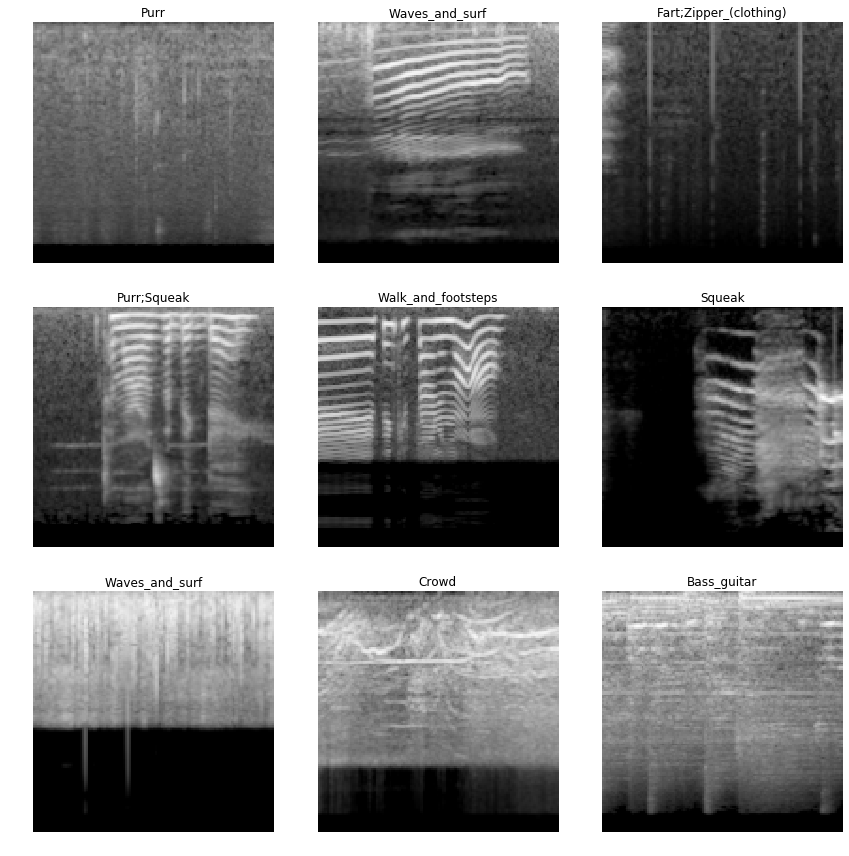

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


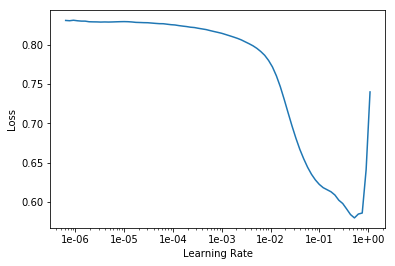

epoch,train_loss,valid_loss,lwlrap,time
0,0.148128,0.078748,0.103011,00:44
1,0.082926,0.073374,0.168196,00:43
2,0.076452,0.069277,0.224743,00:43
3,0.076551,0.071729,0.202598,00:44
4,0.075411,0.068220,0.249814,00:43
5,0.074666,0.066020,0.278212,00:44
6,0.073718,0.063887,0.324000,00:43
7,0.072488,0.061060,0.370094,00:43
8,0.071268,0.059312,0.398680,00:44
9,0.070517,0.058612,0.406515,00:43


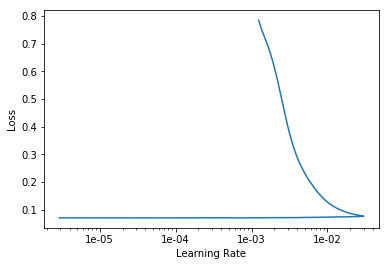

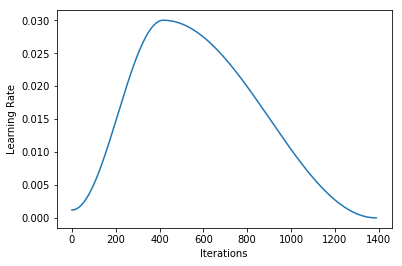

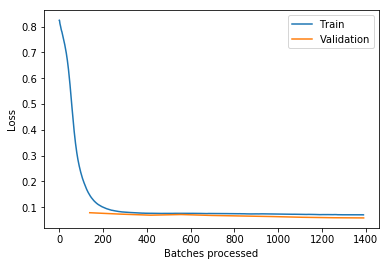

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


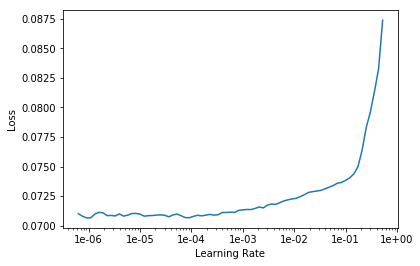

epoch,train_loss,valid_loss,lwlrap,time
0,0.071049,0.059216,0.399500,00:43
1,0.070501,0.059688,0.391669,00:44
2,0.070510,0.061886,0.351979,00:43
3,0.070389,0.059920,0.389449,00:43
4,0.070347,0.061287,0.348993,00:42
5,0.070464,0.059059,0.385445,00:42
6,0.070086,0.062235,0.338238,00:42
7,0.069978,0.059972,0.375585,00:42
8,0.070262,0.060109,0.368324,00:42
9,0.070247,0.062080,0.344630,00:42


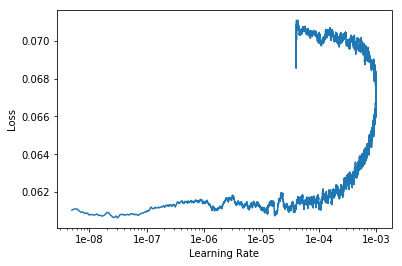

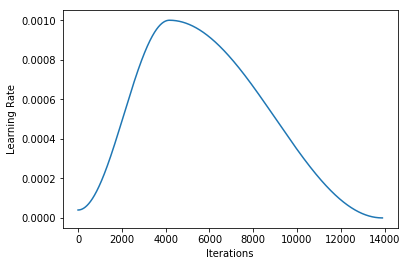

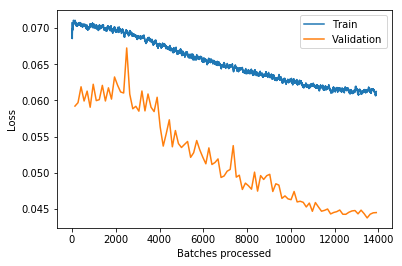

---------------------------------------- NOISY - Fold 2/10 ----------------------------------------


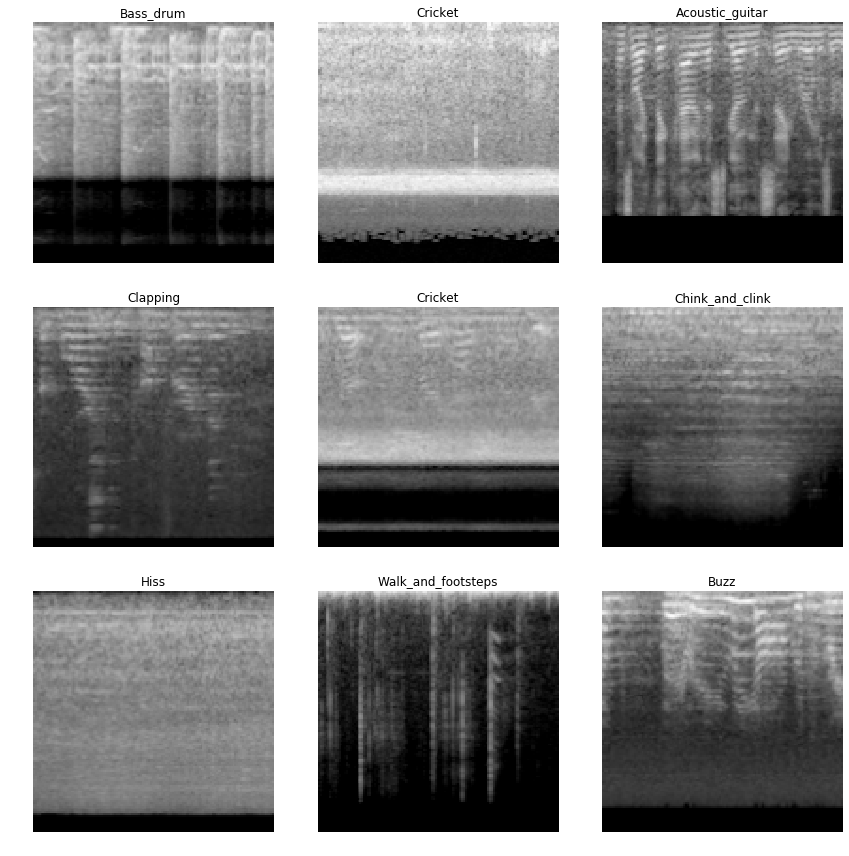

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


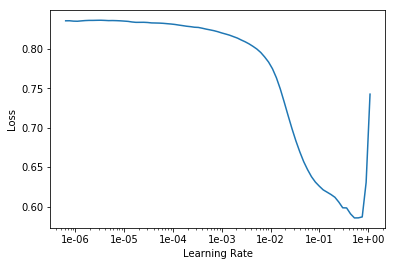

epoch,train_loss,valid_loss,lwlrap,time
0,0.147783,0.077391,0.120547,00:42
1,0.083220,0.072447,0.182533,00:42
2,0.076688,0.069553,0.223122,00:42
3,0.076203,0.068898,0.232062,00:42
4,0.075539,0.067470,0.250977,00:42
5,0.075102,0.067181,0.258895,00:42
6,0.073968,0.063321,0.331042,00:42
7,0.072506,0.061822,0.351818,00:42
8,0.071307,0.059215,0.386638,00:42
9,0.070682,0.058917,0.394058,00:42


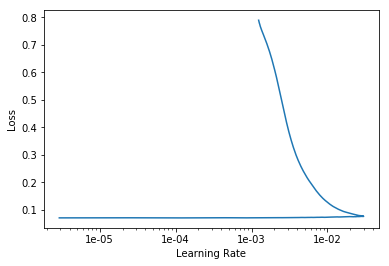

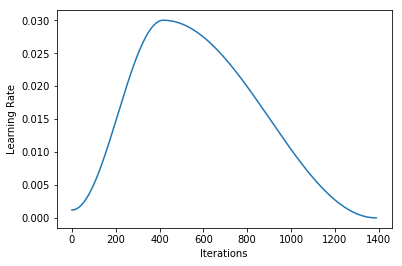

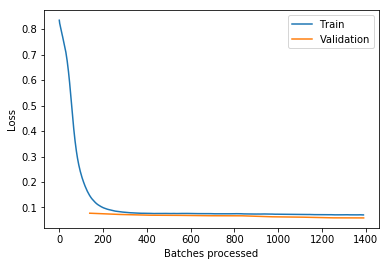

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


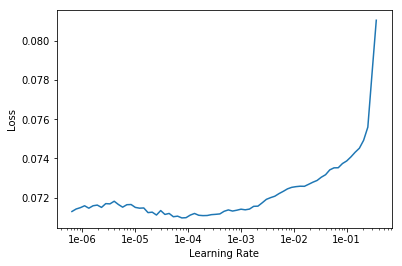

epoch,train_loss,valid_loss,lwlrap,time
0,0.070876,0.059459,0.371469,00:42
1,0.070602,0.060441,0.365991,00:42
2,0.070115,0.060780,0.367069,00:42
3,0.070367,0.060097,0.365776,00:42
4,0.070678,0.059978,0.381350,00:42
5,0.070461,0.060876,0.347206,00:42
6,0.070546,0.065797,0.274200,00:42
7,0.070414,0.063691,0.312276,00:42
8,0.070196,0.059533,0.383456,00:42
9,0.070245,0.061034,0.357311,00:42


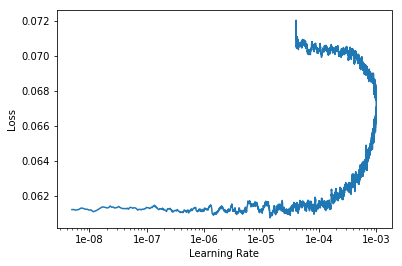

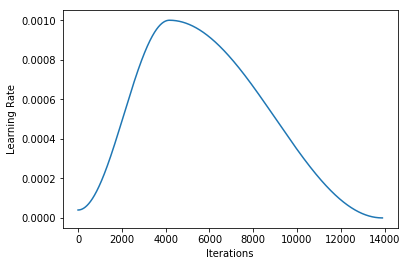

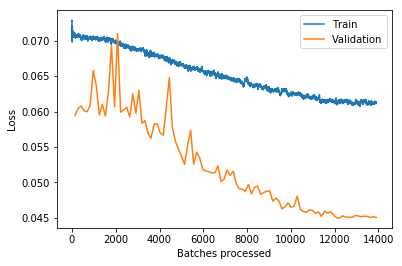

---------------------------------------- NOISY - Fold 3/10 ----------------------------------------


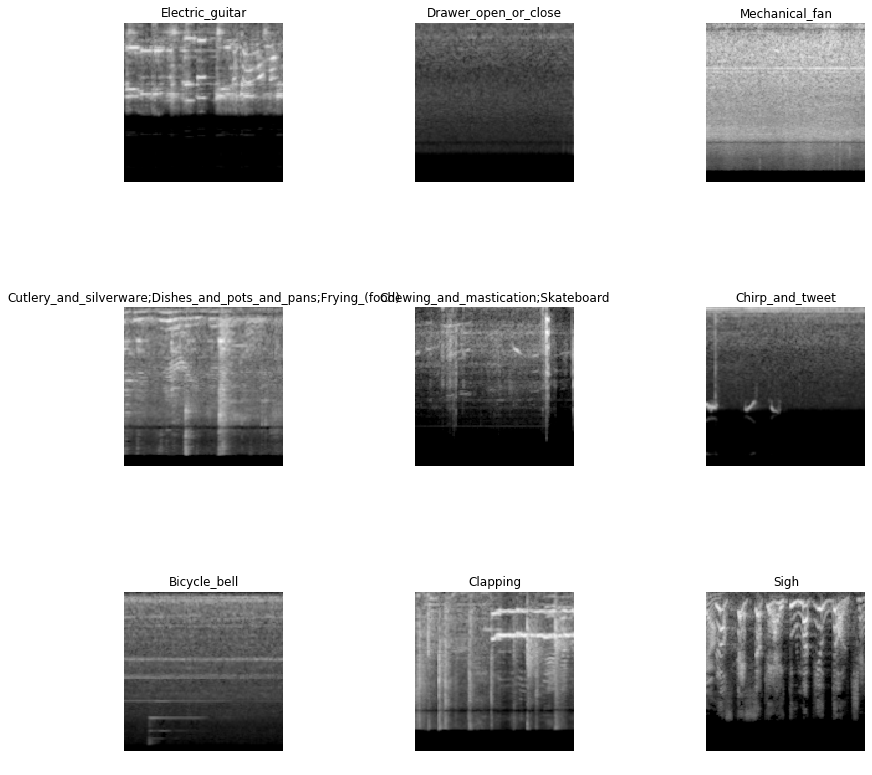

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


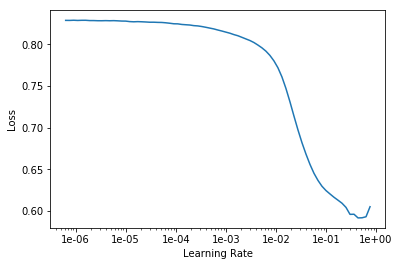

epoch,train_loss,valid_loss,lwlrap,time
0,0.149126,0.078414,0.102357,00:42
1,0.083061,0.071654,0.193986,00:42
2,0.076529,0.071440,0.199304,00:42
3,0.076248,0.070073,0.225322,00:42
4,0.075748,0.068472,0.239523,00:42
5,0.074753,0.066171,0.273265,00:42
6,0.073916,0.064352,0.306267,00:42
7,0.072247,0.060977,0.362813,00:42
8,0.071416,0.059287,0.389484,00:42
9,0.070897,0.058743,0.404796,00:42


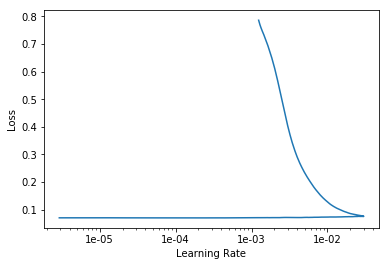

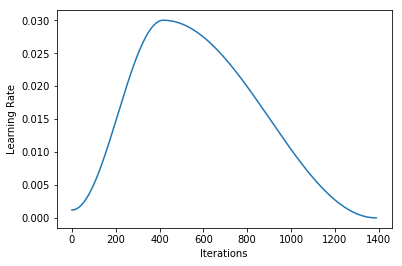

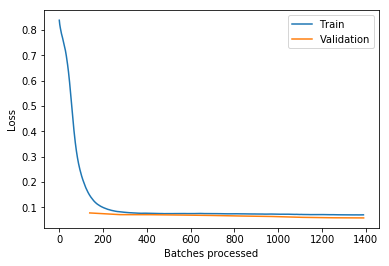

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


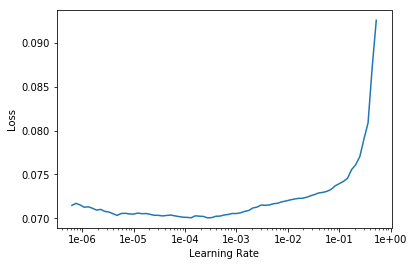

epoch,train_loss,valid_loss,lwlrap,time
0,0.070874,0.060580,0.361667,00:42
1,0.070524,0.059929,0.394165,00:42
2,0.070253,0.061115,0.357654,00:42
3,0.070255,0.060474,0.376407,00:42
4,0.070528,0.059887,0.386724,00:42
5,0.070405,0.061763,0.347908,00:42
6,0.070201,0.061181,0.368456,00:42
7,0.069995,0.061578,0.364539,00:42
8,0.070189,0.061270,0.361442,00:42
9,0.069902,0.059451,0.386670,00:42


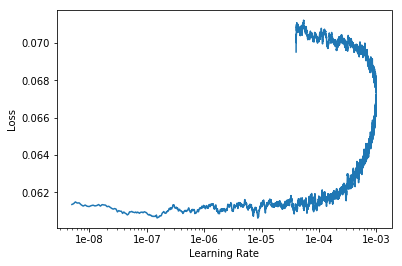

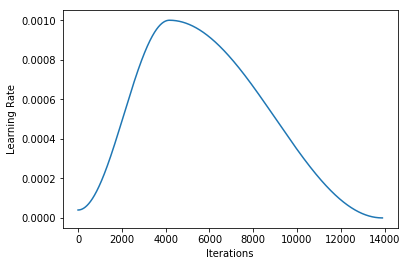

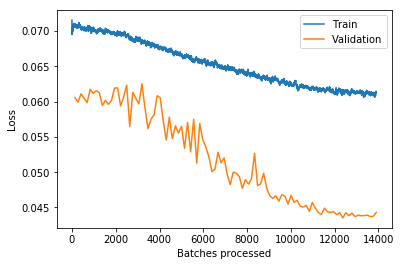

---------------------------------------- NOISY - Fold 4/10 ----------------------------------------


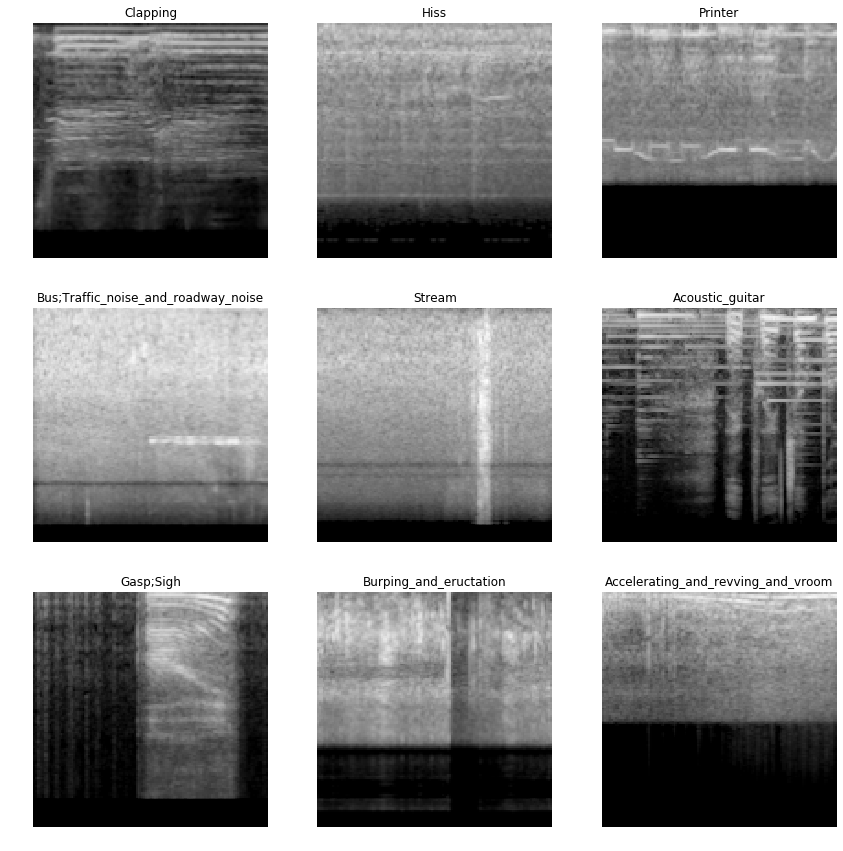

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


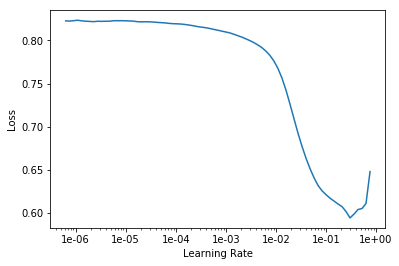

epoch,train_loss,valid_loss,lwlrap,time
0,0.148341,0.078540,0.115747,00:42
1,0.083288,0.071285,0.188557,00:43
2,0.076572,0.072606,0.183949,00:43
3,0.076205,0.070806,0.213178,00:42
4,0.076142,0.069677,0.235775,00:42
5,0.075179,0.067014,0.277744,00:42
6,0.073708,0.063847,0.310712,00:42
7,0.072211,0.061541,0.351736,00:42
8,0.071339,0.059417,0.387625,00:42
9,0.070667,0.058912,0.394203,00:42


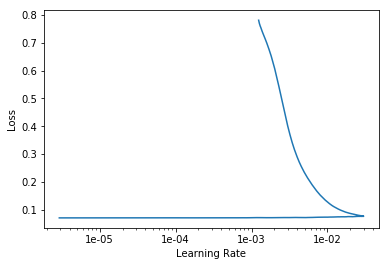

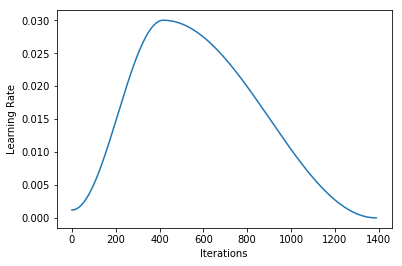

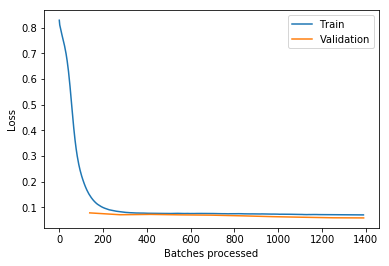

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


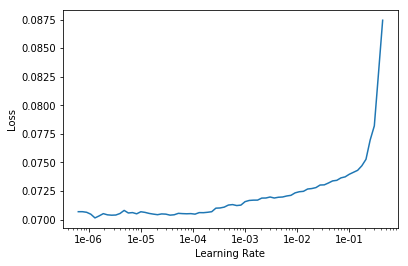

epoch,train_loss,valid_loss,lwlrap,time
0,0.070763,0.060266,0.368253,00:43
1,0.070736,0.060851,0.361829,00:43
2,0.070500,0.059133,0.392227,00:42
3,0.070280,0.061804,0.349631,00:43
4,0.070279,0.063231,0.327380,00:42
5,0.070491,0.062241,0.349068,00:43
6,0.070043,0.066343,0.279507,00:43
7,0.070478,0.064367,0.302730,00:42
8,0.070498,0.063411,0.333621,00:43
9,0.070155,0.062727,0.335953,00:43


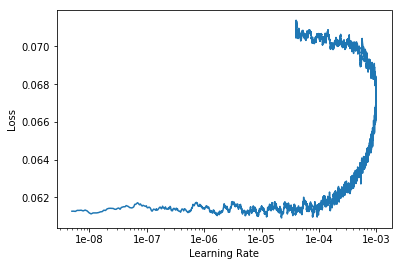

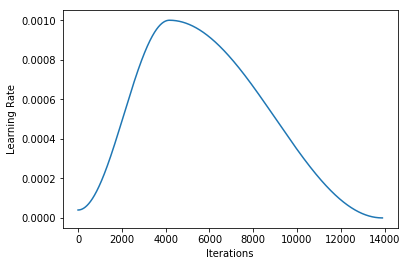

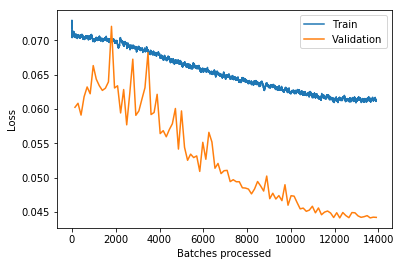

---------------------------------------- NOISY - Fold 5/10 ----------------------------------------


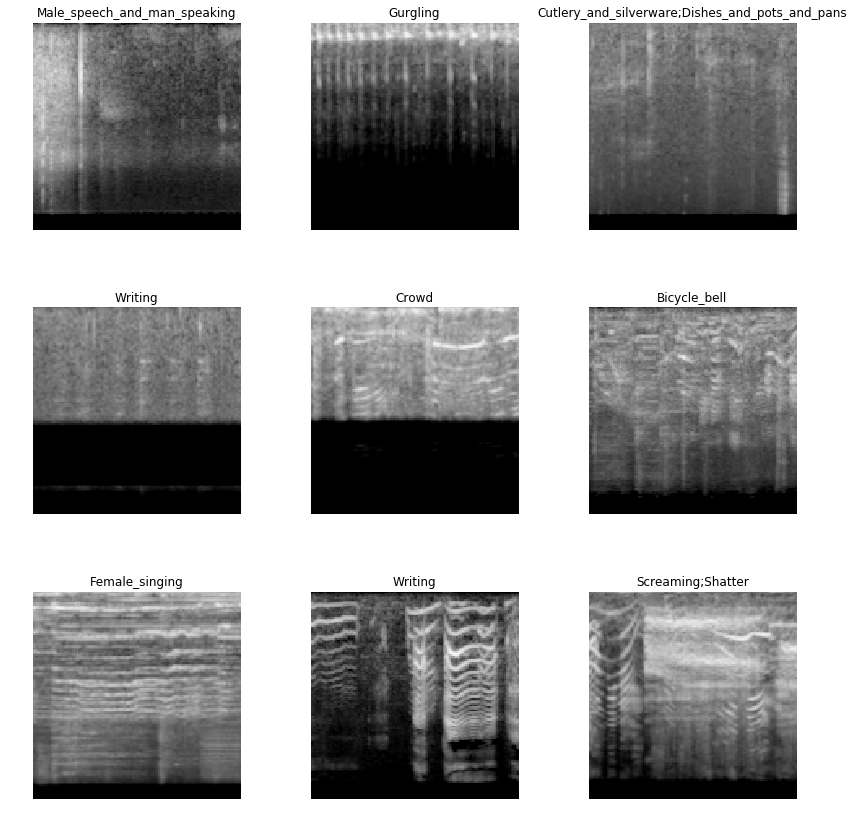

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


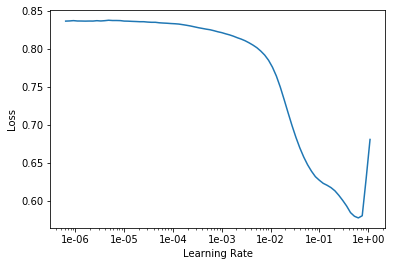

epoch,train_loss,valid_loss,lwlrap,time
0,0.148026,0.078105,0.118938,00:42
1,0.083103,0.072263,0.182812,00:42
2,0.076407,0.068909,0.242997,00:42
3,0.075931,0.070927,0.220612,00:42
4,0.075409,0.068812,0.248228,00:42
5,0.074782,0.071751,0.220190,00:42
6,0.073717,0.064361,0.325921,00:42
7,0.072332,0.061749,0.357944,00:42
8,0.071234,0.059880,0.380404,00:42
9,0.070672,0.058732,0.400363,00:42


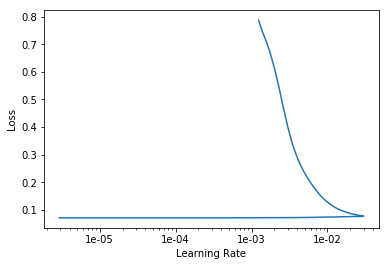

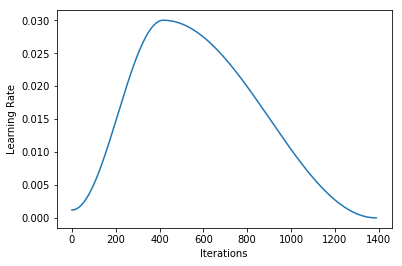

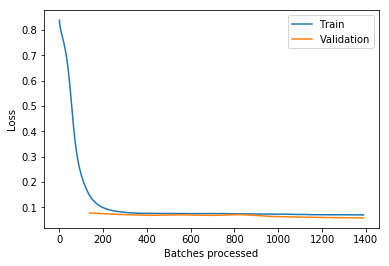

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


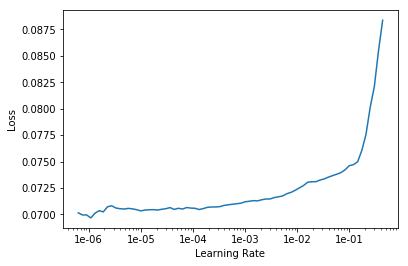

epoch,train_loss,valid_loss,lwlrap,time
0,0.070420,0.060524,0.379553,00:42
1,0.070512,0.060977,0.368481,00:42
2,0.070678,0.059810,0.385213,00:42
3,0.070385,0.061213,0.379882,00:42
4,0.070276,0.061729,0.352152,00:42
5,0.070323,0.061591,0.353113,00:42
6,0.069990,0.062389,0.350947,00:42
7,0.070376,0.062374,0.345067,00:42
8,0.069774,0.063190,0.338780,00:42
9,0.070195,0.059899,0.394256,00:42


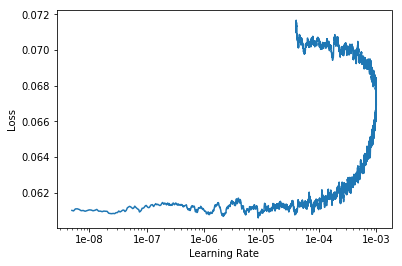

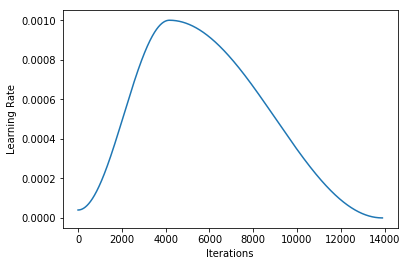

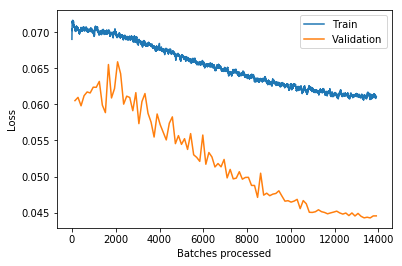

---------------------------------------- NOISY - Fold 6/10 ----------------------------------------


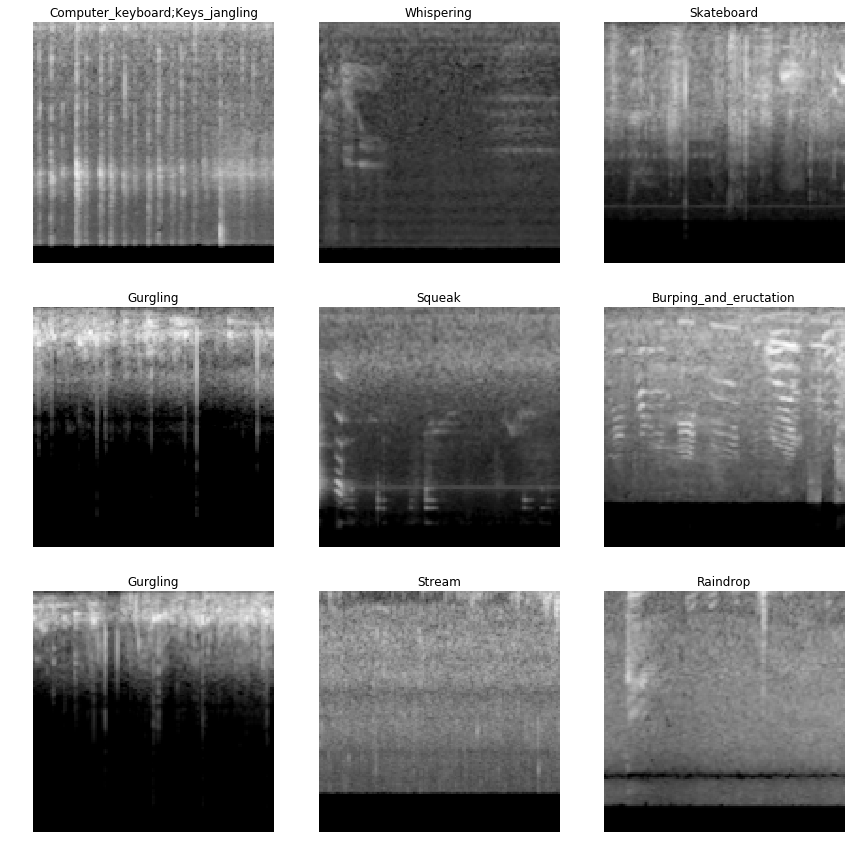

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


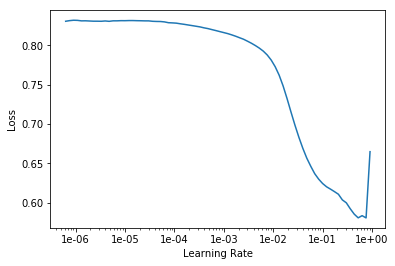

epoch,train_loss,valid_loss,lwlrap,time
0,0.149136,0.078318,0.106236,00:43
1,0.083100,0.072342,0.184487,00:42
2,0.076589,0.070576,0.226010,00:42
3,0.075842,0.069413,0.229210,00:42
4,0.076280,0.070643,0.226593,00:42
5,0.074930,0.084681,0.253418,00:42
6,0.073713,0.074577,0.297143,00:42
7,0.072741,0.062447,0.341560,00:42
8,0.071934,0.061142,0.362052,00:42
9,0.070965,0.061506,0.376394,00:42


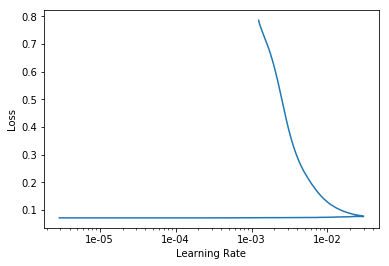

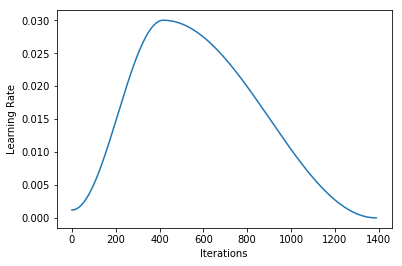

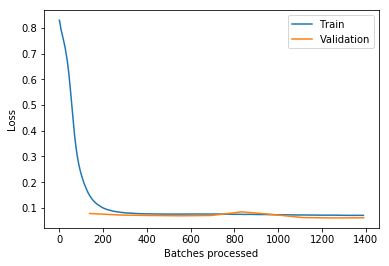

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


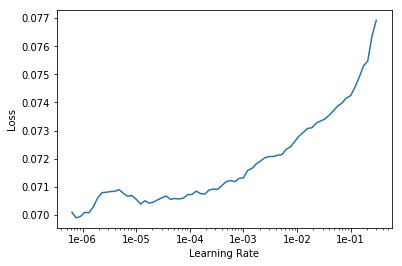

epoch,train_loss,valid_loss,lwlrap,time
0,0.071115,0.061795,0.368953,00:42
1,0.070919,0.060841,0.376133,00:42
2,0.070792,0.060823,0.368350,00:42
3,0.070763,0.062461,0.342814,00:42
4,0.070804,0.064744,0.327239,00:42
5,0.070713,0.061510,0.372073,00:42
6,0.070384,0.065794,0.279799,00:42
7,0.070661,0.062423,0.350800,00:42
8,0.070691,0.061755,0.355391,00:42
9,0.070177,0.062529,0.347566,00:42


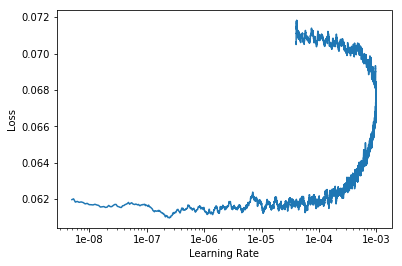

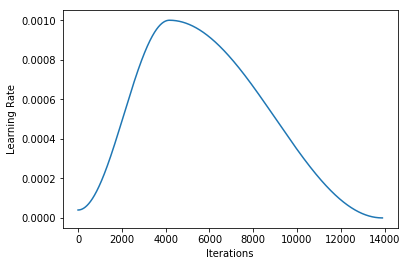

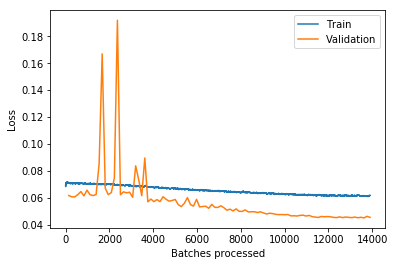

---------------------------------------- NOISY - Fold 7/10 ----------------------------------------


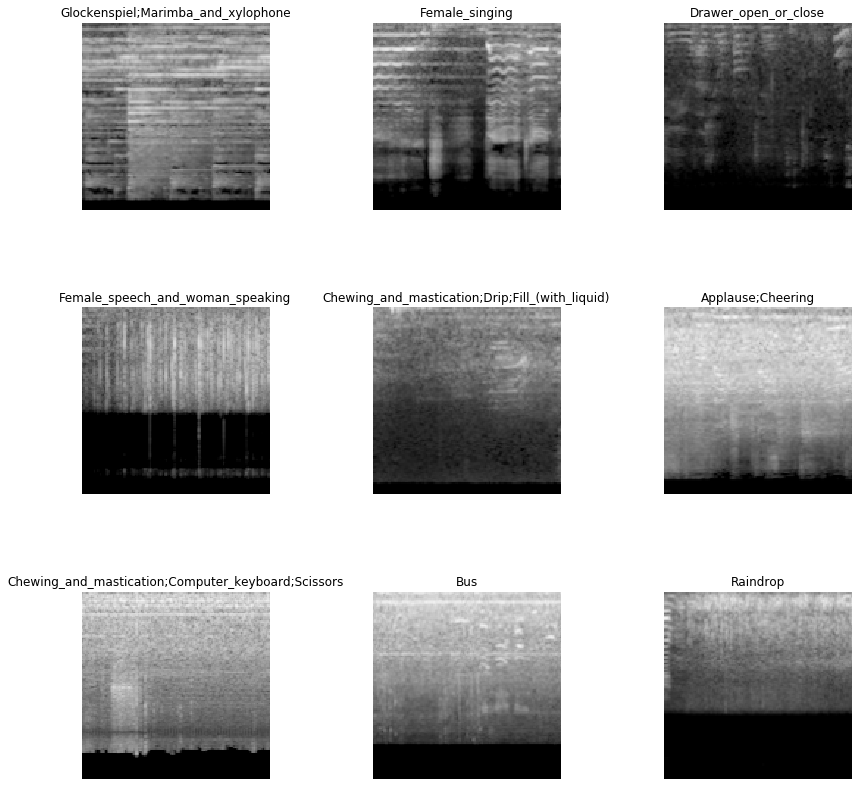

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


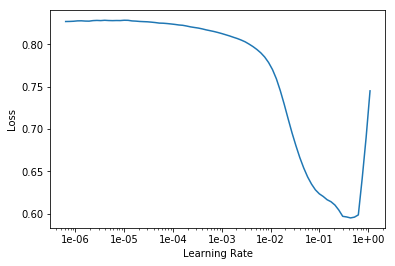

epoch,train_loss,valid_loss,lwlrap,time
0,0.147762,0.077152,0.101257,00:42
1,0.082898,0.071878,0.191941,00:42
2,0.076975,0.069592,0.209513,00:42
3,0.076313,0.071201,0.212902,00:42
4,0.076074,0.069200,0.221094,00:42
5,0.075088,0.066151,0.280039,00:42
6,0.073683,0.065071,0.279434,00:42
7,0.072745,0.061866,0.327641,00:42
8,0.071500,0.058750,0.386891,00:42
9,0.070864,0.058322,0.389676,00:42


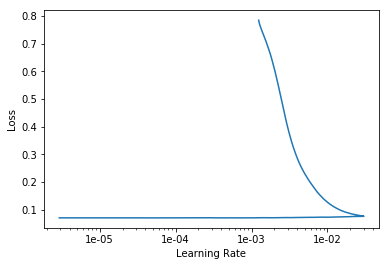

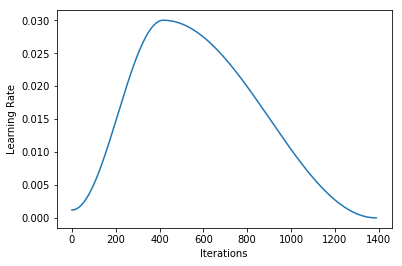

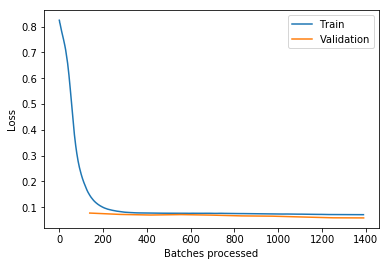

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


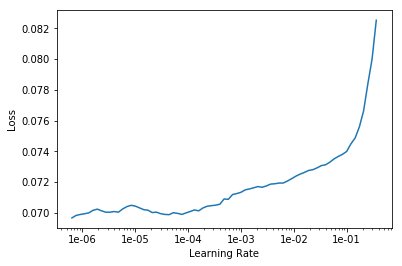

epoch,train_loss,valid_loss,lwlrap,time
0,0.071026,0.059082,0.374250,00:42
1,0.070714,0.059111,0.380408,00:42
2,0.070251,0.061041,0.355085,00:42
3,0.070405,0.060642,0.355452,00:42
4,0.070490,0.058827,0.379182,00:42
5,0.070066,0.061958,0.325832,00:42
6,0.070673,0.062121,0.322212,00:42
7,0.070365,0.059686,0.367130,00:42
8,0.070390,0.067250,0.255946,00:42
9,0.069985,0.063501,0.297125,00:42


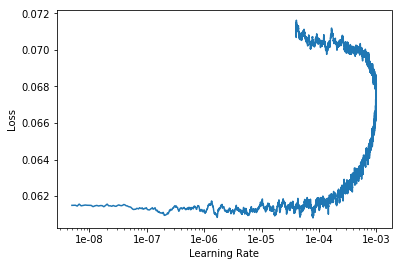

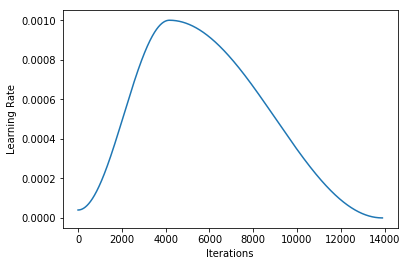

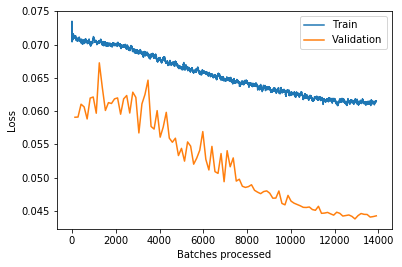

---------------------------------------- NOISY - Fold 8/10 ----------------------------------------


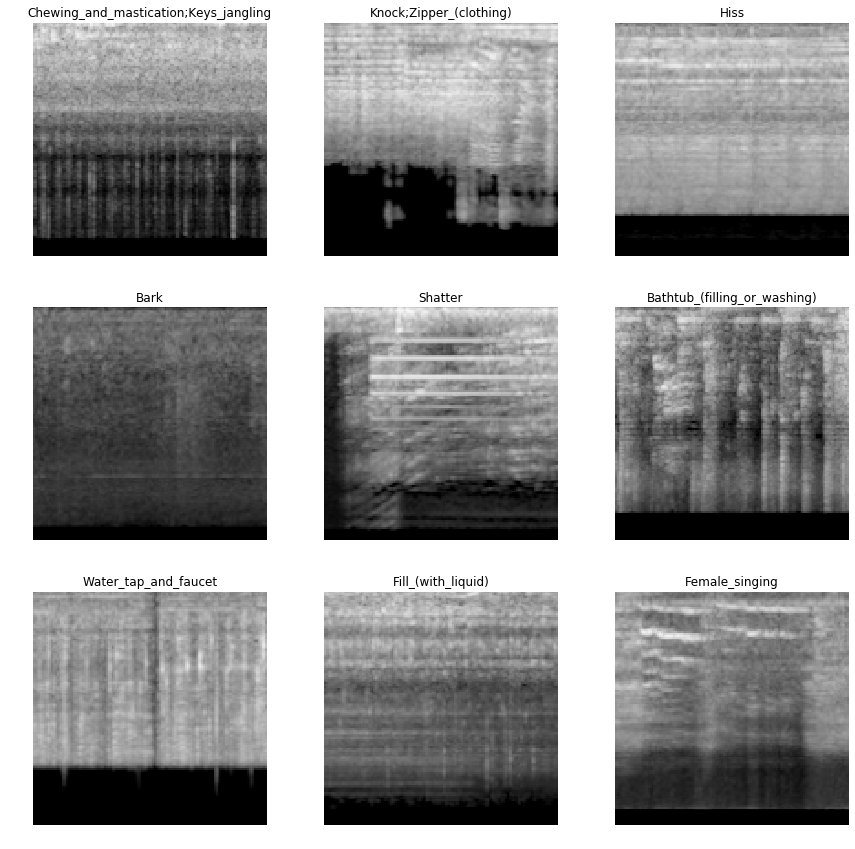

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


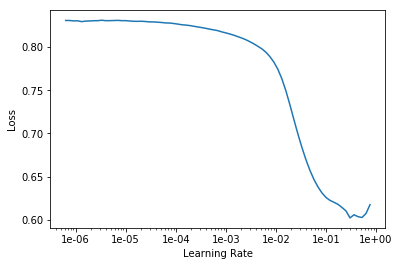

epoch,train_loss,valid_loss,lwlrap,time
0,0.149713,0.078450,0.102263,00:42
1,0.083741,0.071578,0.185226,00:42
2,0.076732,0.069044,0.238676,00:42
3,0.076140,0.067308,0.247796,00:42
4,0.076039,0.068050,0.246344,00:42
5,0.074907,0.067717,0.255963,00:42
6,0.073642,0.064282,0.294044,00:42
7,0.072327,0.060536,0.350004,00:42
8,0.071365,0.058925,0.385252,00:42
9,0.070759,0.058237,0.390941,00:42


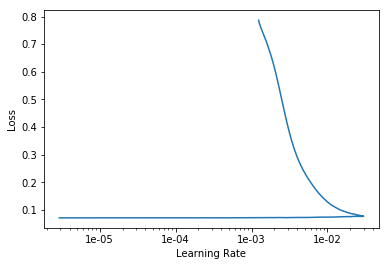

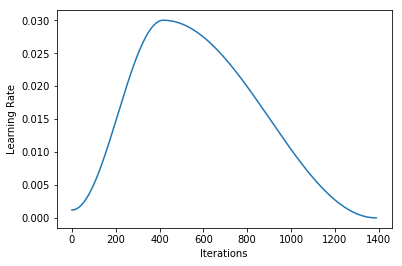

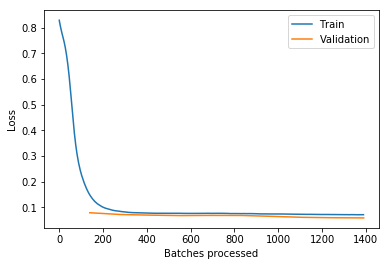

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


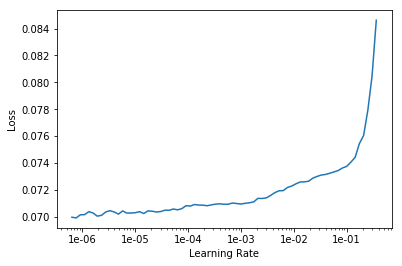

epoch,train_loss,valid_loss,lwlrap,time
0,0.070909,0.059308,0.388595,00:42
1,0.070795,0.061570,0.333819,00:42
2,0.070345,0.059779,0.372170,00:42
3,0.070270,0.059864,0.374899,00:42
4,0.070556,0.058832,0.386087,00:42
5,0.070545,0.061082,0.342538,00:42
6,0.070283,0.064326,0.292842,00:42
7,0.070411,0.060093,0.368689,00:42
8,0.070398,0.060603,0.348672,00:42
9,0.070262,0.061529,0.350124,00:42


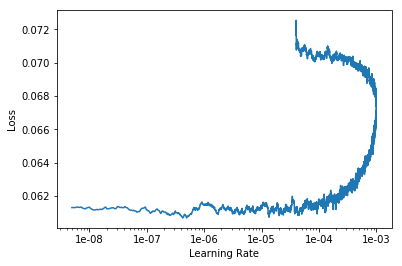

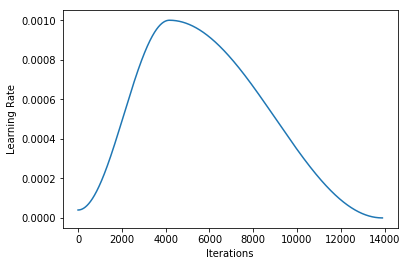

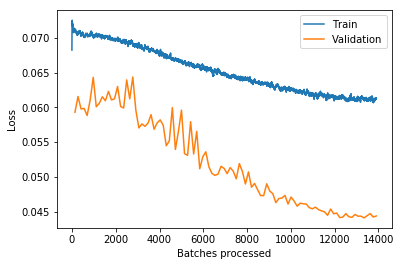

---------------------------------------- NOISY - Fold 9/10 ----------------------------------------


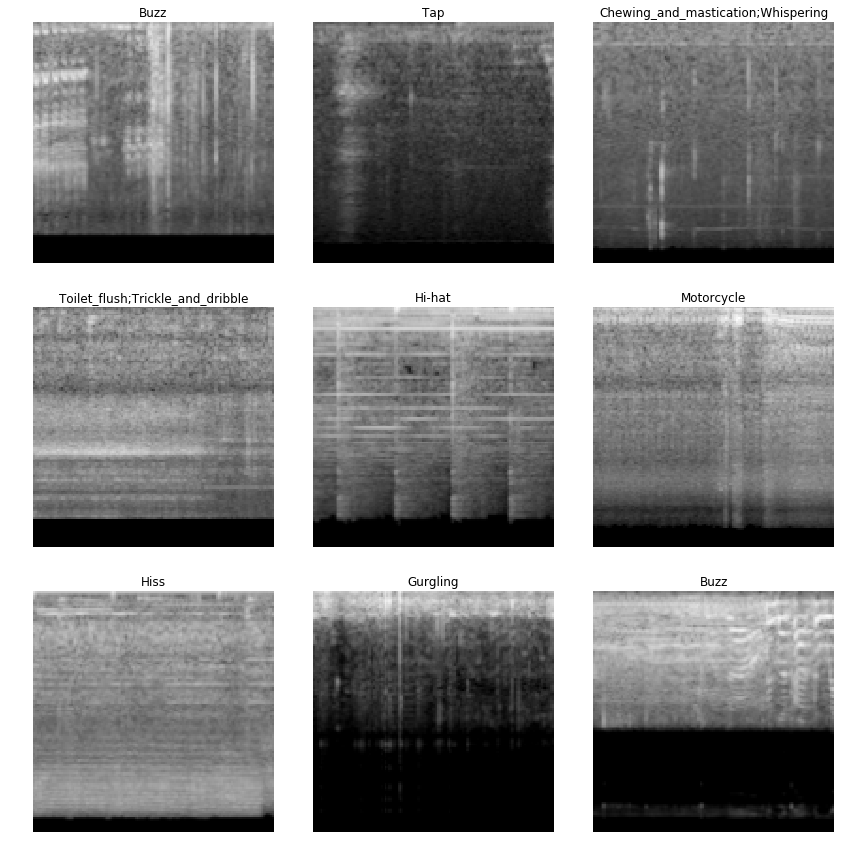

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


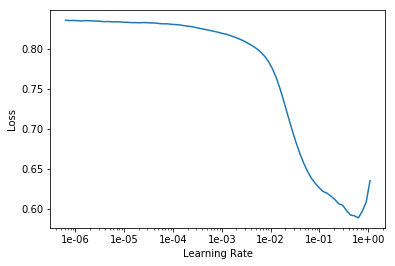

epoch,train_loss,valid_loss,lwlrap,time
0,0.148915,0.077666,0.115871,00:42
1,0.083465,0.071556,0.200527,00:42
2,0.076954,0.070341,0.219116,00:42
3,0.075958,0.067246,0.253718,00:42
4,0.075942,0.069302,0.223203,00:42
5,0.075046,0.066221,0.283408,00:42
6,0.073442,0.063858,0.307669,00:42
7,0.072704,0.061612,0.353923,00:42
8,0.071422,0.059084,0.395182,00:42
9,0.070750,0.058777,0.400403,00:42


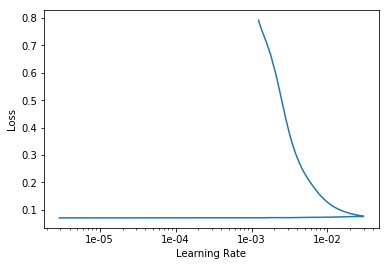

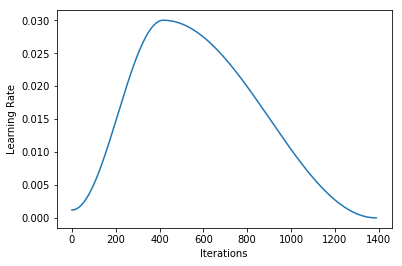

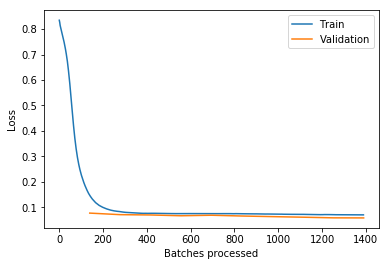

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


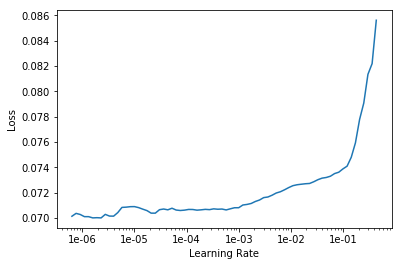

epoch,train_loss,valid_loss,lwlrap,time
0,0.071101,0.060758,0.360969,00:42
1,0.070670,0.059966,0.374037,00:42
2,0.070713,0.062598,0.325224,00:42
3,0.070364,0.059961,0.379399,00:42
4,0.070549,0.060420,0.369451,00:42
5,0.070231,0.062609,0.327592,00:42
6,0.070454,0.061328,0.345611,00:42
7,0.070455,0.061563,0.351197,00:42
8,0.070188,0.066132,0.269604,00:42
9,0.070280,0.059276,0.393061,00:42


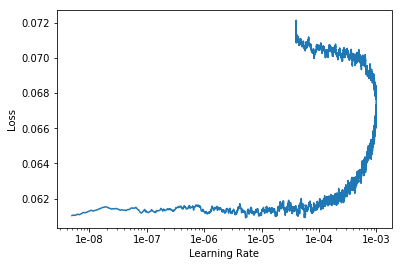

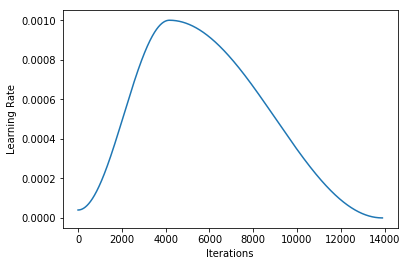

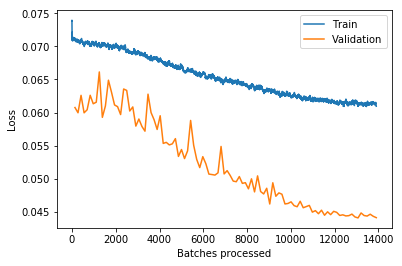

---------------------------------------- NOISY - Fold 10/10 ----------------------------------------


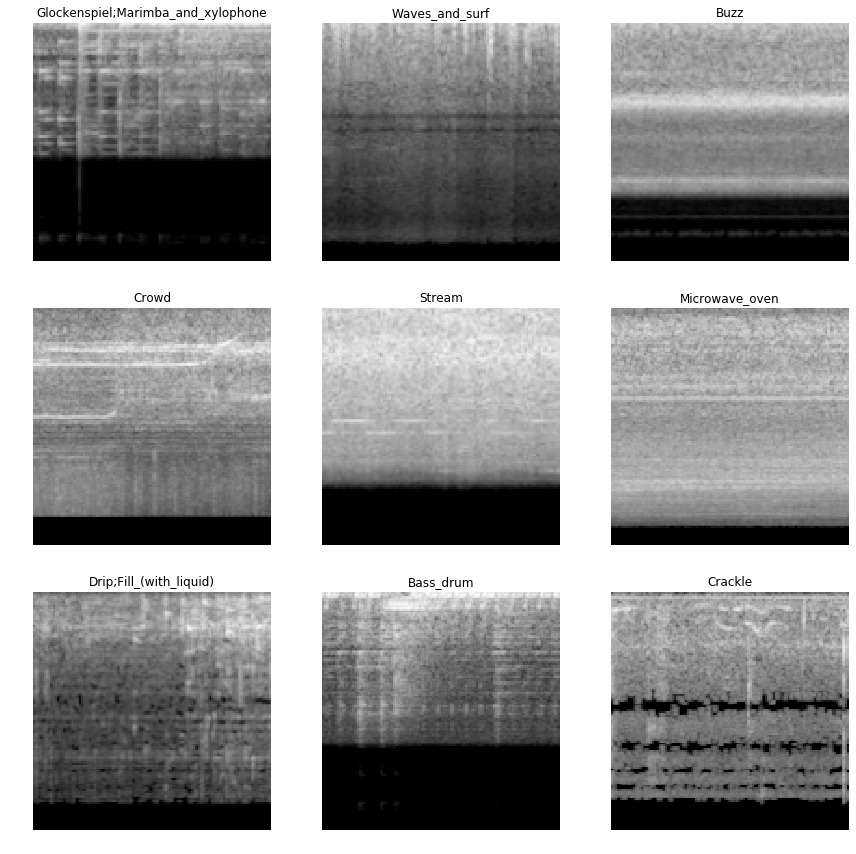

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


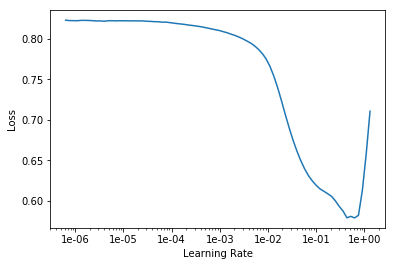

epoch,train_loss,valid_loss,lwlrap,time
0,0.147818,0.077280,0.107933,00:42
1,0.082930,0.073854,0.157279,00:42
2,0.076382,0.069312,0.231389,00:42
3,0.076128,0.070990,0.198264,00:42
4,0.075669,0.068838,0.249929,00:42
5,0.074982,0.071090,0.223742,00:42
6,0.073817,0.064750,0.290848,00:42
7,0.072931,0.062116,0.333173,00:42
8,0.071850,0.059757,0.378994,00:42
9,0.070840,0.059230,0.391235,00:42


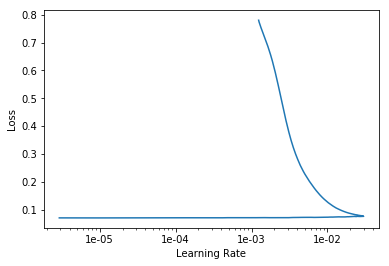

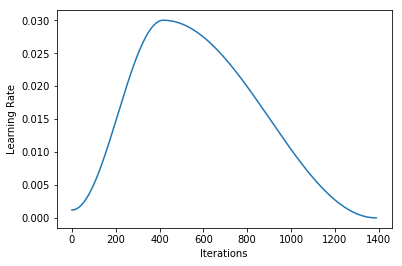

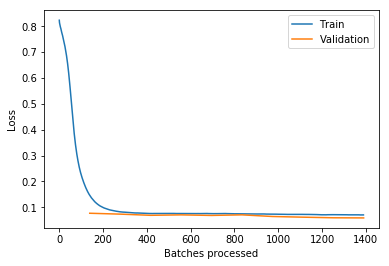

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


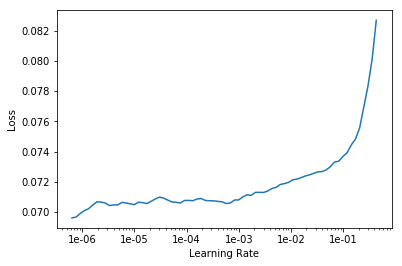

epoch,train_loss,valid_loss,lwlrap,time
0,0.071177,0.060797,0.351584,00:42
1,0.070534,0.059349,0.385828,00:42
2,0.070957,0.060103,0.365446,00:42
3,0.070504,0.060401,0.371242,00:42
4,0.070566,0.061566,0.341732,00:42
5,0.070594,0.062452,0.332109,00:42
6,0.070449,0.062635,0.324150,00:42
7,0.070506,0.061831,0.341816,00:42
8,0.070649,0.062379,0.331261,00:42
9,0.070136,0.062838,0.327107,00:42


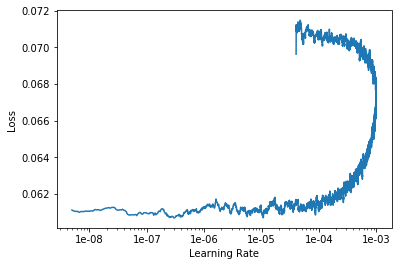

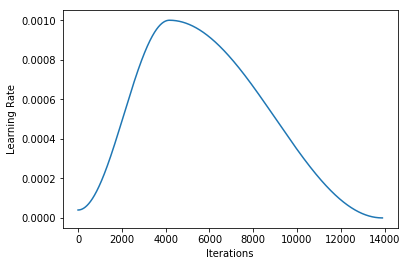

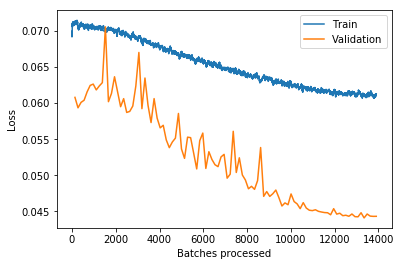

In [22]:
for fold, (train_index, valid_index) in enumerate(kf_noisy.split(trn_noisy_df)):
    print('-' * 40, f'NOISY - Fold {fold+1}/{n_splits}', '-' * 40)
    
    src = (ImageList.from_df(trn_noisy_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
#     learn = cnn_learner(data, borrowed_model, pretrained=False, metrics=[Lwlrap()])
    learn = cnn_learner(data, models.vgg16_bn, pretrained=False, metrics=[Lwlrap()])
    learn.callback_fns.append(MyMixUpCallback)
    learn.unfreeze()
    
    assert learn.data.classes == labels
#     break
    learning(learn, 10, slice(1e-5, 3e-2))
    learning(learn, 100, 1e-3)
    
    learn.save(f'stage-1_fold-{fold}')

    if TOY_MODE:
        break

In [23]:
learn.model

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace)
      (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Fal

In [24]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-1_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.41793918072817265


,lwlrap,weight
Raindrop,0.034137,0.013039
Tap,0.037902,0.013039
Yell,0.045295,0.013039
Female_speech_and_woman_speaking,0.049855,0.013039
Cupboard_open_or_close,0.093520,0.013039
Male_speech_and_man_speaking,0.099777,0.013039
Run,0.106769,0.013039
Whispering,0.121909,0.013039
Bass_drum,0.131903,0.013039
Fill_(with_liquid),0.170228,0.008693


In [25]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-1_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.6596067715667252


,lwlrap,weight
Zipper_(clothing),0.253919,0.0125
Burping_and_eructation,0.267249,0.0125
Fart,0.303172,0.0125
Writing,0.361099,0.0125
Buzz,0.396116,0.0125
Gasp,0.398673,0.0125
Sneeze,0.408500,0.0125
Whispering,0.447978,0.0125
Computer_keyboard,0.453490,0.0125
Finger_snapping,0.455088,0.0125


### Train on curated data

---------------------------------------- CURATED - Fold 1/10 ----------------------------------------


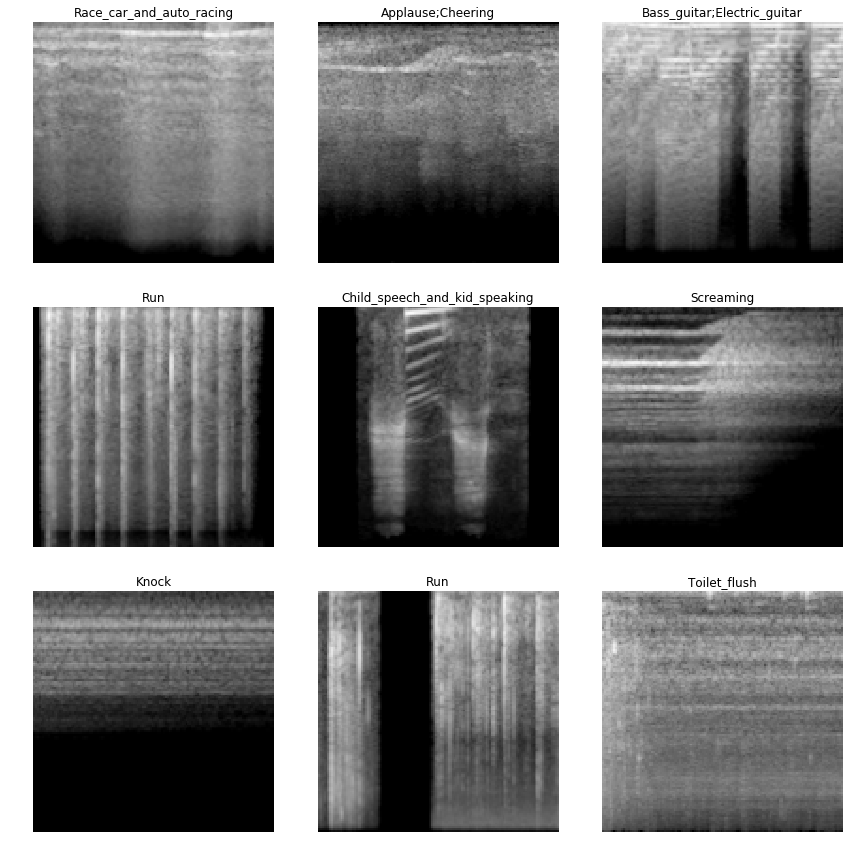

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


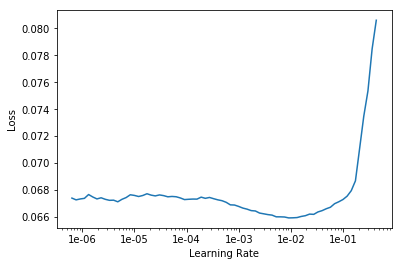

epoch,train_loss,valid_loss,lwlrap,time
0,0.067560,0.053204,0.447290,00:14
1,0.066541,0.051695,0.460949,00:13
2,0.065804,0.049896,0.493618,00:12
3,0.064905,0.048046,0.513841,00:12
4,0.064113,0.046691,0.536240,00:12
5,0.063435,0.045611,0.553793,00:12
6,0.062606,0.043731,0.579125,00:12
7,0.061863,0.042592,0.599247,00:12
8,0.061307,0.041082,0.630123,00:12
9,0.060750,0.040351,0.628844,00:12


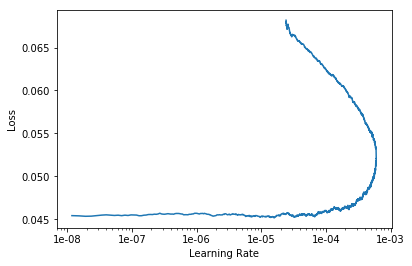

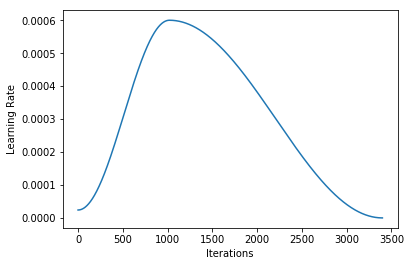

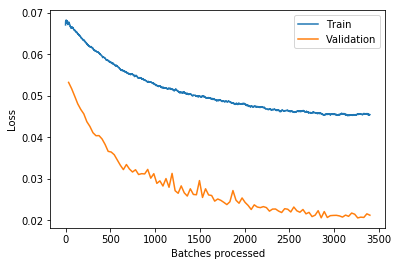

---------------------------------------- CURATED - Fold 2/10 ----------------------------------------


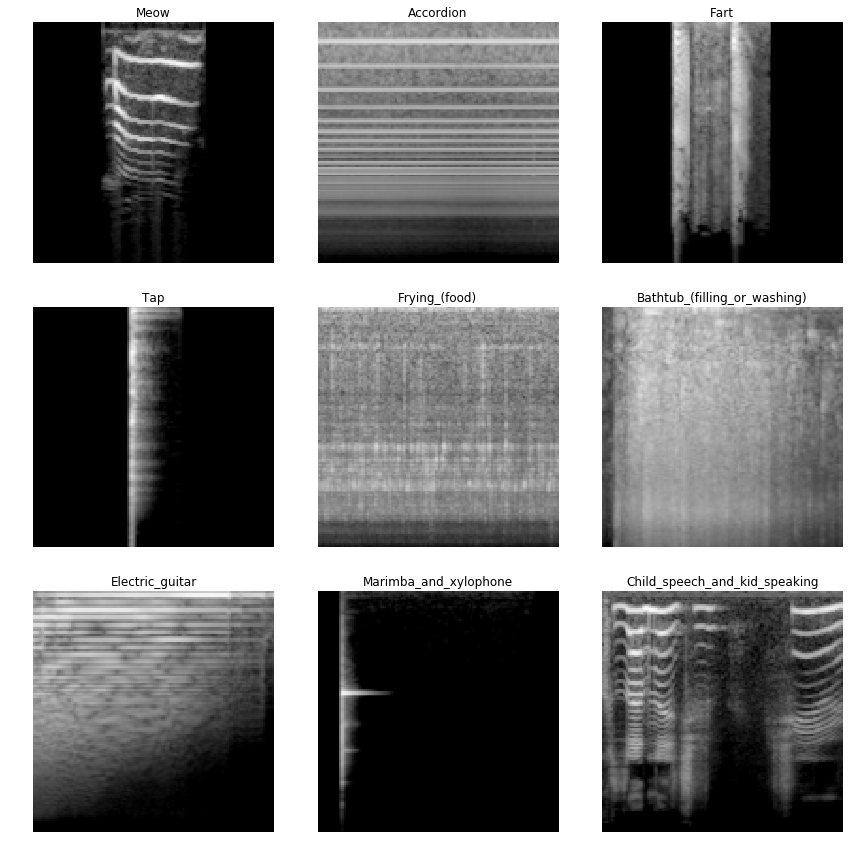

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


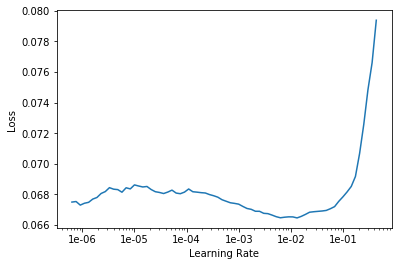

epoch,train_loss,valid_loss,lwlrap,time
0,0.068257,0.055024,0.427220,00:12
1,0.067036,0.052123,0.461244,00:12
2,0.065987,0.049973,0.493262,00:12
3,0.065098,0.047989,0.523737,00:12
4,0.064399,0.046871,0.543114,00:12
5,0.063415,0.045396,0.576932,00:13
6,0.062692,0.043728,0.596825,00:13
7,0.061947,0.043355,0.592185,00:12
8,0.061102,0.042175,0.628479,00:12
9,0.060399,0.041039,0.640604,00:12


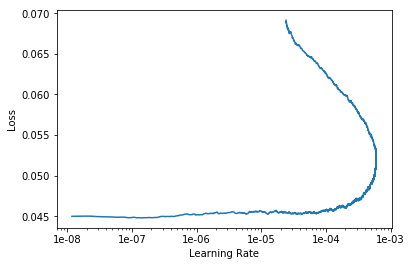

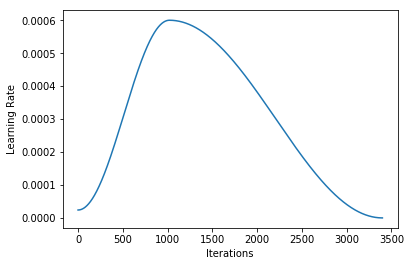

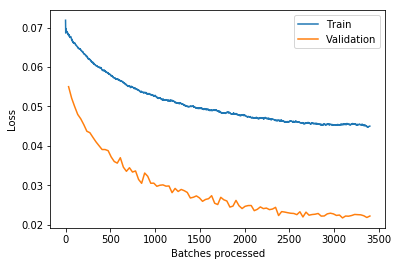

---------------------------------------- CURATED - Fold 3/10 ----------------------------------------


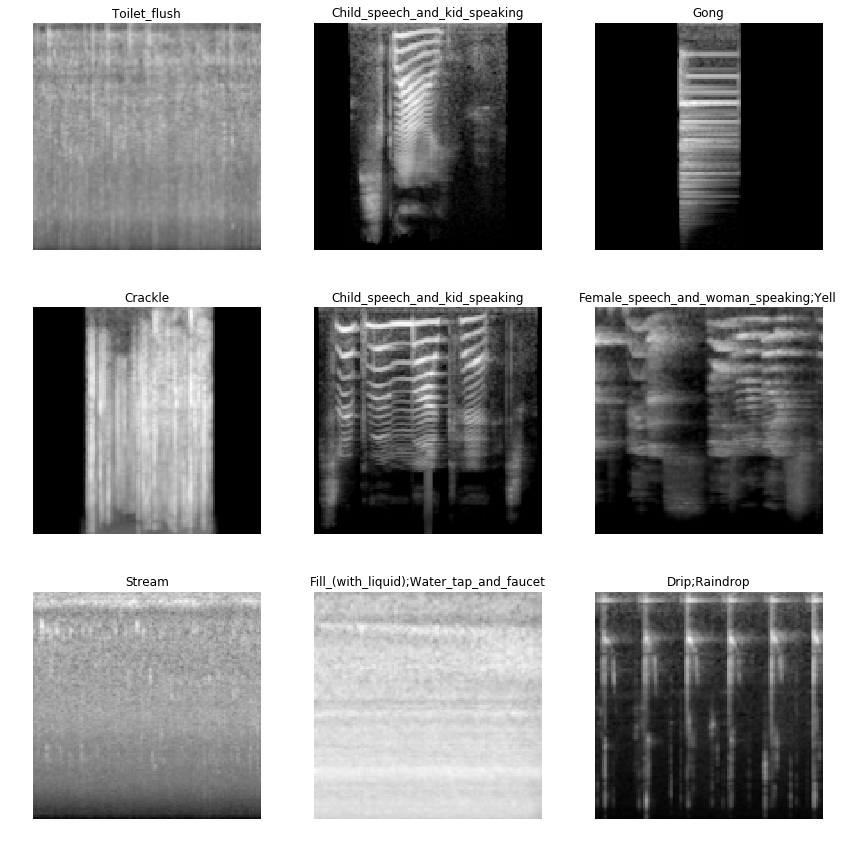

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


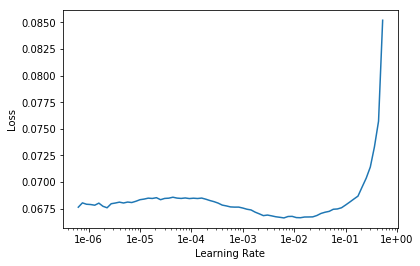

epoch,train_loss,valid_loss,lwlrap,time
0,0.067696,0.052757,0.446849,00:12
1,0.066911,0.050572,0.469442,00:12
2,0.065835,0.048194,0.509667,00:12
3,0.065186,0.046691,0.529259,00:12
4,0.064128,0.045609,0.555236,00:12
5,0.063347,0.044103,0.564535,00:12
6,0.062794,0.043421,0.570729,00:12
7,0.062088,0.042098,0.607889,00:12
8,0.061501,0.041699,0.603424,00:13
9,0.060792,0.040660,0.621594,00:12


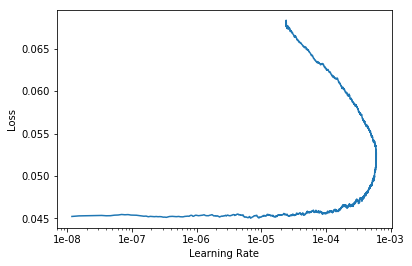

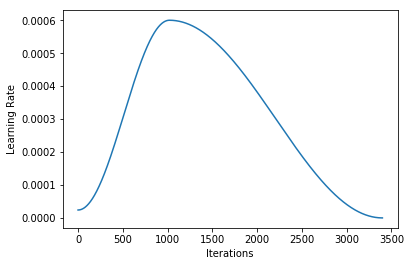

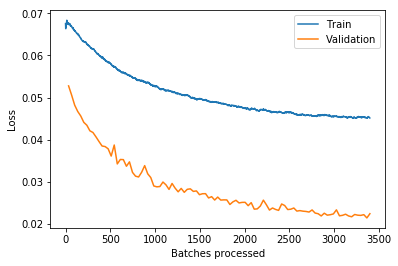

---------------------------------------- CURATED - Fold 4/10 ----------------------------------------


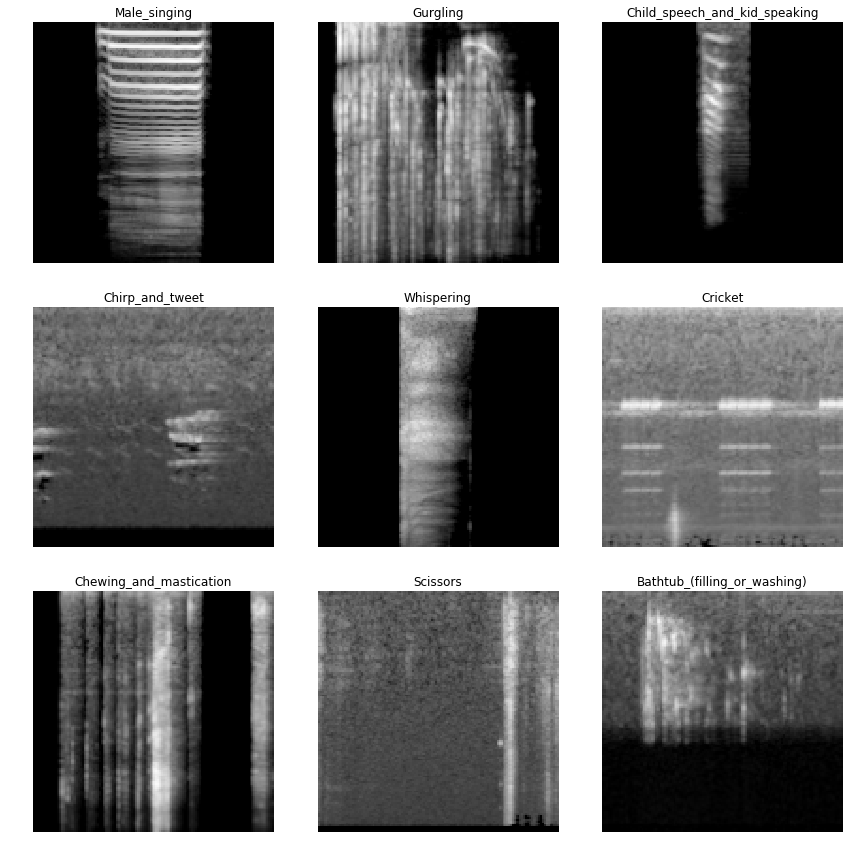

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


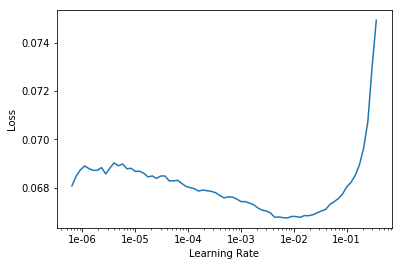

epoch,train_loss,valid_loss,lwlrap,time
0,0.068007,0.053342,0.451241,00:12
1,0.066780,0.050868,0.493089,00:12
2,0.066012,0.048397,0.516816,00:12
3,0.065103,0.046911,0.536954,00:12
4,0.064287,0.046005,0.556202,00:12
5,0.063576,0.045448,0.557447,00:12
6,0.062644,0.043829,0.591507,00:12
7,0.061780,0.043165,0.601312,00:12
8,0.061209,0.041513,0.623603,00:12
9,0.060520,0.041064,0.615113,00:12


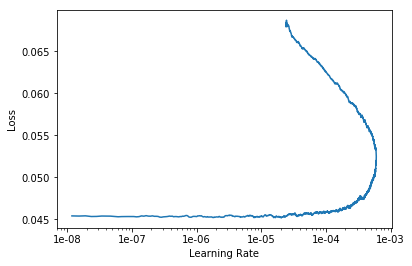

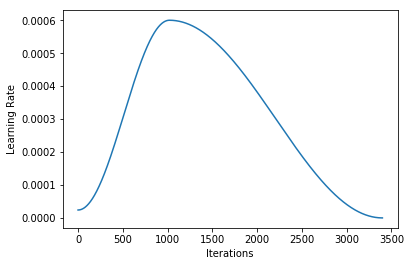

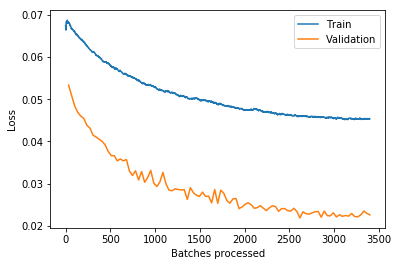

---------------------------------------- CURATED - Fold 5/10 ----------------------------------------


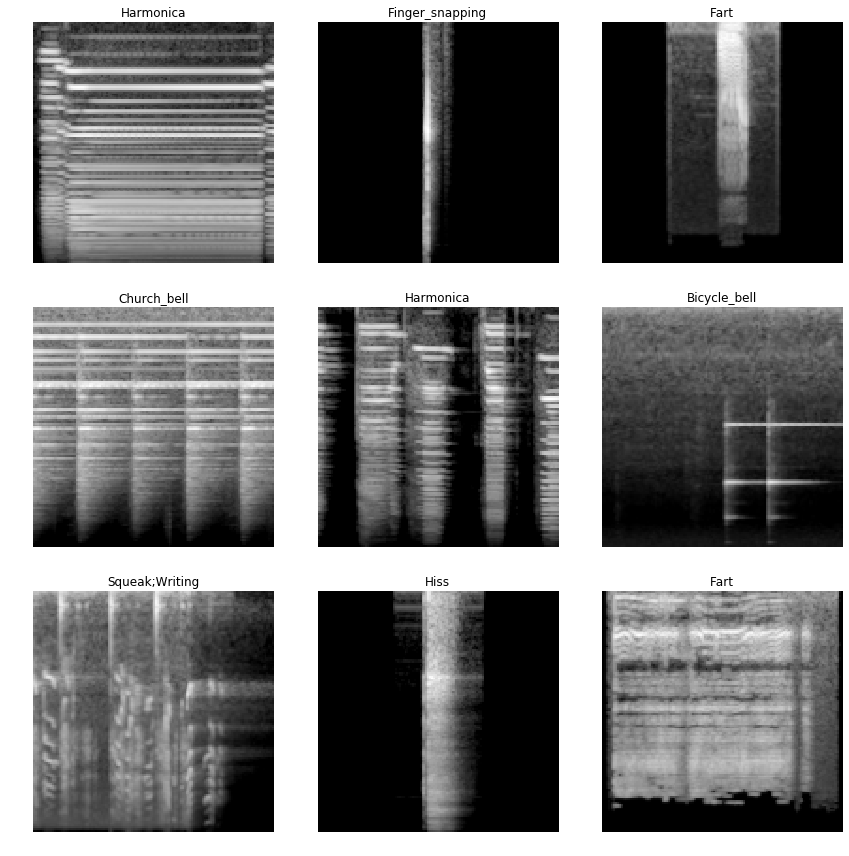

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


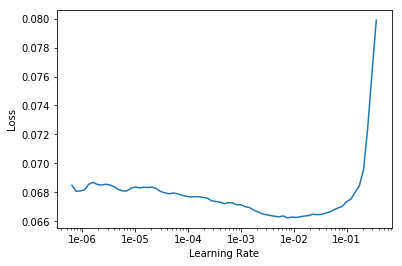

epoch,train_loss,valid_loss,lwlrap,time
0,0.067379,0.053684,0.463618,00:12
1,0.066623,0.050964,0.497225,00:12
2,0.065550,0.049476,0.520282,00:12
3,0.064839,0.048047,0.542487,00:12
4,0.063869,0.046466,0.564797,00:12
5,0.063132,0.045956,0.567790,00:12
6,0.062393,0.044345,0.593893,00:12
7,0.061641,0.043834,0.594500,00:12
8,0.060902,0.042761,0.613727,00:12
9,0.060463,0.040828,0.644771,00:12


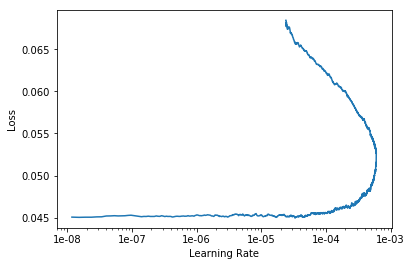

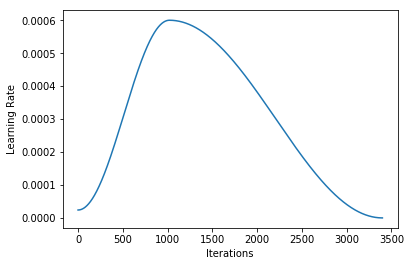

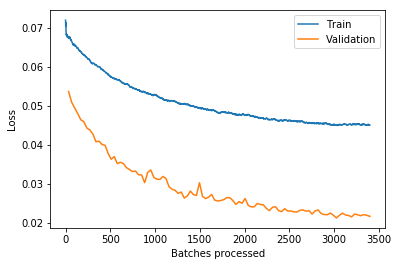

---------------------------------------- CURATED - Fold 6/10 ----------------------------------------


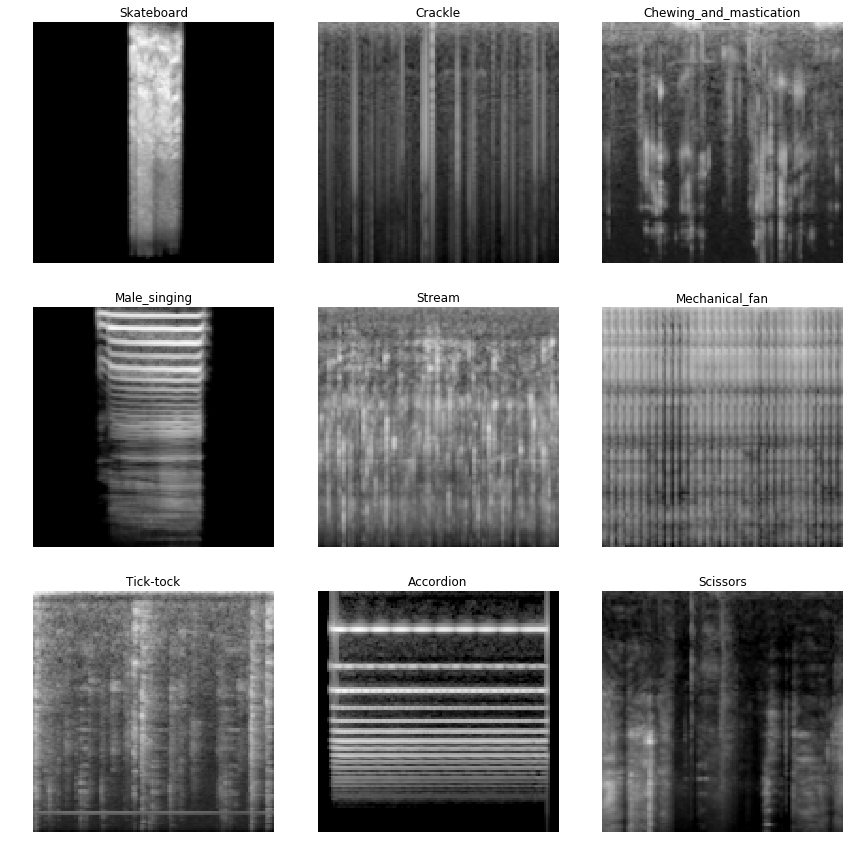

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


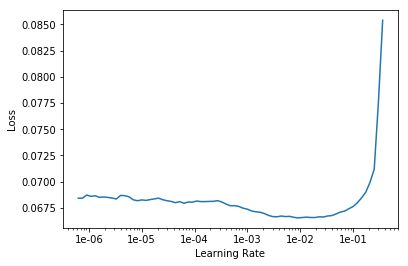

epoch,train_loss,valid_loss,lwlrap,time
0,0.067301,0.053973,0.431562,00:12
1,0.066652,0.051956,0.477210,00:12
2,0.065712,0.050327,0.502150,00:12
3,0.065050,0.047987,0.519688,00:12
4,0.064416,0.050128,0.550971,00:12
5,0.063688,0.046738,0.554768,00:12
6,0.063034,0.045867,0.585704,00:12
7,0.062357,0.043363,0.596514,00:12
8,0.061794,0.042484,0.616526,00:12
9,0.061348,0.042684,0.635755,00:12


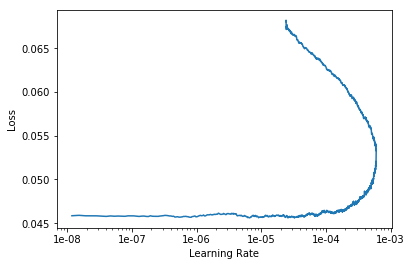

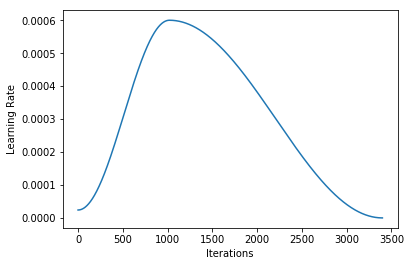

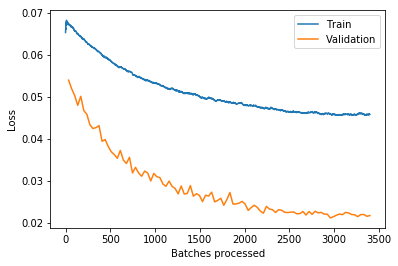

---------------------------------------- CURATED - Fold 7/10 ----------------------------------------


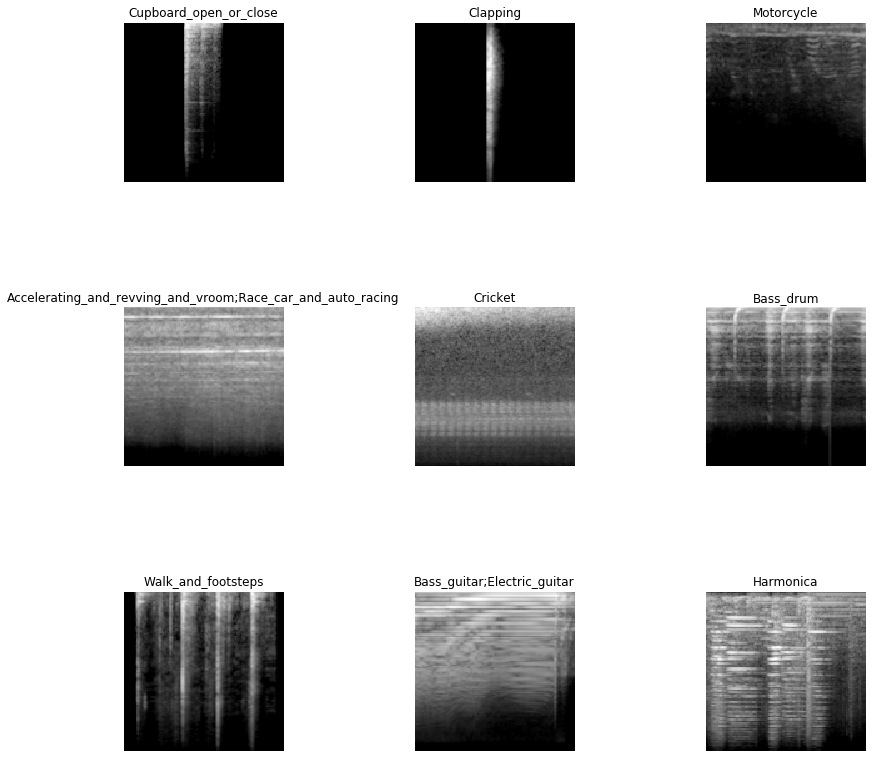

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


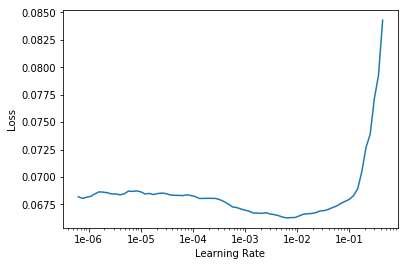

epoch,train_loss,valid_loss,lwlrap,time
0,0.067420,0.056131,0.427939,00:12
1,0.066629,0.052082,0.485151,00:12
2,0.065674,0.051075,0.502828,00:12
3,0.065159,0.048985,0.531556,00:12
4,0.064214,0.047911,0.537168,00:12
5,0.063415,0.045887,0.577013,00:12
6,0.062499,0.045468,0.579926,00:12
7,0.061755,0.042935,0.628369,00:12
8,0.061159,0.043181,0.622760,00:12
9,0.060524,0.041244,0.647976,00:12


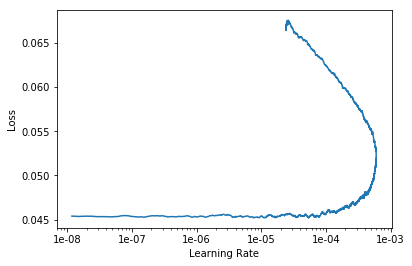

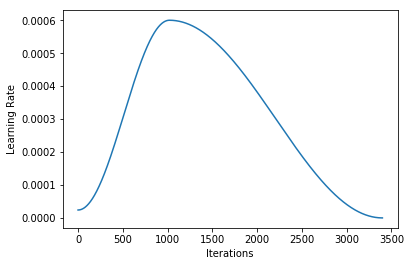

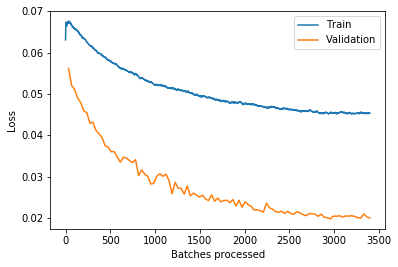

---------------------------------------- CURATED - Fold 8/10 ----------------------------------------


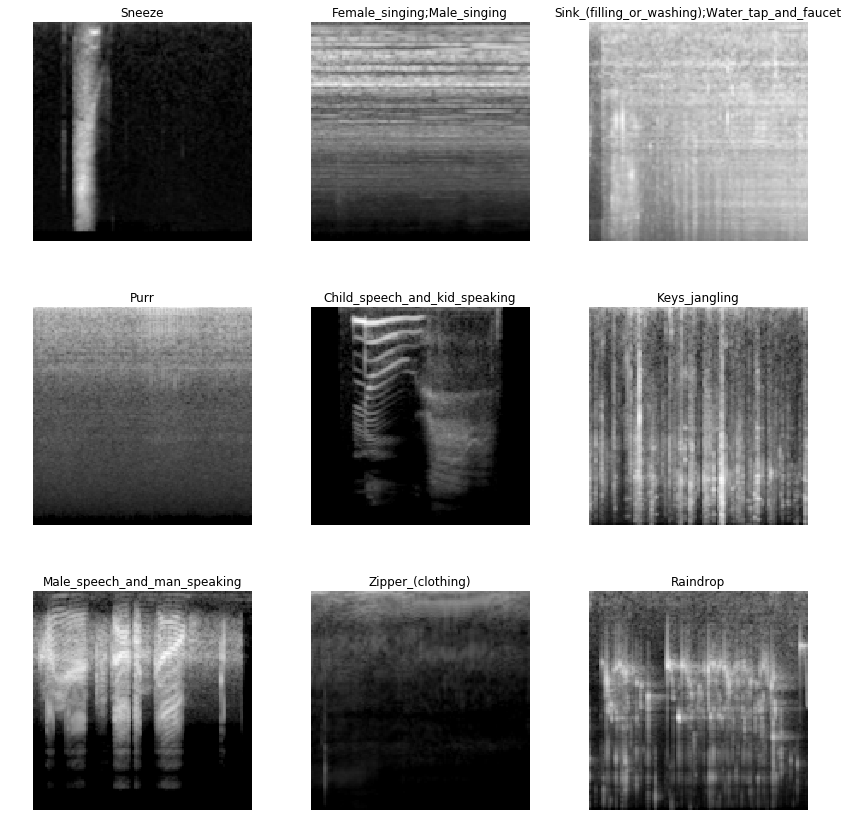

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


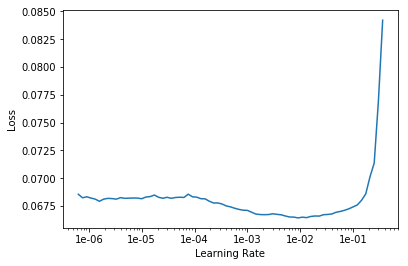

epoch,train_loss,valid_loss,lwlrap,time
0,0.067760,0.054598,0.425824,00:12
1,0.066760,0.052859,0.456503,00:12
2,0.065708,0.051067,0.489030,00:12
3,0.064870,0.048847,0.506841,00:12
4,0.064063,0.048893,0.513656,00:12
5,0.063266,0.047227,0.535575,00:12
6,0.062612,0.045146,0.574690,00:12
7,0.061758,0.045190,0.571779,00:12
8,0.060996,0.043316,0.603782,00:12
9,0.060376,0.042226,0.614534,00:12


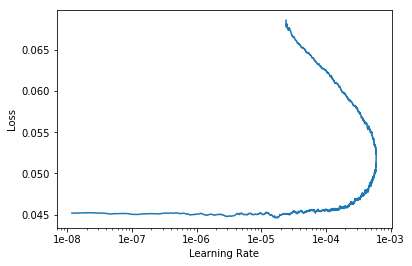

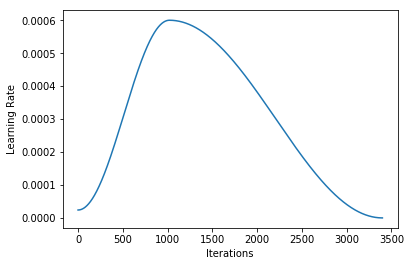

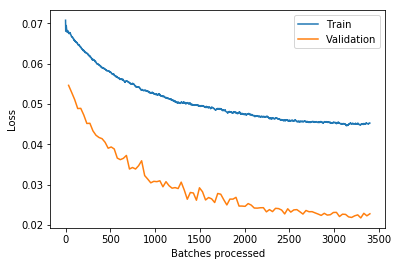

---------------------------------------- CURATED - Fold 9/10 ----------------------------------------


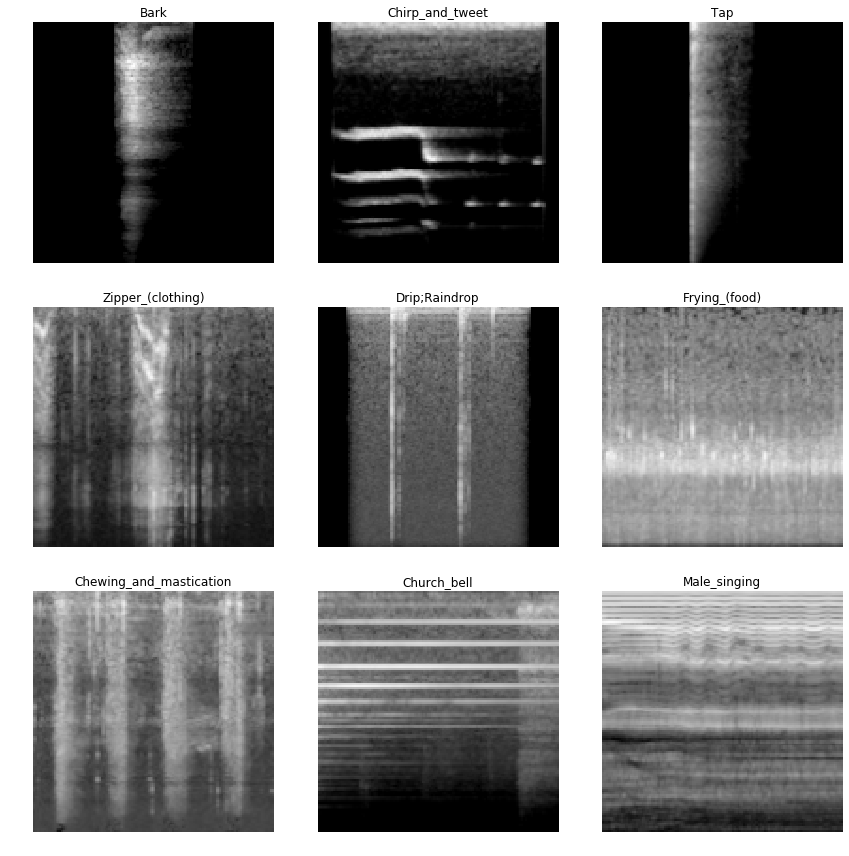

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


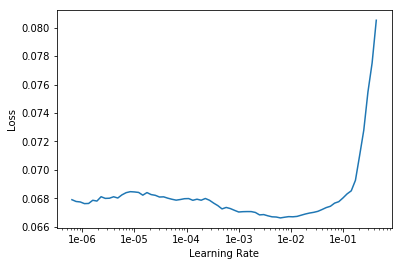

epoch,train_loss,valid_loss,lwlrap,time
0,0.067714,0.051807,0.472770,00:12
1,0.066761,0.049183,0.499797,00:12
2,0.065831,0.046970,0.533592,00:12
3,0.065099,0.046018,0.543729,00:12
4,0.064245,0.044742,0.562696,00:12
5,0.063584,0.043204,0.593512,00:12
6,0.062717,0.042229,0.600038,00:12
7,0.061972,0.040986,0.637766,00:12
8,0.061290,0.039939,0.653938,00:12
9,0.060705,0.039719,0.649138,00:12


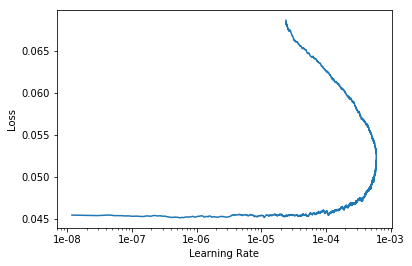

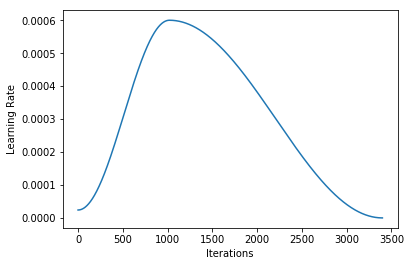

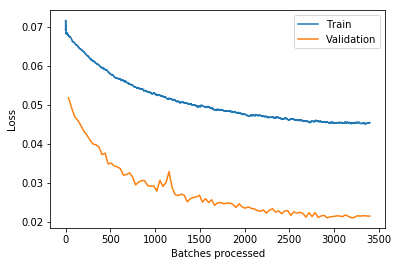

---------------------------------------- CURATED - Fold 10/10 ----------------------------------------


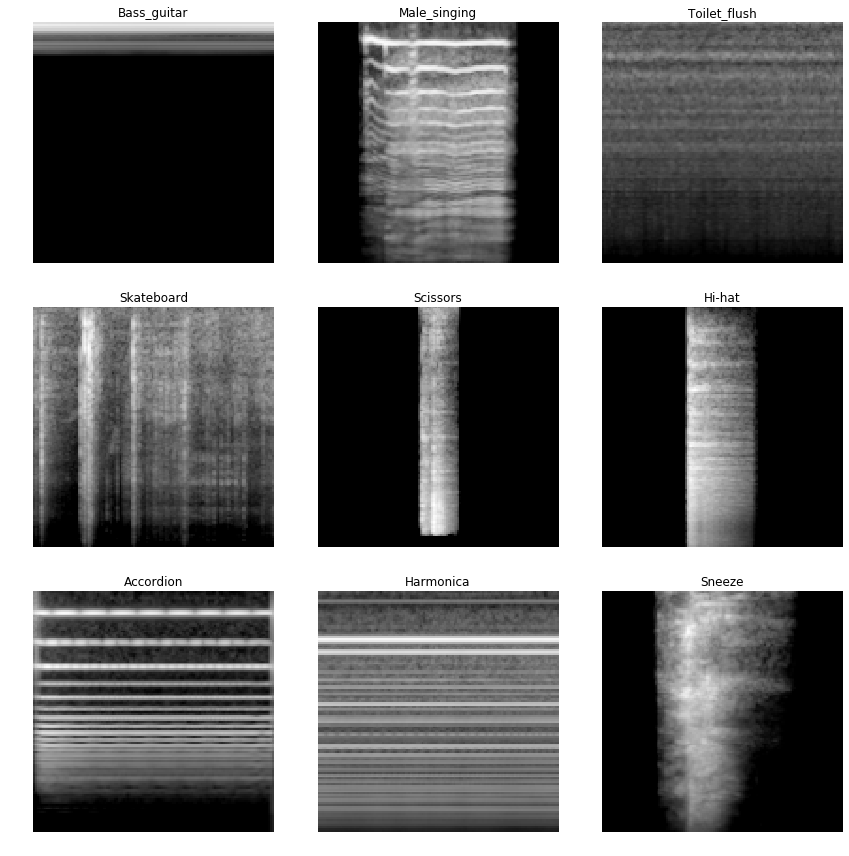

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


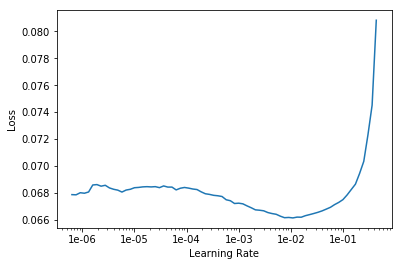

epoch,train_loss,valid_loss,lwlrap,time
0,0.067515,0.053916,0.446297,00:12
1,0.066780,0.050378,0.486182,00:12
2,0.065609,0.049290,0.518452,00:12
3,0.064861,0.047565,0.535258,00:12
4,0.063998,0.046075,0.564703,00:12
5,0.063380,0.044433,0.587063,00:12
6,0.062411,0.043256,0.594765,00:12
7,0.061697,0.041633,0.629536,00:12
8,0.060963,0.041168,0.638949,00:12
9,0.060602,0.040609,0.646001,00:12


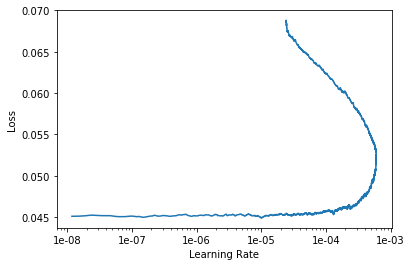

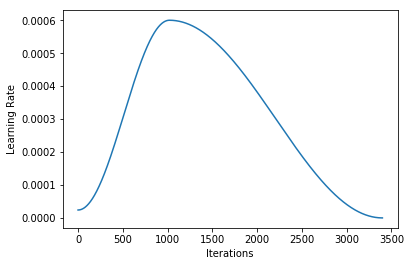

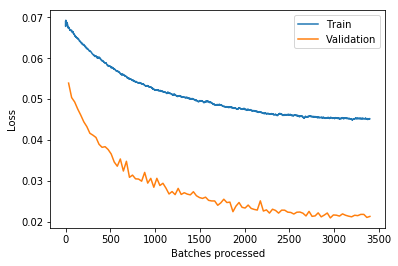

In [26]:
for fold, (train_index, valid_index) in enumerate(kf_curated.split(trn_curated_df)):
    print('-' * 40, f'CURATED - Fold {fold+1}/{n_splits}', '-' * 40)

    learn.load(f'stage-1_fold-{fold}')

    src = (ImageList.from_df(trn_curated_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    
    learn.data = data

    learning(learn, 100, 3e-3 / 5)

    learn.save(f'stage-2_fold-{fold}')
    learn.export(f'stage-2_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [27]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-2_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8754269930630387


,lwlrap,weight
Fill_(with_liquid),0.590342,0.008693
Squeak,0.637303,0.013039
Walk_and_footsteps,0.699404,0.013039
Tap,0.704021,0.013039
Hiss,0.708685,0.013039
Mechanical_fan,0.735838,0.008519
Chink_and_clink,0.765375,0.013039
Bus,0.768763,0.013039
Trickle_and_dribble,0.771013,0.009214
Cutlery_and_silverware,0.781103,0.013039


In [28]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-2_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.37736108866147494


,lwlrap,weight
Cupboard_open_or_close,0.057677,0.0125
Raindrop,0.062900,0.0125
Tap,0.064542,0.0125
Finger_snapping,0.072714,0.0125
Sigh,0.091557,0.0125
Burping_and_eructation,0.093851,0.0125
Keys_jangling,0.099547,0.0125
Shatter,0.101200,0.0125
Gasp,0.113620,0.0125
Drip,0.117029,0.0125


### Look for useful noisy samples

In [29]:
def lwlrap_per_element(fname):
    overall_preds, overall_thruth, overall_index = _kfold_prediction(kf_noisy, trn_noisy_df, fname)
    
    m = np.zeros_like(overall_preds)
    for i, (p, t) in enumerate(zip(overall_preds, overall_thruth)):
        idx, val =_one_sample_positive_class_precisions(p, t)
        m[i, idx] = val
    m = pd.DataFrame(m, columns=learn.data.classes, index=overall_index)
    
    m['fname'] = trn_noisy_df.fname

    for fold, (train_index, valid_index) in enumerate(kf_noisy.split(trn_noisy_df)):
        m.at[valid_index, 'fold'] = fold

    return m

In [30]:
m1 = lwlrap_per_element('stage-1_fold-{fold}')

In [31]:
m2 = lwlrap_per_element('stage-2_fold-{fold}')

In [32]:
m = m1.copy()
m[learn.data.classes] = np.sqrt(m1[learn.data.classes] * m2[learn.data.classes])

In [33]:
del m1, m2
gc.collect();

In [34]:
# Select samples from noisy dataset that look promising:
# - suppose correct label from organiser
# - high lwlrap on stage 1 (model with noisy elements only)
# - high lwlrap on stage 2 (model warmed up with noisy elements and then fine tuned with curated dataset)

lwlrap_threshold = .5
count_limit = 5  # per fold and per class

ok_noisy_items = []

for i, x in enumerate(learn.data.classes):
    print('\n', '*' * 20, x, '*' * 20)
    print('Found' , m[(m[x] >= lwlrap_threshold)].shape[0], 'promising element(s)')
    for fold in range(n_splits):
        selected = m[(m[x] >= lwlrap_threshold) & (m.fold == fold)].sort_values(x, ascending=False)[:count_limit].index
        ok_noisy_items.extend(selected)
        print('fold ', fold, ':', m[(m[x] >= lwlrap_threshold) & (m.fold == fold)].shape[0], m.iloc[selected].fname.tolist())

print('\nFinal selection includes', len(ok_noisy_items), '"noisy" items')


 ******************** Accelerating_and_revving_and_vroom ********************
Found 157 promising element(s)
fold  0 : 16 ['a4435a9d.wav', 'bddcf02f.wav', 'd58e1919.wav', 'ae1249ca.wav', 'f242a86a.wav']
fold  1 : 14 ['f682f18c.wav', 'c092764a.wav', '3c2f3122.wav', '87fac7cf.wav', 'bc3892c1.wav']
fold  2 : 9 ['ffd1c0e2.wav', '8119602a.wav', '40a928b7.wav', '7160d0e1.wav', 'e445db5e.wav']
fold  3 : 18 ['a0da98c4.wav', '33ab75d8.wav', 'b84be9e3.wav', 'fae6e24e.wav', '9e874ee3.wav']
fold  4 : 19 ['f12f24da.wav', '4ef17f00.wav', 'a2ae680a.wav', 'e79da000.wav', '26bdbf2b.wav']
fold  5 : 17 ['ab1c9211.wav', 'ab5cca21.wav', '73bfc028.wav', '413f17c4.wav', 'e4298185.wav']
fold  6 : 16 ['0af6c5e5.wav', '32f39d14.wav', 'e5165478.wav', '1924aa99.wav', 'bc69bdfe.wav']
fold  7 : 19 ['aa2c9029.wav', 'cc41013a.wav', 'b8b1ee59.wav', '49034bb5.wav', '88c633c1.wav']
fold  8 : 12 ['77b14052.wav', '232899b2.wav', '2872af5d.wav', '6f27c5ef.wav', 'f13ae3d3.wav']
fold  9 : 17 ['a6631a37.wav', 'f683db6f.wav',

fold  5 : 7 ['da6ac386.wav', '7473a83f.wav', '57e74185.wav', 'e8264fde.wav', '08eeefd7.wav']
fold  6 : 4 ['27b40a92.wav', 'acbf1674.wav', '072aee3f.wav', '1e0b3f60.wav']
fold  7 : 5 ['1681c859.wav', '1ef22787.wav', 'f4bba82c.wav', '8b012ef1.wav', '11d45558.wav']
fold  8 : 4 ['f2b296ff.wav', 'b2f68728.wav', '12359f23.wav', '8a234a62.wav']
fold  9 : 6 ['9916887e.wav', '52ce072a.wav', '5ef977b9.wav', '82da45c6.wav', '19e4fc03.wav']

 ******************** Child_speech_and_kid_speaking ********************
Found 183 promising element(s)
fold  0 : 23 ['a85a05d8.wav', '8f38da94.wav', '8d84f1f7.wav', 'b712fb1c.wav', 'e645d706.wav']
fold  1 : 21 ['2065b61a.wav', '883522ca.wav', 'df1e793c.wav', 'fc17c45e.wav', '9bfa532e.wav']
fold  2 : 26 ['11217a30.wav', '526d20c4.wav', '24c95306.wav', '107370b9.wav', '9d73f86f.wav']
fold  3 : 16 ['d294363b.wav', '9767f0ea.wav', '95a72932.wav', 'ff0a1dc0.wav', '61658bb9.wav']
fold  4 : 21 ['70382362.wav', '84884a59.wav', 'f9d4c615.wav', '27e32c51.wav', '4c92fa3

fold  8 : 3 ['48c56bc9.wav', '8a234a62.wav', '880ead86.wav']
fold  9 : 0 []

 ******************** Electric_guitar ********************
Found 137 promising element(s)
fold  0 : 16 ['64b7a7d3.wav', '5ffe422f.wav', '7b1704e5.wav', '0e29068e.wav', 'c402dac9.wav']
fold  1 : 15 ['c6cb06d9.wav', 'b8849de0.wav', '0e4bb504.wav', '4082e9f2.wav', 'e5580a73.wav']
fold  2 : 13 ['4bbc5e68.wav', 'b67eb33f.wav', '09339289.wav', '705c2d27.wav', 'a6b4625b.wav']
fold  3 : 9 ['3bbbb975.wav', '175cc388.wav', '9747b684.wav', '25b17429.wav', '03c47f22.wav']
fold  4 : 14 ['8c84da34.wav', 'd5b96d0c.wav', '3413624f.wav', '9860655a.wav', 'fc7f5d06.wav']
fold  5 : 12 ['bb78c6bc.wav', '922a220d.wav', 'a5f438a1.wav', '259566e0.wav', 'fa0a2319.wav']
fold  6 : 17 ['f45a2bb5.wav', '69413ee7.wav', 'd702e46c.wav', 'd89f6795.wav', '50158177.wav']
fold  7 : 9 ['afe4579f.wav', 'dcabb1fc.wav', 'ed89145d.wav', 'e3037bce.wav', '00752915.wav']
fold  8 : 14 ['fa110f3a.wav', 'ff0334b9.wav', '219d6182.wav', '5470e84b.wav', 'a957

fold  2 : 2 ['967b63e1.wav', '0825bd14.wav']
fold  3 : 3 ['81a2b6d0.wav', 'e4bdab8c.wav', '4e267f3c.wav']
fold  4 : 0 []
fold  5 : 0 []
fold  6 : 1 ['51b1abae.wav']
fold  7 : 1 ['83c3d55b.wav']
fold  8 : 4 ['36383580.wav', '12359f23.wav', 'f6887d02.wav', '3741bce6.wav']
fold  9 : 4 ['ad4eb2eb.wav', '5d5a67ae.wav', '0c3dd1c9.wav', 'f3c58b45.wav']

 ******************** Knock ********************
Found 23 promising element(s)
fold  0 : 4 ['3ea72422.wav', 'b2e38a30.wav', '99243438.wav', 'd90ffadc.wav']
fold  1 : 5 ['e454eda8.wav', 'e196f696.wav', '201edd82.wav', '36007702.wav', 'cc3d19f4.wav']
fold  2 : 0 []
fold  3 : 1 ['213d8dc2.wav']
fold  4 : 2 ['441adc4d.wav', 'ec89f781.wav']
fold  5 : 1 ['28961b29.wav']
fold  6 : 1 ['18680823.wav']
fold  7 : 7 ['351da1cf.wav', 'a9947a73.wav', 'f3b7be79.wav', 'fd0315e7.wav', 'a6984783.wav']
fold  8 : 2 ['b51c6197.wav', '7e609136.wav']
fold  9 : 0 []

 ******************** Male_singing ********************
Found 146 promising element(s)
fold  0 : 8 ['

fold  6 : 7 ['0972b227.wav', 'a834422a.wav', 'a54d44e8.wav', '1e0b3f60.wav', 'b2f56eeb.wav']
fold  7 : 4 ['5f07ccb1.wav', '488968df.wav', '0ee577c3.wav', '74e5b92c.wav']
fold  8 : 7 ['12359f23.wav', '742de709.wav', '7d17bb2a.wav', '959e1fc5.wav', 'f38e0323.wav']
fold  9 : 4 ['d755de8c.wav', '9e2c2251.wav', 'e61648e1.wav', '6b48664a.wav']

 ******************** Screaming ********************
Found 149 promising element(s)
fold  0 : 16 ['16823116.wav', '6ccf284e.wav', '45e6891b.wav', '48e305ba.wav', '3ded545d.wav']
fold  1 : 18 ['5591a9b8.wav', 'a48b2c86.wav', '0f178654.wav', '73a2f946.wav', '326df9bb.wav']
fold  2 : 17 ['980af06a.wav', 'e47517e3.wav', '72dd8bdf.wav', '24948264.wav', '3801585d.wav']
fold  3 : 23 ['cd7242dc.wav', '498ce93c.wav', 'a47a2f18.wav', 'a94c9a72.wav', 'f41c4a16.wav']
fold  4 : 14 ['b34c7932.wav', '2bfd4c44.wav', '79923e2a.wav', '561dff6c.wav', '62651fad.wav']
fold  5 : 15 ['0caf2560.wav', 'a5caa407.wav', 'd149739e.wav', '79dba53e.wav', 'ce36266b.wav']
fold  6 : 1

fold  0 : 12 ['433b9653.wav', '0c09583c.wav', '1f5babbe.wav', '32c38916.wav', 'ed46e7e7.wav']
fold  1 : 13 ['ebf826e5.wav', '0db6f5a5.wav', '8b36bba7.wav', '4c682c8c.wav', '5d453ad1.wav']
fold  2 : 3 ['55f3a2a8.wav', '73c433c5.wav', 'a9235f49.wav']
fold  3 : 3 ['1c7f4f0f.wav', '2428d3e7.wav', 'db35dd9d.wav']
fold  4 : 11 ['3f3097e0.wav', 'e106ac4d.wav', 'a6aaa40f.wav', '07ef8b36.wav', '0d845fbc.wav']
fold  5 : 4 ['d2fbc01a.wav', 'adc3f6ac.wav', 'cb19cf10.wav', '67bbdec2.wav']
fold  6 : 6 ['155e4fa6.wav', 'fb00b5ab.wav', 'c872d235.wav', 'dd8a3cd3.wav', '2ba3c046.wav']
fold  7 : 9 ['2b1e7f86.wav', '6f4132f6.wav', 'cd917d76.wav', 'c4fef2b6.wav', '7f6a8731.wav']
fold  8 : 9 ['32e68695.wav', 'c947af7f.wav', '66878e19.wav', '75cf2e24.wav', 'efc7bf7f.wav']
fold  9 : 10 ['0c08a831.wav', 'ebacded4.wav', '0740c133.wav', '8b96b74f.wav', 'fbfba6d9.wav']

 ******************** Walk_and_footsteps ********************
Found 205 promising element(s)
fold  0 : 21 ['c4634602.wav', '114fcc6b.wav', 'c34bf

## Train on Selected Noisy + Curated

---------------------------------------- CURATED+NOISY - Fold 1/10 ----------------------------------------


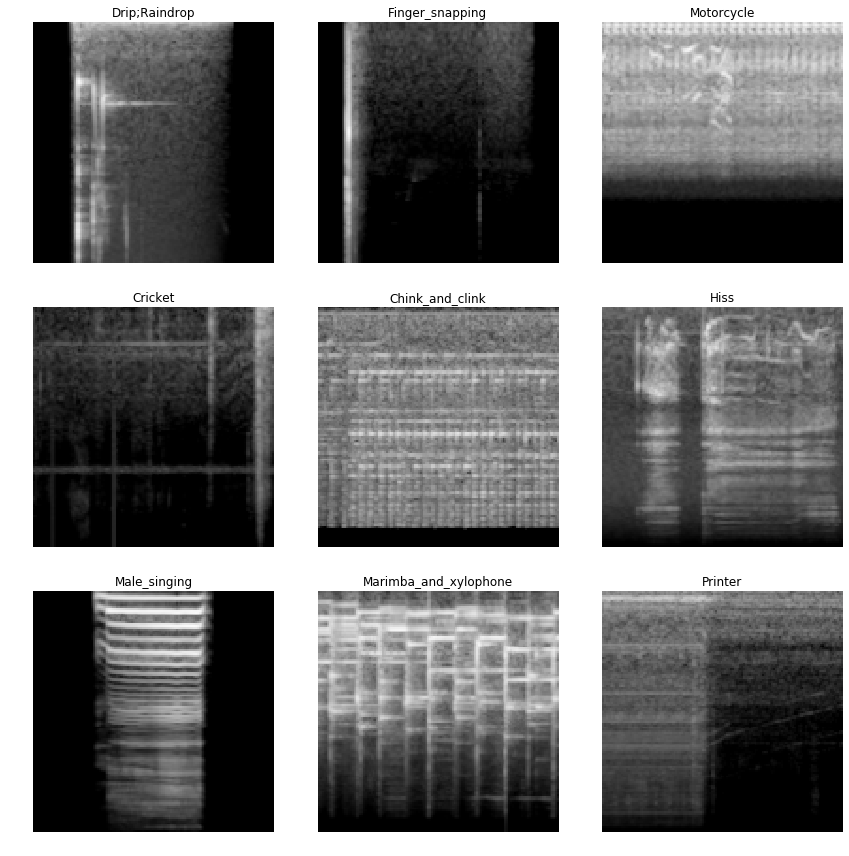

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


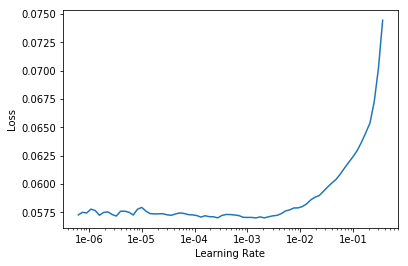

epoch,train_loss,valid_loss,lwlrap,time
0,0.055936,0.021486,0.842826,00:18
1,0.055619,0.021942,0.833198,00:18
2,0.055211,0.021491,0.849169,00:18
3,0.054815,0.021900,0.836108,00:18
4,0.054688,0.021939,0.838386,00:18
5,0.054321,0.022315,0.831652,00:18
6,0.054169,0.022045,0.840828,00:18
7,0.054192,0.022625,0.831054,00:18
8,0.054168,0.021970,0.846166,00:18
9,0.053895,0.022710,0.829208,00:18


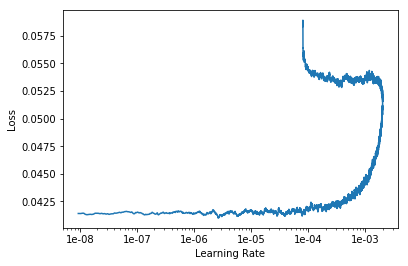

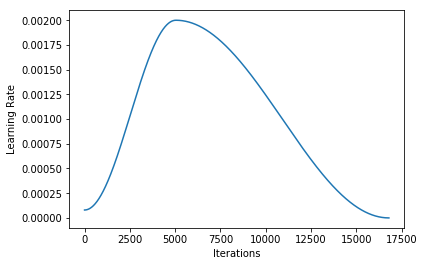

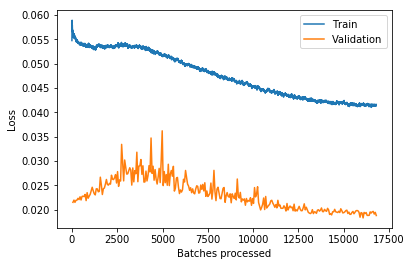

---------------------------------------- CURATED+NOISY - Fold 2/10 ----------------------------------------


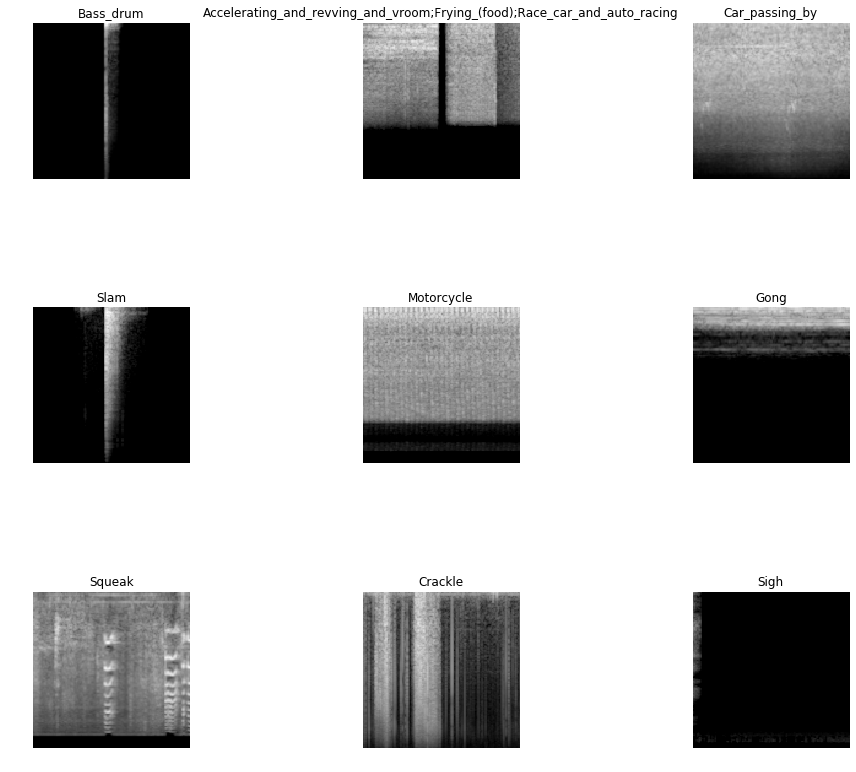

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


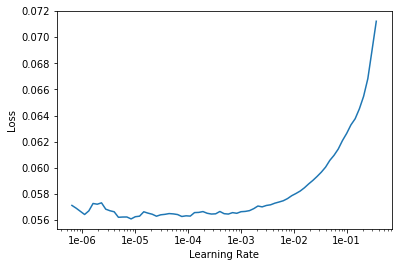

epoch,train_loss,valid_loss,lwlrap,time
0,0.056675,0.022811,0.821578,00:18
1,0.055601,0.022851,0.828076,00:18
2,0.055161,0.022786,0.833821,00:18
3,0.054793,0.022760,0.840814,00:18
4,0.054513,0.023243,0.828458,00:18
5,0.054357,0.023276,0.826105,00:18
6,0.054176,0.022794,0.837813,00:18
7,0.054097,0.023511,0.840875,00:18
8,0.054003,0.023821,0.820588,00:18
9,0.053884,0.023558,0.836191,00:18


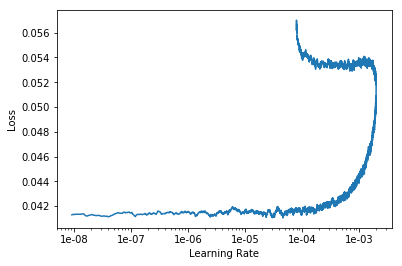

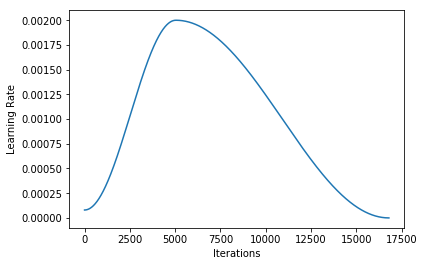

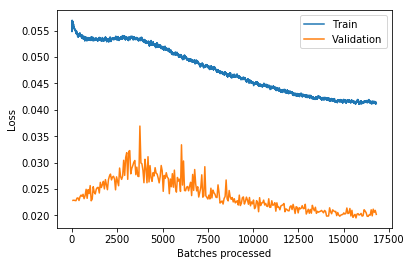

---------------------------------------- CURATED+NOISY - Fold 3/10 ----------------------------------------


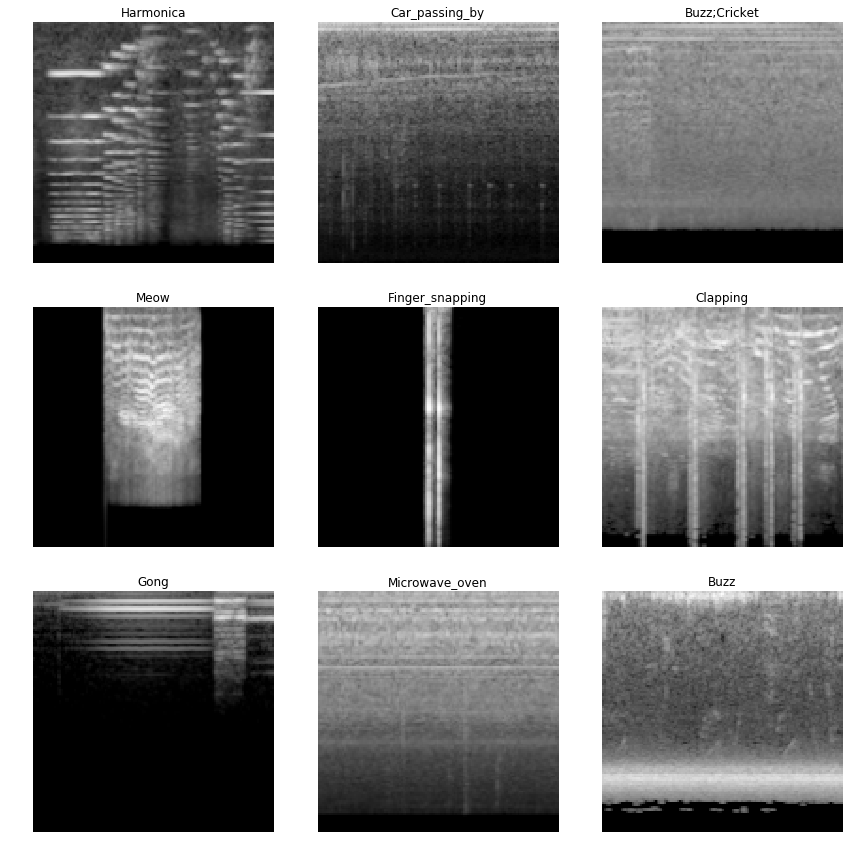

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


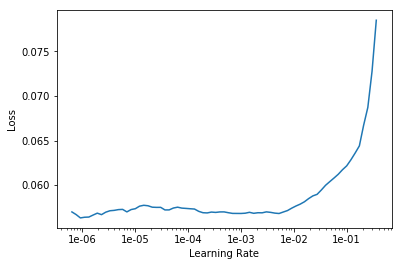

epoch,train_loss,valid_loss,lwlrap,time
0,0.055870,0.022223,0.818474,00:18
1,0.055106,0.022528,0.822440,00:18
2,0.055218,0.022734,0.822572,00:18
3,0.055080,0.022723,0.829360,00:18
4,0.054653,0.022913,0.820428,00:18
5,0.054581,0.023141,0.817792,00:18
6,0.054294,0.022620,0.821838,00:18
7,0.053966,0.023486,0.821051,00:18
8,0.054090,0.023009,0.819484,00:18
9,0.053878,0.022923,0.824686,00:18


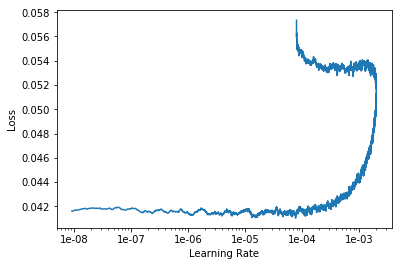

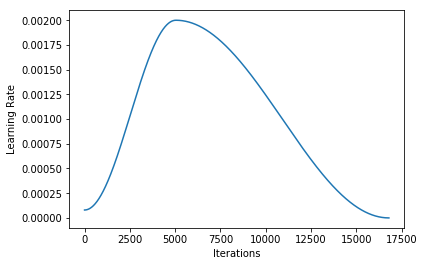

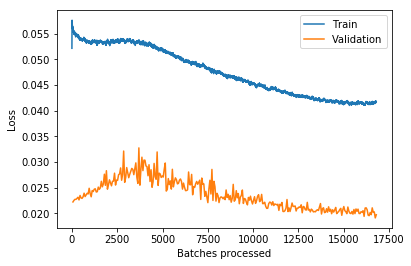

---------------------------------------- CURATED+NOISY - Fold 4/10 ----------------------------------------


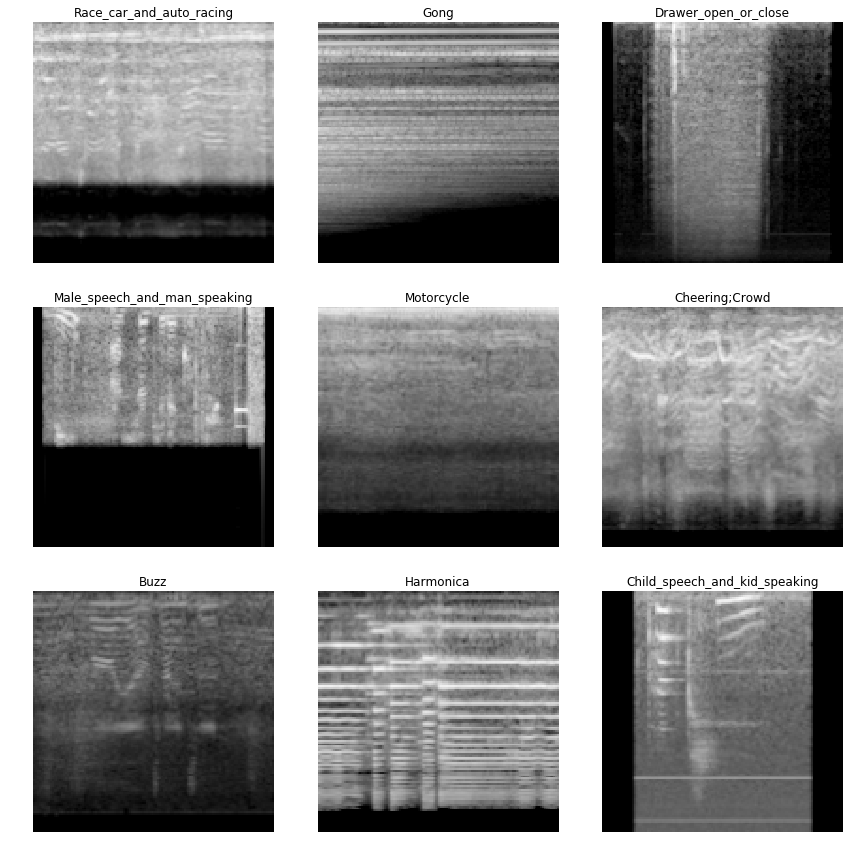

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


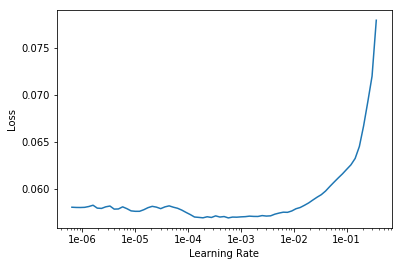

epoch,train_loss,valid_loss,lwlrap,time
0,0.055895,0.022783,0.812890,00:18
1,0.055318,0.022807,0.827679,00:18
2,0.054754,0.023301,0.815320,00:18
3,0.054565,0.022896,0.833821,00:18
4,0.054060,0.023467,0.818548,00:18
5,0.054244,0.023036,0.826318,00:18
6,0.054352,0.024181,0.818976,00:18
7,0.053974,0.024058,0.812351,00:18
8,0.053839,0.023059,0.826322,00:18
9,0.053823,0.023775,0.818993,00:18


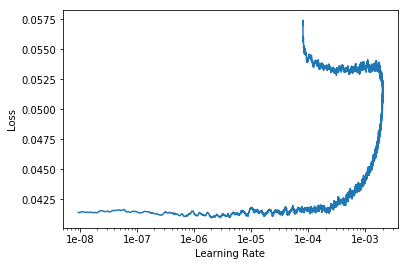

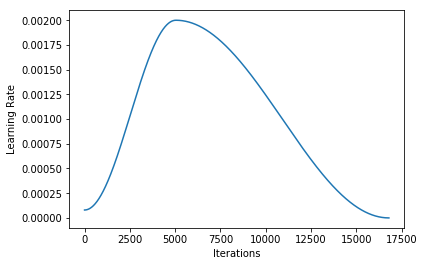

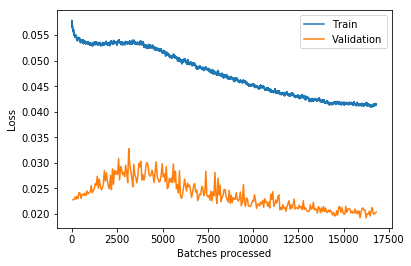

---------------------------------------- CURATED+NOISY - Fold 5/10 ----------------------------------------


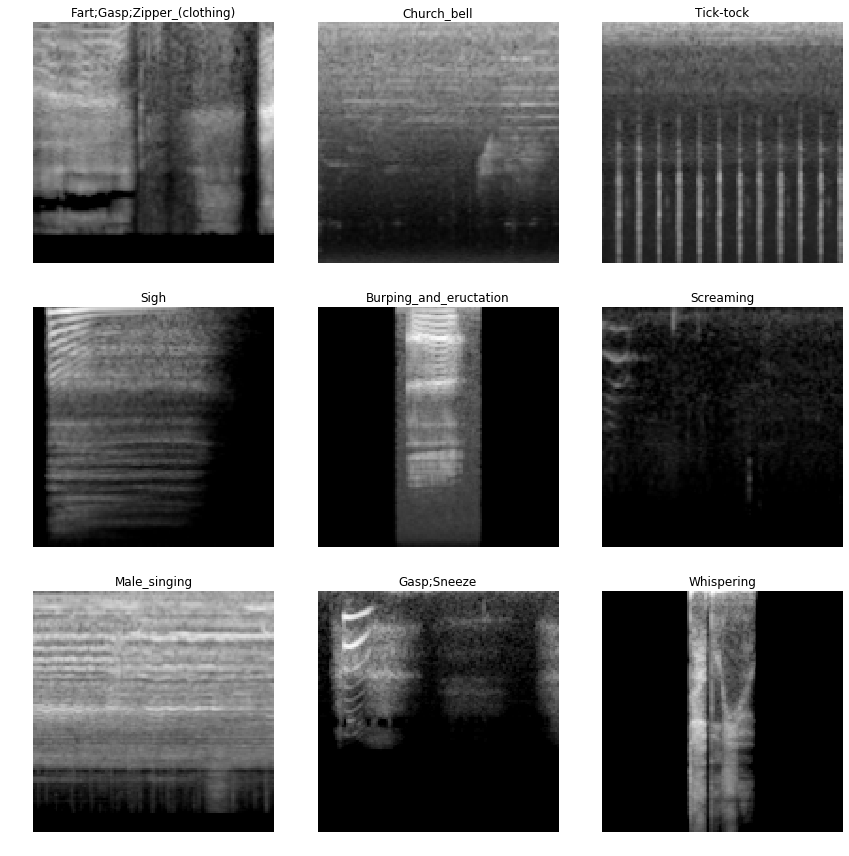

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


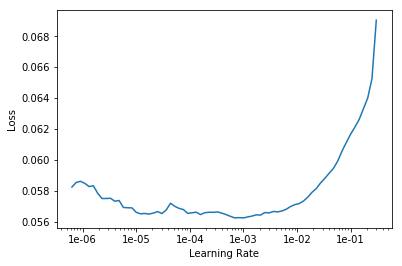

epoch,train_loss,valid_loss,lwlrap,time
0,0.056210,0.022737,0.837922,00:18
1,0.055442,0.022906,0.836853,00:18
2,0.054829,0.022448,0.840432,00:18
3,0.054241,0.023622,0.829569,00:18
4,0.054181,0.022393,0.848995,00:18
5,0.054292,0.022135,0.856921,00:18
6,0.054159,0.023784,0.829728,00:18
7,0.053879,0.023823,0.827585,00:18
8,0.054048,0.022927,0.842064,00:18
9,0.053660,0.022679,0.842641,00:18


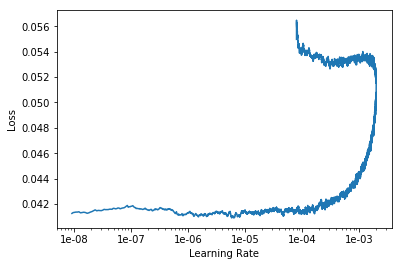

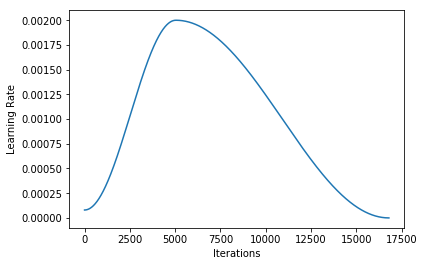

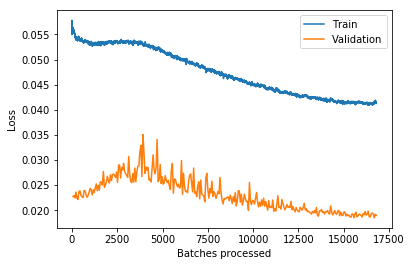

---------------------------------------- CURATED+NOISY - Fold 6/10 ----------------------------------------


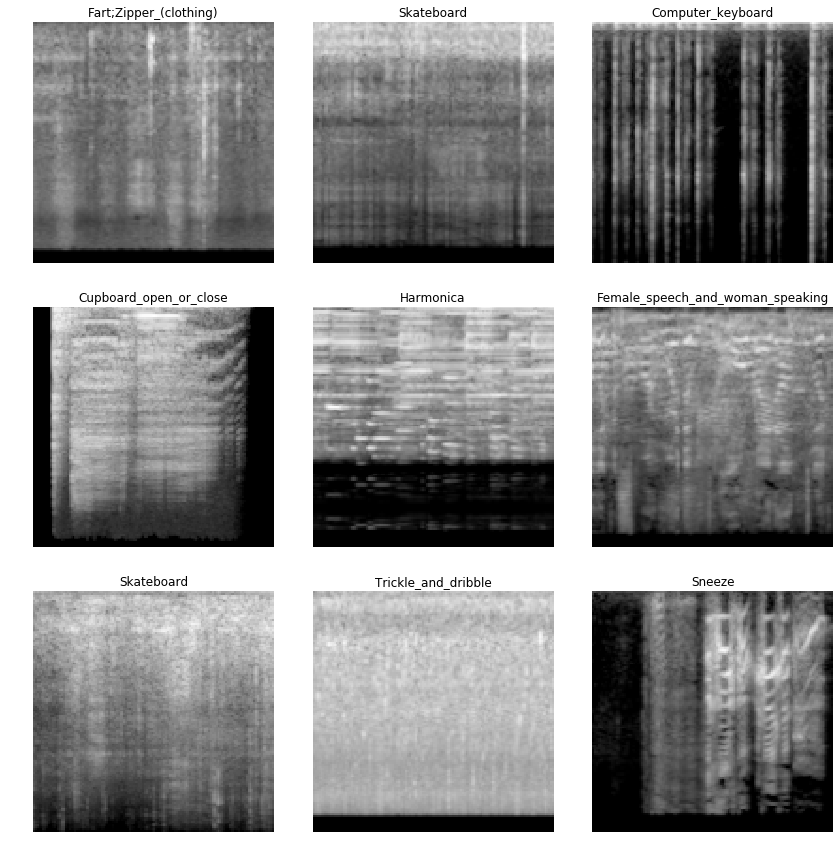

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


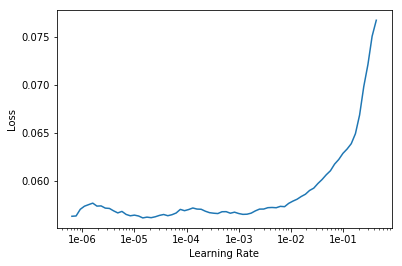

epoch,train_loss,valid_loss,lwlrap,time
0,0.056386,0.021757,0.835802,00:18
1,0.055731,0.022283,0.830422,00:18
2,0.055402,0.022243,0.828274,00:18
3,0.055344,0.022744,0.823428,00:18
4,0.055154,0.022484,0.832291,00:18
5,0.054708,0.023635,0.823219,00:18
6,0.054820,0.021958,0.840708,00:18
7,0.054438,0.022829,0.832367,00:18
8,0.054663,0.023001,0.831237,00:18
9,0.054391,0.023699,0.821501,00:18


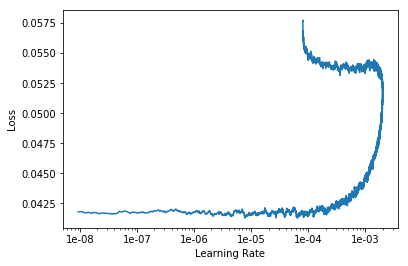

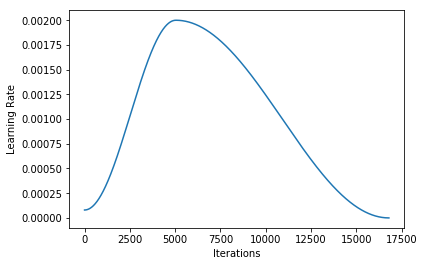

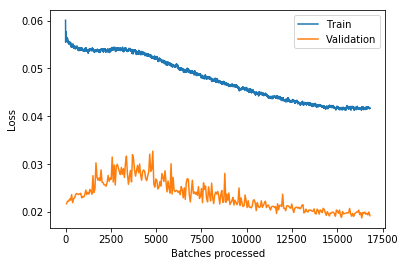

---------------------------------------- CURATED+NOISY - Fold 7/10 ----------------------------------------


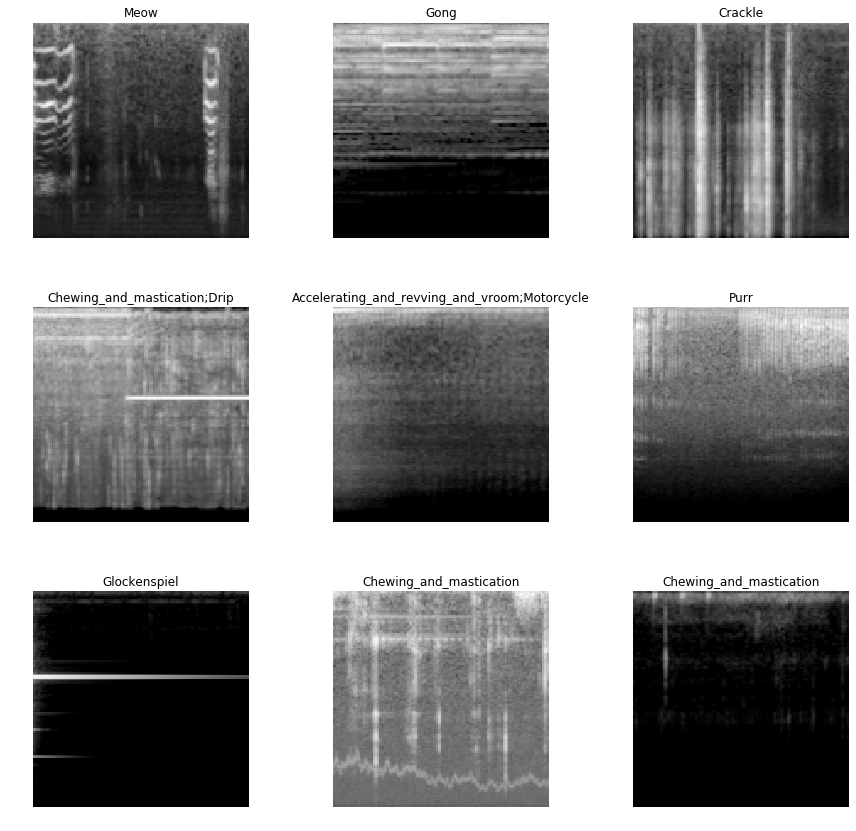

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


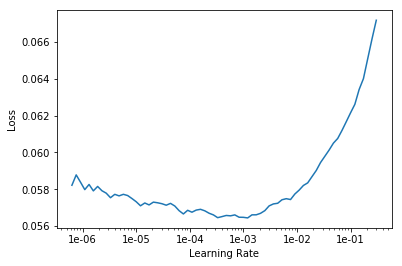

epoch,train_loss,valid_loss,lwlrap,time
0,0.055995,0.020570,0.855194,00:18
1,0.055574,0.021007,0.862009,00:18
2,0.055002,0.021568,0.850429,00:18
3,0.054638,0.021804,0.849458,00:18
4,0.054689,0.021882,0.849943,00:18
5,0.054611,0.021717,0.849684,00:18
6,0.054281,0.021455,0.849257,00:18
7,0.054109,0.021670,0.850144,00:18
8,0.054108,0.021222,0.861421,00:18
9,0.053932,0.022482,0.838830,00:18


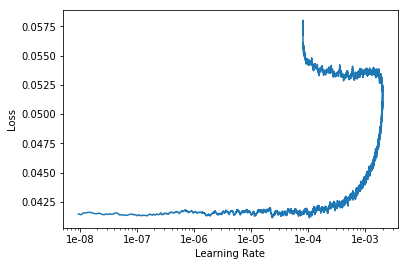

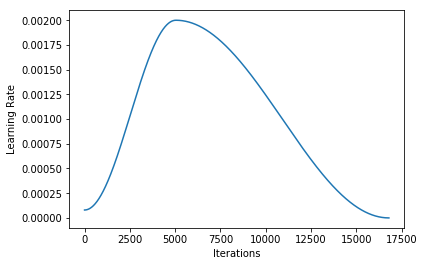

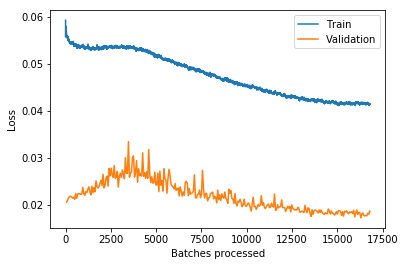

---------------------------------------- CURATED+NOISY - Fold 8/10 ----------------------------------------


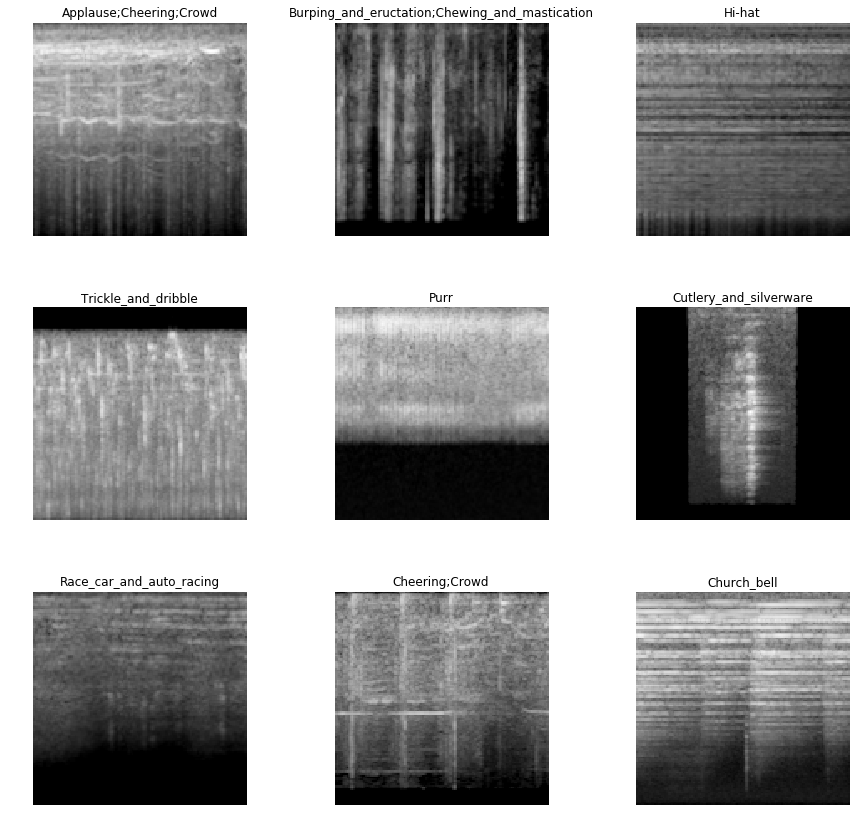

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


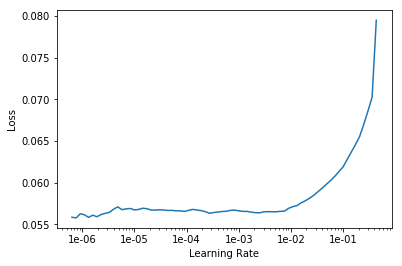

epoch,train_loss,valid_loss,lwlrap,time
0,0.055949,0.022097,0.837921,00:18
1,0.055093,0.022951,0.831325,00:18
2,0.054435,0.022570,0.843118,00:18
3,0.054514,0.023912,0.818493,00:18
4,0.054421,0.023202,0.828404,00:18
5,0.054150,0.023331,0.831797,00:18
6,0.054101,0.023485,0.830500,00:18
7,0.053798,0.023437,0.836027,00:18
8,0.053553,0.024333,0.820789,00:18
9,0.053703,0.023447,0.827507,00:18


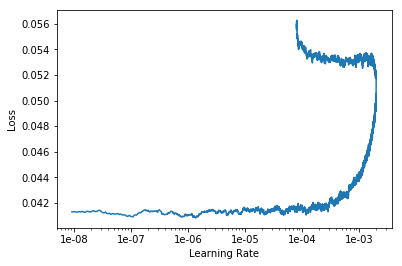

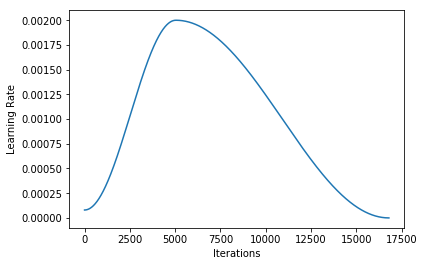

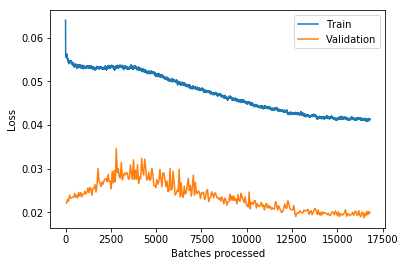

---------------------------------------- CURATED+NOISY - Fold 9/10 ----------------------------------------


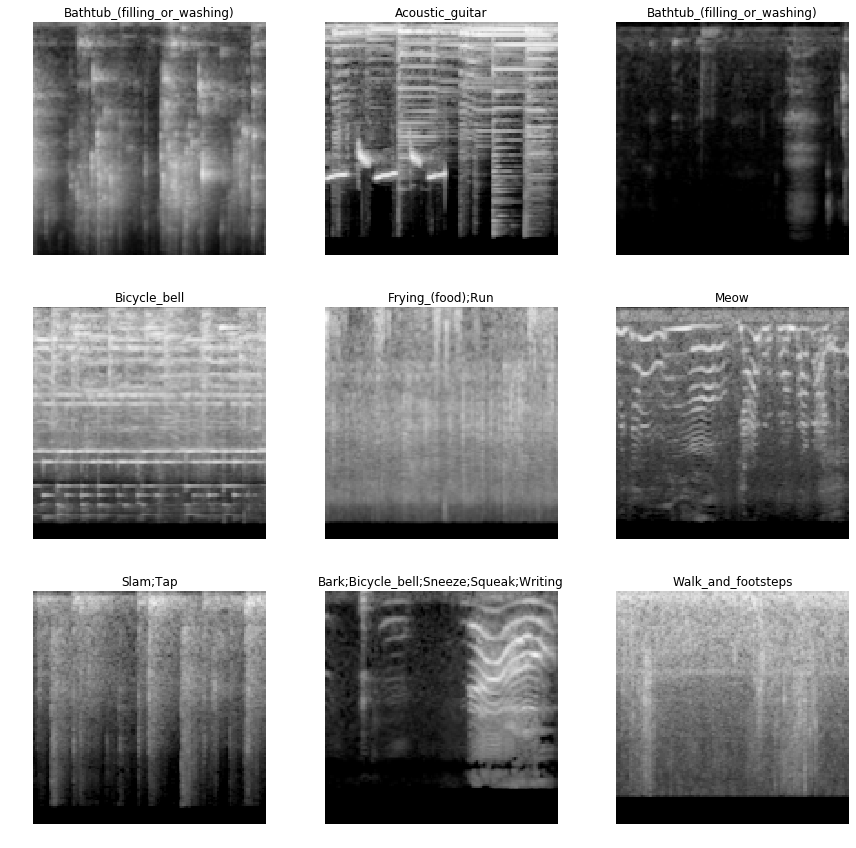

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


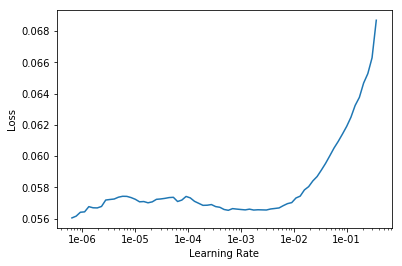

epoch,train_loss,valid_loss,lwlrap,time
0,0.056028,0.021243,0.846011,00:18
1,0.055253,0.021727,0.842090,00:18
2,0.055243,0.021143,0.851824,00:18
3,0.054712,0.021438,0.841214,00:18
4,0.054633,0.021602,0.850444,00:18
5,0.054618,0.021735,0.840150,00:19
6,0.054283,0.022394,0.835329,00:18
7,0.054082,0.022125,0.841425,00:18
8,0.053881,0.021972,0.848040,00:18
9,0.054147,0.022193,0.844640,00:18


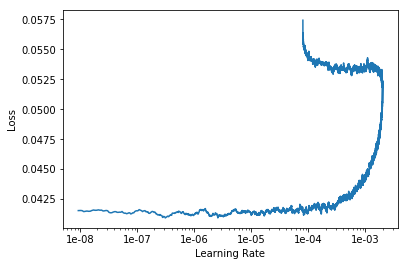

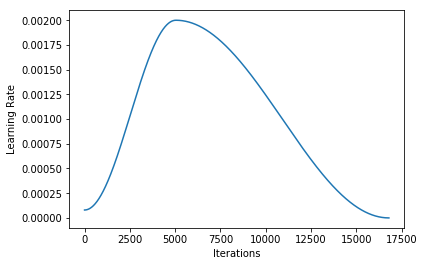

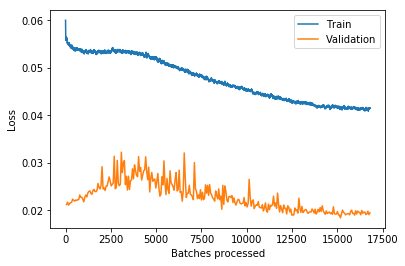

---------------------------------------- CURATED+NOISY - Fold 10/10 ----------------------------------------


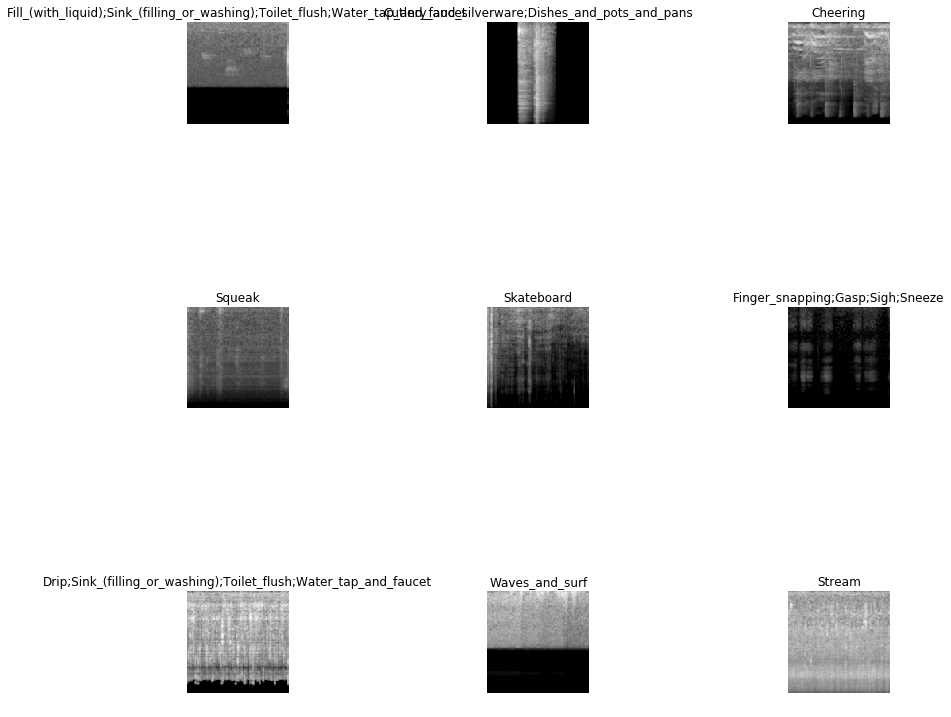

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


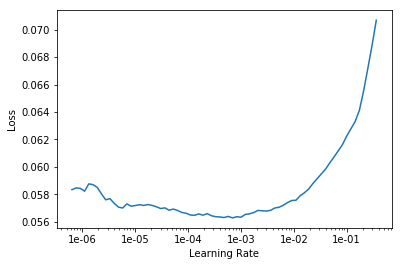

epoch,train_loss,valid_loss,lwlrap,time
0,0.056011,0.021008,0.838507,00:18
1,0.055592,0.022793,0.819009,00:19
2,0.055018,0.022287,0.829713,00:18
3,0.054742,0.021948,0.840029,00:18
4,0.054316,0.022781,0.824015,00:18
5,0.054165,0.022527,0.834342,00:19
6,0.053936,0.022869,0.829888,00:19
7,0.054166,0.022847,0.831993,00:18
8,0.053971,0.022437,0.836979,00:19
9,0.054052,0.022957,0.836431,00:18


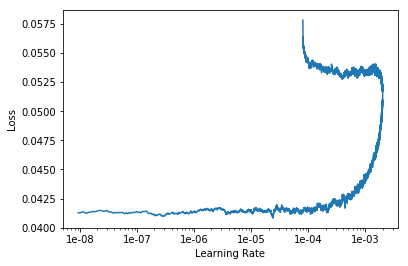

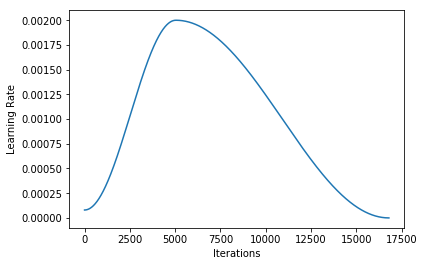

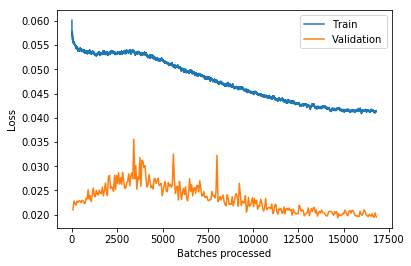

In [35]:
for fold, ((train_index1, valid_index1), (train_index2, valid_index2)) in enumerate(zip(kf_curated.split(trn_curated_df), kf_noisy.split(trn_noisy_df))):
    print('-' * 40, f'CURATED+NOISY - Fold {fold+1}/{n_splits}', '-' * 40)

    train_index2 = list(set(train_index2).intersection(set(ok_noisy_items)))
    
    mix_df = pd.concat([
        trn_curated_df.iloc[train_index1],
        trn_noisy_df.iloc[train_index2],
        trn_curated_df.iloc[valid_index1],
#         trn_noisy_df.iloc[valid_index2],  # compute lwlrap only on curated
    ], ignore_index=True)
    train_index = mix_df[:len(train_index1)+len(train_index2)].index
    valid_index = mix_df[len(train_index1)+len(train_index2):].index

    
    src = (ImageList.from_df(mix_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    learn.load(f'stage-2_fold-{fold}')
    learn.data = data

#     learning(learn, 100, 1e-2)
    learning(learn, 300, 2e-3)
    
    learn.save(f'stage-10_fold-{fold}')
    learn.export(f'stage-10_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [36]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-10_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8867165030236389


,lwlrap,weight
Squeak,0.647021,0.013039
Walk_and_footsteps,0.682881,0.013039
Mechanical_fan,0.706404,0.008519
Fill_(with_liquid),0.718342,0.008693
Hiss,0.750569,0.013039
Tap,0.762854,0.013039
Chink_and_clink,0.771752,0.013039
Cutlery_and_silverware,0.772668,0.013039
Sink_(filling_or_washing),0.778612,0.013039
Traffic_noise_and_roadway_noise,0.780981,0.013039


In [37]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-10_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.5651347027383816


,lwlrap,weight
Burping_and_eructation,0.127234,0.0125
Raindrop,0.185532,0.0125
Finger_snapping,0.191969,0.0125
Tap,0.194861,0.0125
Keys_jangling,0.211629,0.0125
Cupboard_open_or_close,0.226710,0.0125
Sigh,0.241519,0.0125
Shatter,0.279704,0.0125
Zipper_(clothing),0.285012,0.0125
Writing,0.288094,0.0125


In [38]:
def lwlrap_per_sample(fname, kf, df):
    overall_preds, overall_thruth, overall_index = _kfold_prediction(kf, df, fname)
    
    m = pd.DataFrame(
        [_one_sample_positive_class_precisions(p, t)[1].mean() for i, (p, t) in enumerate(zip(overall_preds, overall_thruth))],
        columns=['lwlrap'],
        index=overall_index
    )
    
    m[['fname', 'labels']] = df[['fname', 'labels']]

    return m.sort_values('lwlrap', ascending=False)

In [39]:
m4 = lwlrap_per_sample('stage-10_fold-{fold}', kf_noisy, trn_noisy_df)

In [40]:
m4

,lwlrap,fname,labels
16,1.000000,002d93e0.wav,Crowd
5757,1.000000,4a0a6161.wav,Hi-hat
4976,1.000000,400377ba.wav,Accordion
4994,1.000000,404452c1.wav,"Bass_drum,Hi-hat,Bass_guitar"
5062,1.000000,412a484d.wav,Gong
5151,1.000000,425a058d.wav,Yell
5186,1.000000,42b835ed.wav,Female_singing
5191,1.000000,42c7ec6b.wav,Zipper_(clothing)
5245,1.000000,4379e27a.wav,Walk_and_footsteps
5249,1.000000,43855905.wav,Motorcycle


In [41]:
(m4.lwlrap < .5).sum(), (m4.lwlrap >= .5).sum(), (m4.lwlrap == 1).sum()

(8583, 11232, 7991)

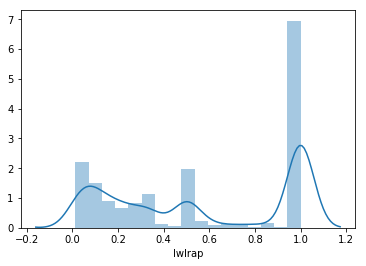

In [42]:
sns.distplot(m4.lwlrap);

In [43]:
ok_noisy_items2 = m4[m4.lwlrap == 1].index
len(ok_noisy_items2)

7991

---------------------------------------- CURATED+NOISY+2 - Fold 1/10 ----------------------------------------


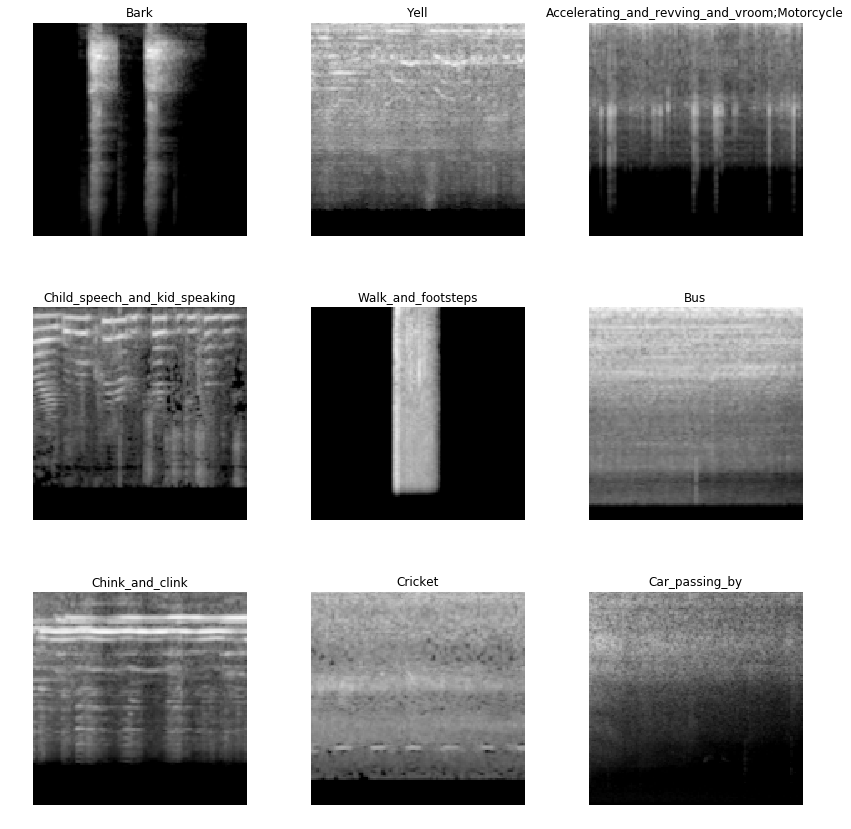

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


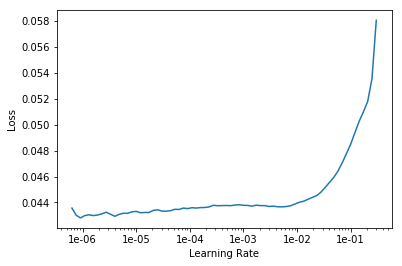

epoch,train_loss,valid_loss,lwlrap,time
0,0.042935,0.019889,0.846959,00:28
1,0.042857,0.021078,0.828129,00:28
2,0.042752,0.019367,0.841821,00:28
3,0.042803,0.019608,0.836665,00:28
4,0.042730,0.019780,0.842020,00:28
5,0.042950,0.020898,0.843485,00:28
6,0.043252,0.023353,0.808791,00:28
7,0.043668,0.022577,0.822999,00:28
8,0.044181,0.025492,0.791100,00:28
9,0.044854,0.024727,0.799859,00:28


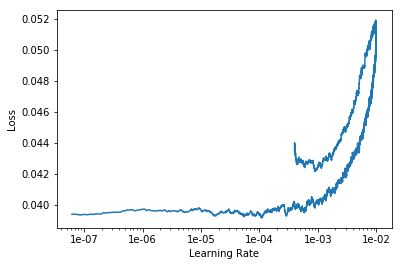

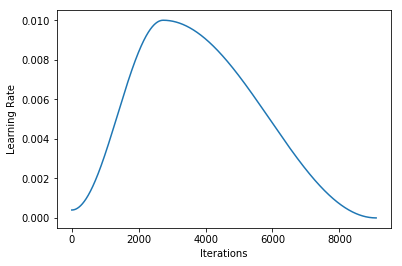

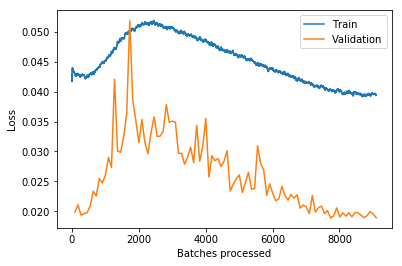

---------------------------------------- CURATED+NOISY+2 - Fold 2/10 ----------------------------------------


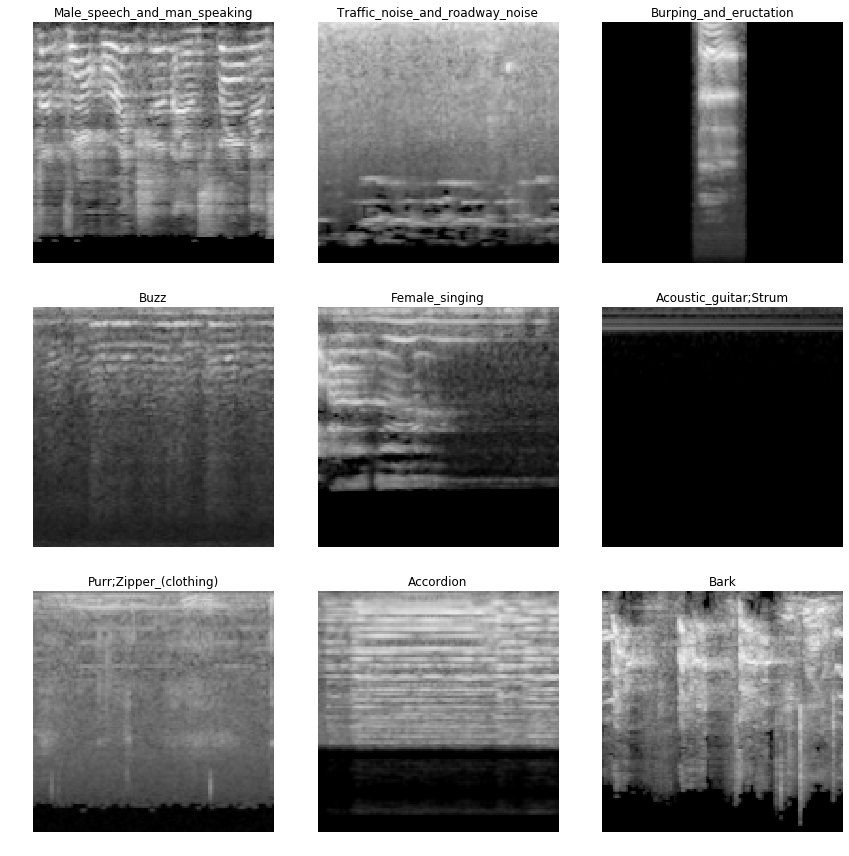

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


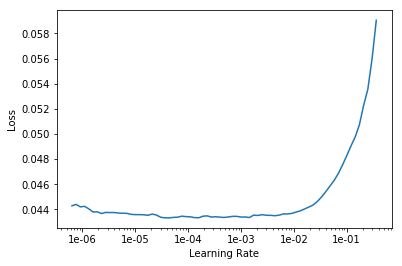

epoch,train_loss,valid_loss,lwlrap,time
0,0.043296,0.021824,0.822916,00:28
1,0.042450,0.021464,0.839787,00:28
2,0.043019,0.020633,0.839777,00:28
3,0.042656,0.021287,0.834935,00:28
4,0.042643,0.021873,0.836098,00:28
5,0.042795,0.022571,0.830352,00:28
6,0.043154,0.024288,0.807497,00:28
7,0.043886,0.023286,0.825902,00:28
8,0.044071,0.024812,0.799834,00:28
9,0.044575,0.027522,0.778919,00:28


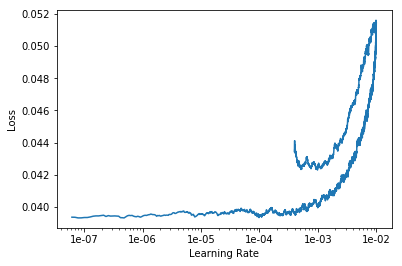

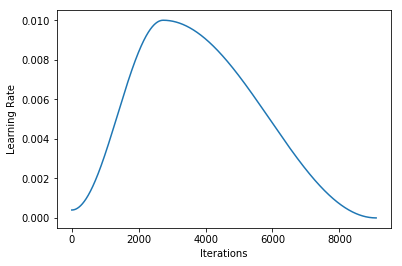

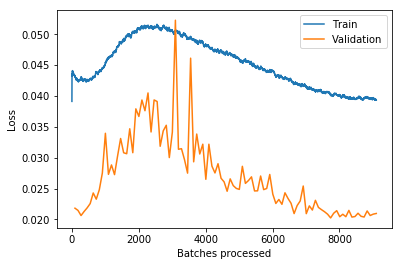

---------------------------------------- CURATED+NOISY+2 - Fold 3/10 ----------------------------------------


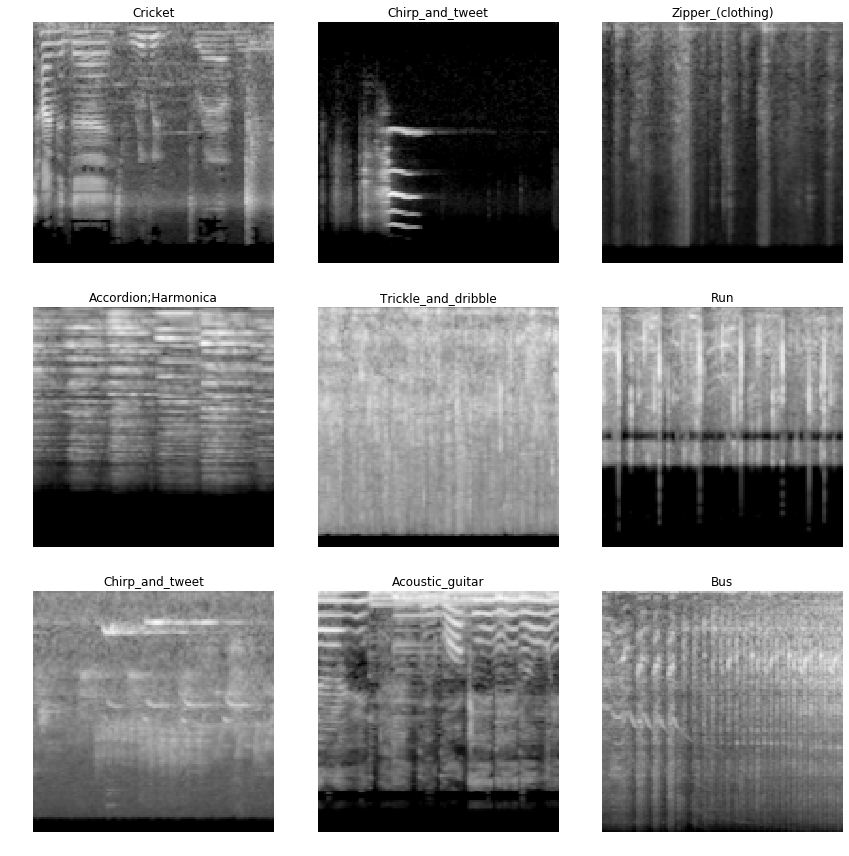

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


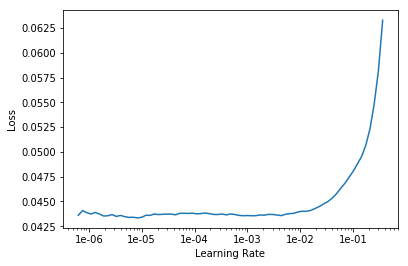

epoch,train_loss,valid_loss,lwlrap,time
0,0.043160,0.019954,0.840080,00:28
1,0.042673,0.020375,0.837184,00:28
2,0.042497,0.020862,0.841071,00:28
3,0.042451,0.021532,0.836928,00:28
4,0.042928,0.021225,0.835139,00:28
5,0.043060,0.022534,0.815963,00:28
6,0.043297,0.023265,0.802702,00:28
7,0.043472,0.023596,0.804842,00:28
8,0.044149,0.025085,0.795881,00:28
9,0.044705,0.025789,0.785652,00:28


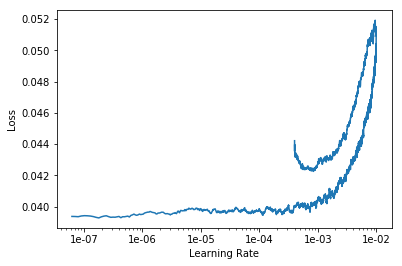

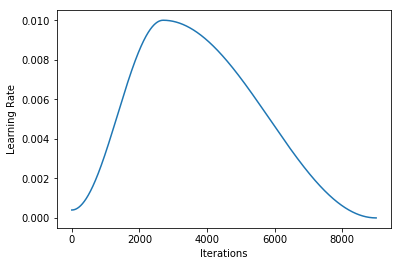

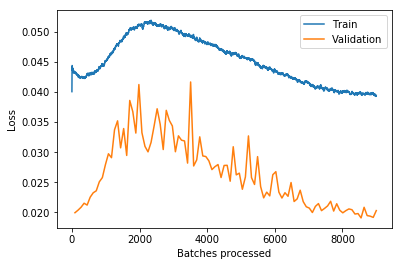

---------------------------------------- CURATED+NOISY+2 - Fold 4/10 ----------------------------------------


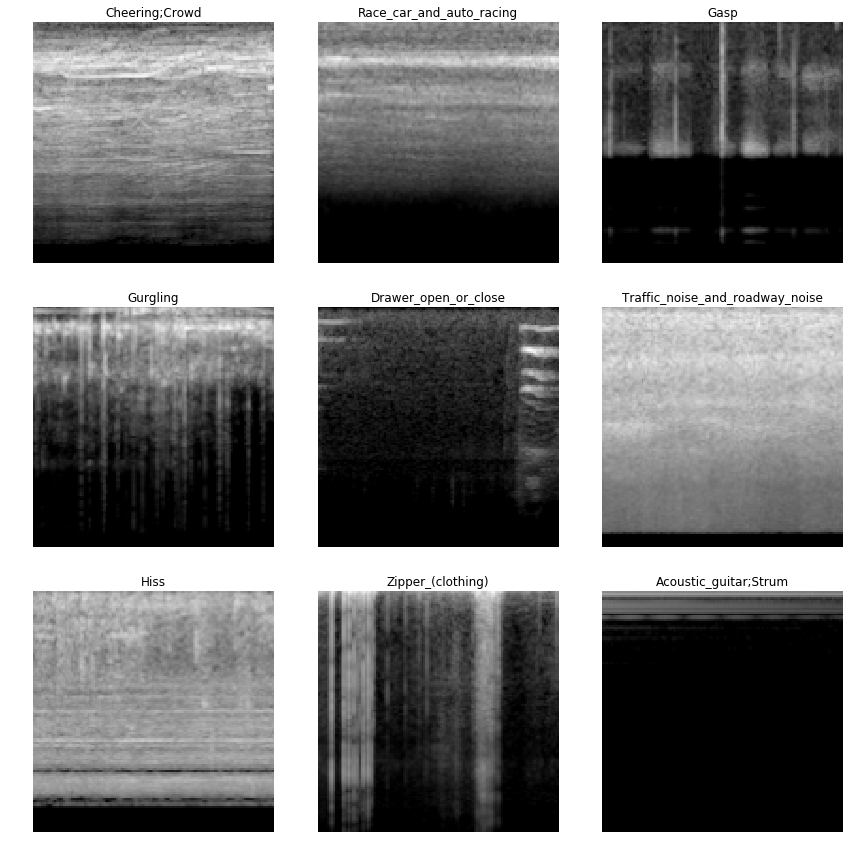

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


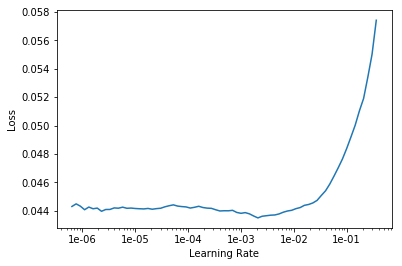

epoch,train_loss,valid_loss,lwlrap,time
0,0.042998,0.021572,0.831654,00:28
1,0.042905,0.021325,0.833628,00:28
2,0.042562,0.021585,0.828675,00:28
3,0.042623,0.021001,0.828636,00:28
4,0.042564,0.023242,0.819349,00:28
5,0.042739,0.021647,0.825810,00:28
6,0.042965,0.022543,0.824630,00:28
7,0.043444,0.026828,0.776562,00:28
8,0.044022,0.026609,0.777323,00:28
9,0.044872,0.025690,0.795780,00:28


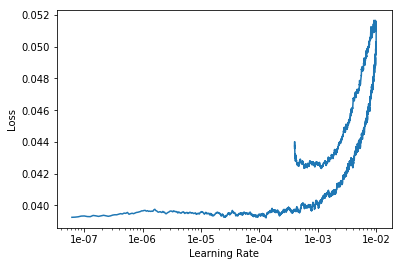

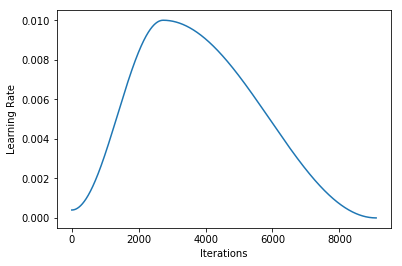

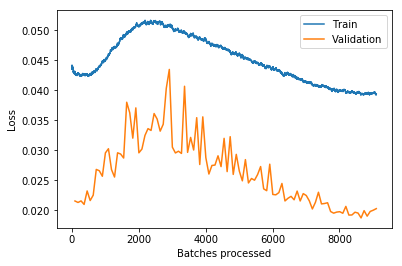

---------------------------------------- CURATED+NOISY+2 - Fold 5/10 ----------------------------------------


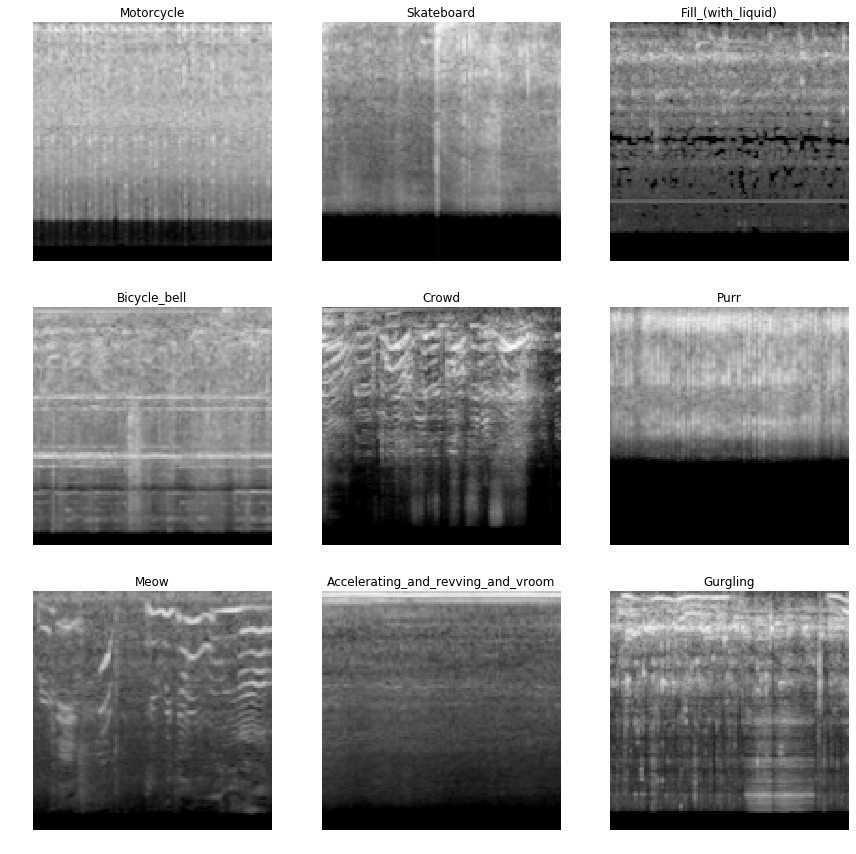

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


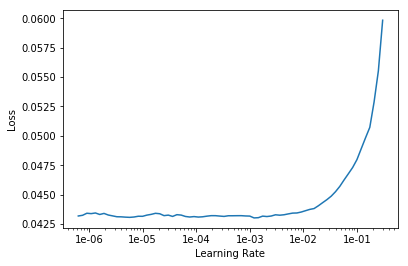

epoch,train_loss,valid_loss,lwlrap,time
0,0.042755,0.020401,0.856749,00:28
1,0.042490,0.019440,0.872099,00:28
2,0.042581,0.020097,0.849413,00:28
3,0.042420,0.020698,0.846904,00:28
4,0.042249,0.021378,0.847453,00:28
5,0.042707,0.021587,0.837580,00:28
6,0.043049,0.021965,0.833528,00:28
7,0.043333,0.022606,0.836849,00:28
8,0.044101,0.026104,0.792257,00:28
9,0.044672,0.028307,0.770110,00:28


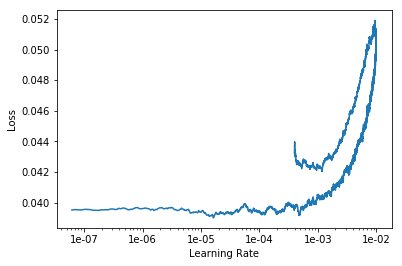

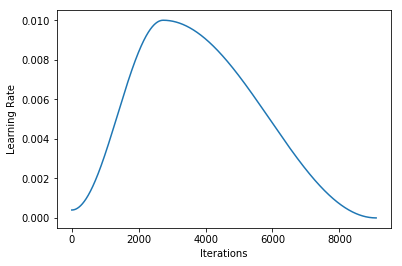

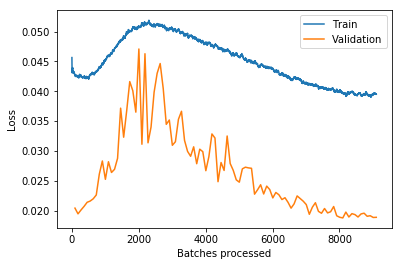

---------------------------------------- CURATED+NOISY+2 - Fold 6/10 ----------------------------------------


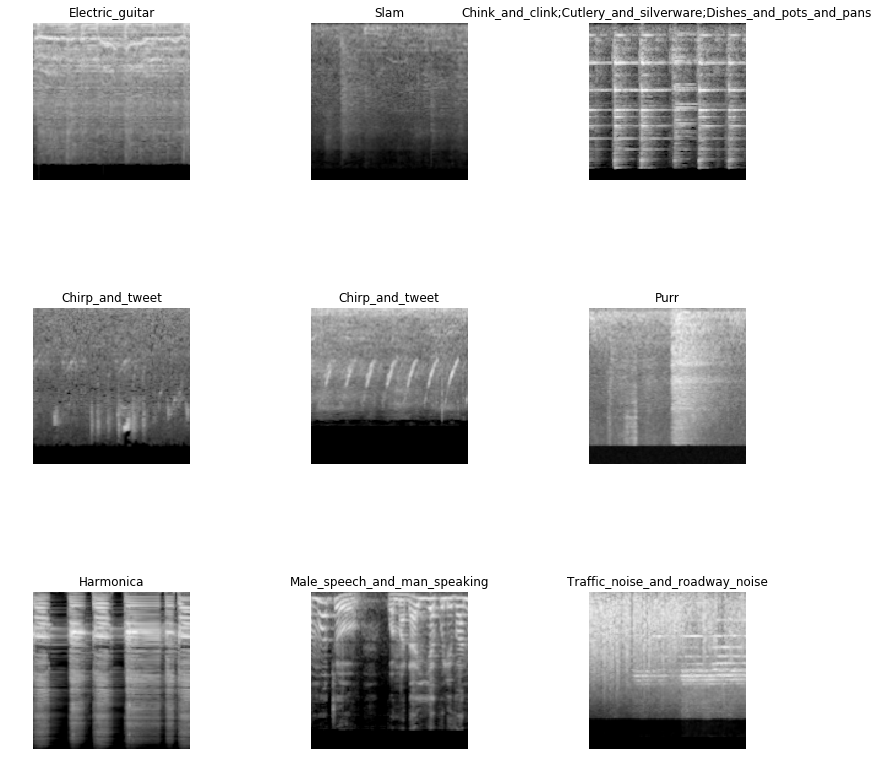

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


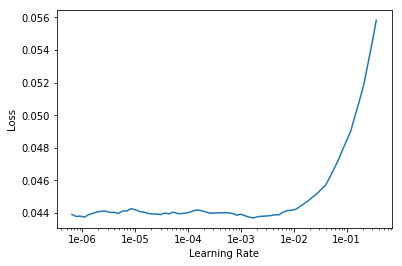

epoch,train_loss,valid_loss,lwlrap,time
0,0.043028,0.019850,0.850044,00:28
1,0.042861,0.019806,0.850240,00:28
2,0.042489,0.021277,0.842763,00:28
3,0.042480,0.022089,0.826565,00:28
4,0.042458,0.022023,0.831203,00:28
5,0.042898,0.021832,0.835009,00:28
6,0.043036,0.024928,0.796979,00:28
7,0.043696,0.023909,0.795459,00:28
8,0.044139,0.024237,0.808137,00:28
9,0.044947,0.027838,0.754402,00:28


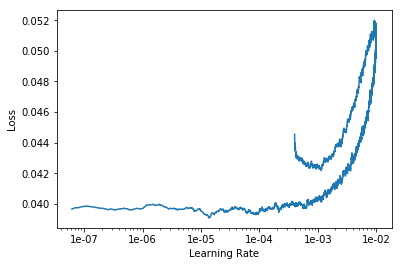

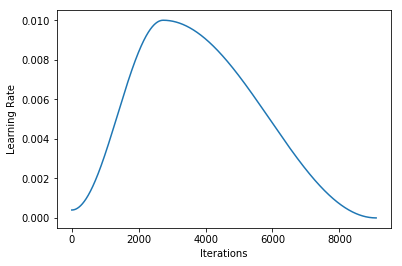

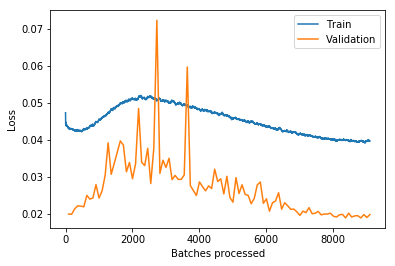

---------------------------------------- CURATED+NOISY+2 - Fold 7/10 ----------------------------------------


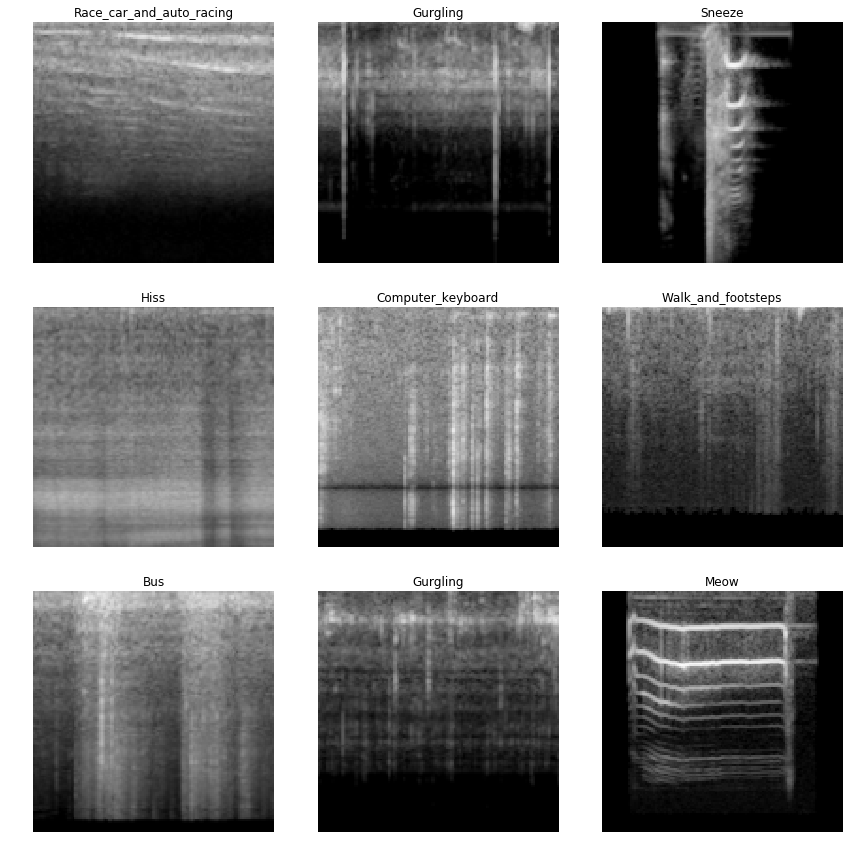

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


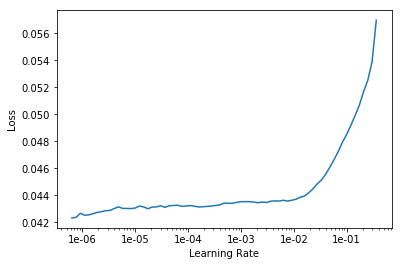

epoch,train_loss,valid_loss,lwlrap,time
0,0.042921,0.019631,0.863024,00:29
1,0.042653,0.019355,0.862083,00:29
2,0.042490,0.018391,0.865054,00:31
3,0.042402,0.018913,0.874159,00:29
4,0.042402,0.019790,0.863554,00:29
5,0.042664,0.021761,0.848285,00:29
6,0.042913,0.021835,0.834962,00:29
7,0.043549,0.021797,0.827482,00:29
8,0.044065,0.022691,0.831820,00:29
9,0.044520,0.024622,0.809264,00:29


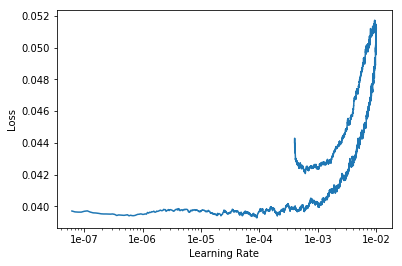

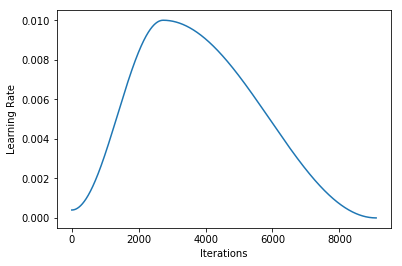

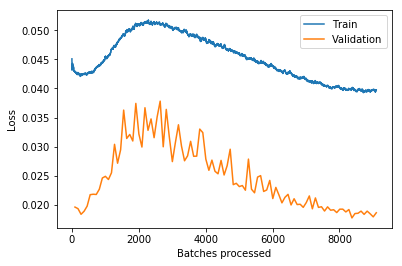

---------------------------------------- CURATED+NOISY+2 - Fold 8/10 ----------------------------------------


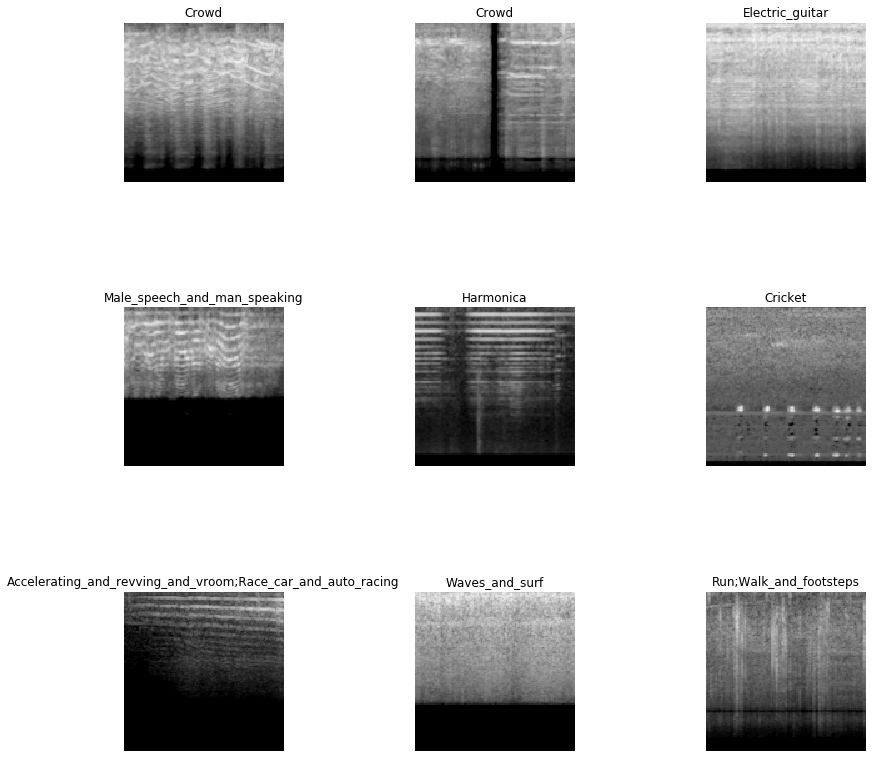

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


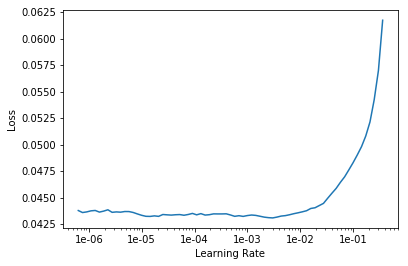

epoch,train_loss,valid_loss,lwlrap,time
0,0.043032,0.020551,0.860047,00:28
1,0.042571,0.020318,0.859572,00:28
2,0.042329,0.021011,0.843818,00:28
3,0.042456,0.021308,0.848391,00:28
4,0.042553,0.022048,0.837199,00:29
5,0.042793,0.022529,0.836762,00:28
6,0.043046,0.021558,0.853350,00:28
7,0.043575,0.023314,0.813656,00:28
8,0.044139,0.024228,0.827587,00:28
9,0.044696,0.031070,0.734769,00:28


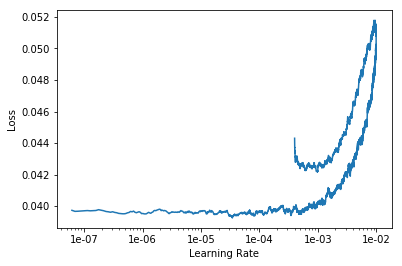

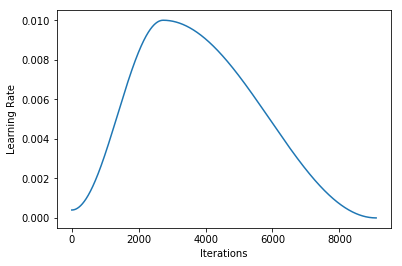

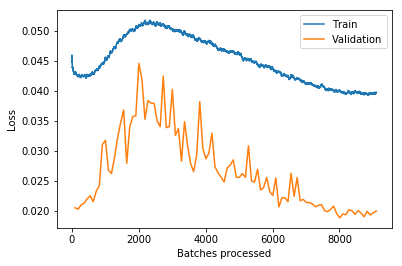

---------------------------------------- CURATED+NOISY+2 - Fold 9/10 ----------------------------------------


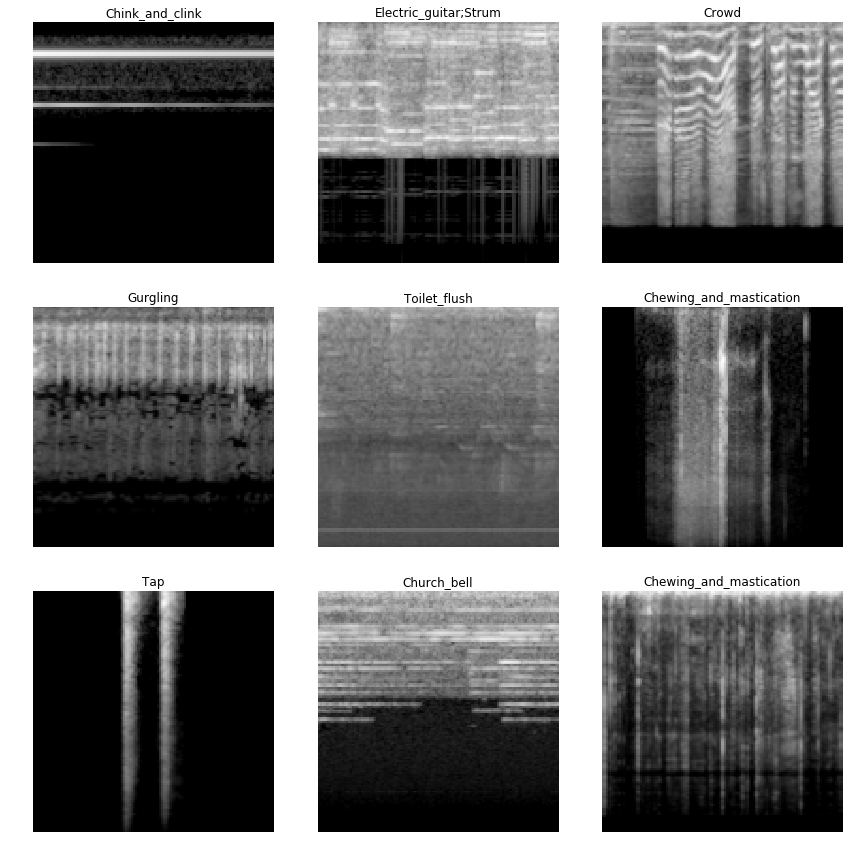

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


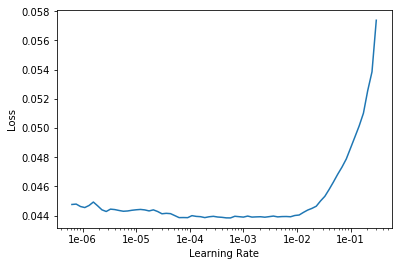

epoch,train_loss,valid_loss,lwlrap,time
0,0.043009,0.020133,0.854789,00:31
1,0.042918,0.019938,0.858473,00:31
2,0.042595,0.019562,0.855153,00:31
3,0.042383,0.021561,0.846836,00:31
4,0.042573,0.019727,0.858404,00:31
5,0.042811,0.021788,0.836047,00:32
6,0.043108,0.022167,0.827666,00:31
7,0.043314,0.023283,0.823623,00:31
8,0.043769,0.023468,0.821826,00:31
9,0.044811,0.023898,0.803154,00:31


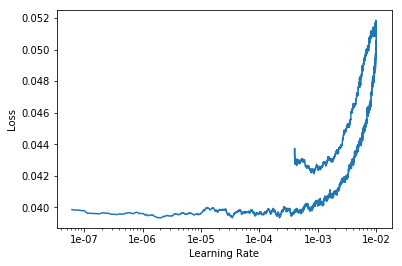

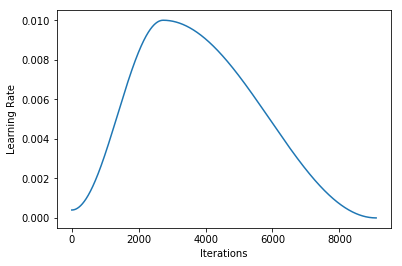

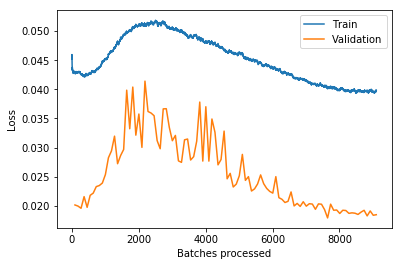

---------------------------------------- CURATED+NOISY+2 - Fold 10/10 ----------------------------------------


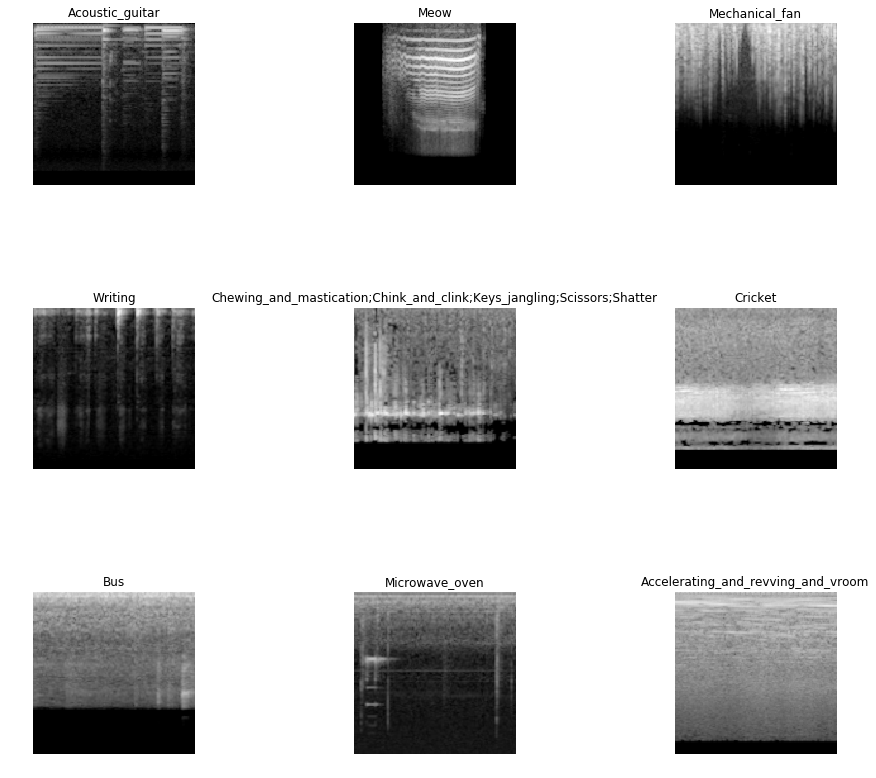

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


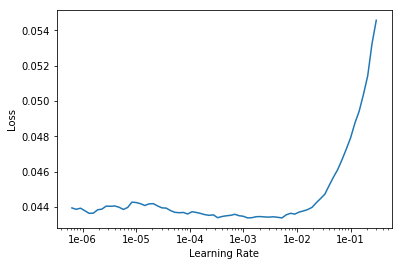

epoch,train_loss,valid_loss,lwlrap,time
0,0.042963,0.020839,0.835666,00:31
1,0.042799,0.020678,0.844583,00:31
2,0.042367,0.020539,0.839177,00:31
3,0.042443,0.021153,0.839919,00:31
4,0.042304,0.021635,0.830909,00:31
5,0.042901,0.021505,0.829510,00:31
6,0.042960,0.024847,0.796706,00:31
7,0.043593,0.024467,0.798468,00:31
8,0.044300,0.023894,0.812451,00:32
9,0.044604,0.027841,0.764079,00:31


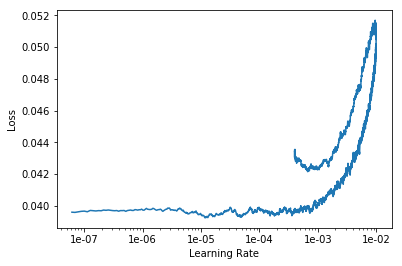

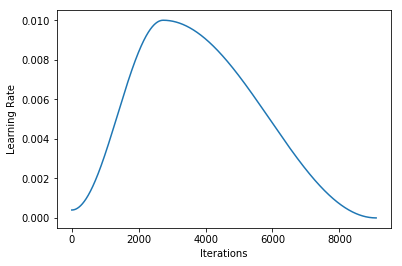

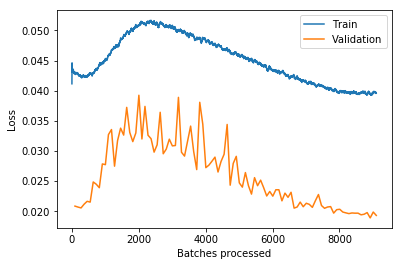

In [44]:
for fold, ((train_index1, valid_index1), (train_index2, valid_index2)) in enumerate(zip(kf_curated.split(trn_curated_df), kf_noisy.split(trn_noisy_df))):
    print('-' * 40, f'CURATED+NOISY+2 - Fold {fold+1}/{n_splits}', '-' * 40)

    train_index2 = list(set(train_index2).intersection(set(ok_noisy_items2)))
    
    mix_df = pd.concat([
        trn_curated_df.iloc[train_index1],
        trn_noisy_df.iloc[train_index2],
        trn_curated_df.iloc[valid_index1],
#         trn_noisy_df.iloc[valid_index2],  # compute lwlrap only on curated
    ], ignore_index=True)
    train_index = mix_df[:len(train_index1)+len(train_index2)].index
    valid_index = mix_df[len(train_index1)+len(train_index2):].index

    
    src = (ImageList.from_df(mix_df, WORK)
           .split_by_idxs(train_index, valid_index)
           .label_from_df(label_delim=',')
    )
    data = (src.transform(tfms, size=128)
            .databunch(bs=bs)
    )
    data.show_batch(3)
    plt.show()
    
    learn.load(f'stage-10_fold-{fold}')
    learn.data = data

    learning(learn, 100, 1e-2)
    
    learn.save(f'stage-11_fold-{fold}')
    learn.export(f'stage-11_fold-{fold}.pkl')
    
    if TOY_MODE:
        break

In [45]:
kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-11_fold-{fold}')

Overall lwlrap on CURATED dataset: 0.8846200848932246


,lwlrap,weight
Fill_(with_liquid),0.658388,0.008693
Squeak,0.679500,0.013039
Mechanical_fan,0.687030,0.008519
Walk_and_footsteps,0.720895,0.013039
Hiss,0.755910,0.013039
Tap,0.770000,0.013039
Male_speech_and_man_speaking,0.771817,0.013039
Chink_and_clink,0.775800,0.013039
Cutlery_and_silverware,0.777220,0.013039
Buzz,0.778739,0.009736


In [46]:
kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-11_fold-{fold}')

Overall lwlrap on NOISY dataset: 0.5823532924290014


,lwlrap,weight
Burping_and_eructation,0.075615,0.0125
Raindrop,0.125448,0.0125
Finger_snapping,0.146021,0.0125
Cupboard_open_or_close,0.198613,0.0125
Sigh,0.201656,0.0125
Zipper_(clothing),0.217091,0.0125
Keys_jangling,0.221410,0.0125
Writing,0.239949,0.0125
Gasp,0.241696,0.0125
Buzz,0.258949,0.0125


In [47]:
# m5 = lwlrap_per_sample('stage-11_fold-{fold}', kf_noisy, trn_noisy_df)

In [48]:
# (m5.lwlrap < .5).sum(), (m5.lwlrap >= .5).sum(), (m5.lwlrap == 1).sum()

In [49]:
# ok_noisy_items3 = m5[m5.lwlrap == 1].index
# len(ok_noisy_items3)

In [50]:
# for fold, ((train_index1, valid_index1), (train_index2, valid_index2)) in enumerate(zip(kf_curated.split(trn_curated_df), kf_noisy.split(trn_noisy_df))):
#     print('-' * 40, f'CURATED+NOISY+3 - Fold {fold+1}/{n_splits}', '-' * 40)

#     train_index2 = list(set(train_index2).intersection(set(ok_noisy_items3)))
    
#     mix_df = pd.concat([
#         trn_curated_df.iloc[train_index1],
#         trn_noisy_df.iloc[train_index2],
#         trn_curated_df.iloc[valid_index1],
# #         trn_noisy_df.iloc[valid_index2],  # compute lwlrap only on curated
#     ], ignore_index=True)
#     train_index = mix_df[:len(train_index1)+len(train_index2)].index
#     valid_index = mix_df[len(train_index1)+len(train_index2):].index

    
#     src = (ImageList.from_df(mix_df, WORK)
#            .split_by_idxs(train_index, valid_index)
#            .label_from_df(label_delim=',')
#     )
#     data = (src.transform(tfms, size=128)
#             .databunch(bs=bs)
#     )
#     data.show_batch(3)
#     plt.show()
    
#     learn.load(f'stage-11_fold-{fold}')
#     learn.data = data

#     learning(learn, 100, 1e-2)
    
#     learn.save(f'stage-12_fold-{fold}')
#     learn.export(f'stage-12_fold-{fold}.pkl')
    
#     if TOY_MODE:
#         break

In [52]:
# kfold_lwlrap('CURATED', kf_curated, trn_curated_df, 'stage-12_fold-{fold}')

In [ ]:
# kfold_lwlrap('NOISY', kf_noisy, trn_noisy_df, 'stage-12_fold-{fold}')

## Test prediction and submission file creation
- Switch to test data.
- Overwrite results to sample submission; simple way to prepare submission file.

In [ ]:
X_test = pickle.load(open(MELS_TEST, 'rb'))
CUR_X_FILES, CUR_X = list(test_df.fname.values), X_test

In [ ]:
output = StringIO()
csv_writer = writer(output)
csv_writer.writerow(test_df.columns)

for _, row in tqdm_notebook(test_df.iterrows(), total=test_df.shape[0]):
    idx = CUR_X_FILES.index(row.fname)
    time_dim = CUR_X[idx].shape[1]
    s = math.ceil((time_dim-conf.n_mels) / TTA_SHIFT) + 1
    
    fname = row.fname
    for crop_x in [int(np.around((time_dim-conf.n_mels)*x/(s-1))) if s != 1 else 0 for x in range(s)]:
        row.fname = fname + '!' + str(crop_x)
        csv_writer.writerow(row)

output.seek(0)
test_df_multi = pd.read_csv(output)

In [ ]:
test = ImageList.from_df(test_df_multi, WORK)

In [ ]:
for fold in range(n_splits):
    learn = load_learner(WORK, f'stage-12_fold-{fold}.pkl', test=test)
    preds, _ = learn.get_preds(ds_type=DatasetType.Test)
    preds = preds.cpu().numpy()
#     preds = pd.DataFrame(preds).rank(1) / preds.shape[1]
    if fold == 0:
        predictions = preds
    else:
        predictions += preds
    if TOY_MODE:
        break
predictions /= n_splits

In [ ]:
test_df_multi[learn.data.classes] = predictions
test_df_multi['fname'] = test_df_multi.fname.apply(lambda x: x.split('!')[0])

In [ ]:
test_df_multi.head()

In [ ]:
submission = test_df_multi.infer_objects().groupby('fname').mean().reset_index()

In [ ]:
submission.to_csv('submission.csv', index=False)
submission.head()

In [ ]:
submission.set_index('fname').idxmax(1)